# Dataset was taken from http://www.statmt.org/europarl/

In [3]:
import numpy as np
import pandas as pd
import os
import re
from nltk.tokenize import sent_tokenize
from sklearn import feature_extraction
from sklearn import linear_model
from sklearn import pipeline
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.naive_bayes import MultinomialNB
import time

In [4]:
max_req_len = 2000000

In [5]:
lang_index = { 
          1:'Danish', 2:'German', 3: 'English', 
          4: 'Spanish',5: 'Finnish', 
          6: 'French', 7: 'Italian', 
          8: 'Dutch', 9: 'Portuguese', 
          10: 'Swedish', 11: 'Bulgarian',
          12: 'Czech', 13: 'Estonian',
          14: 'Hungarian', 15: 'Lithuanian',
          16: 'Latvian', 17: 'Polish',
          18: 'Romanian', 19: 'Slovak',
          20: 'Slovenian'
          }

#blugarian, czech, estonian, lithianian, slovenian, polish, latvian, romanian, slovak

In [6]:
all_lang = {
    'Danish': ['da', '/Danish.txt'], 'German': ['de', '/German.txt'], 'English': ['en', '/English.txt'], 
    'Spanish': ['es', '/Spanish.txt'], 'Finnish': ['fi', '/Finnish.txt'],
    'French': ['fr','/French.txt'], 'Italian': ['it', '/Italian.txt'], 
    'Dutch': ['nl', '/Dutch.txt'], 'Portuguese': ['pt', '/Portuguese.txt'], 
    'Swedish': ['sv', '/Swedish.txt'], 'Bulgarian': ['bg', '/Bulgarian.txt'],
    'Czech': ['cs', '/Czech.txt'], 'Estonian': ['et', '/Estonian.txt'],
    'Hungarian': ['hu', '/Hungarian.txt'], 'Lithuanian': ['lt', '/Lithuanian.txt'],
    'Latvian': ['lv', '/Latvian.txt'], 'Polish': ['pl', '/Polish.txt'],
    'Romanian': ['ro', '/Romanian.txt'], 'Slovak': ['sk', '/Slovak.txt'],
    'Slovenian': ['sl', '/Slovenian.txt']
}
len(all_lang)

20

In [7]:
#sare path store kr lia
all_paths = []

for l in all_lang:
    all_paths.append(os.getcwd() + '/txt/' + all_lang[l][0] + all_lang[l][1])
all_paths

['/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/da/Danish.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/de/German.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/en/English.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/es/Spanish.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/fi/Finnish.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/fr/French.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/it/Italian.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/nl/Dutch.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/pt/Portuguese.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/sv/Swedish.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/bg/Bulgarian.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/cs/Czech.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/et/Estonian.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/hu/Hungarian.txt',
 '/Users/sanskrititomar/ML/LANGUAGE DETECTION/txt/lt/Lithuani

In [8]:
def combine_incomplete_files(code, lang):    
    
    lang_list = os.listdir('txt/' + code + '/')
    new_file = ''
    for file_name in lang_list:
        if(len(new_file) >= max_req_len):
            break;
        cwd = os.getcwd() + '/txt/' + code + '/' + file_name
        
        with open(cwd,'r') as f:
            content = f.read()
            new_file += content
    
    write_path = os.getcwd() + '/txt/' + code + '/' + lang + '.txt'
    with open(write_path, 'w') as f:
        f.write(new_file)

In [9]:
for l in all_lang.keys():
     combine_incomplete_files(all_lang[l][0], l)

In [10]:
def slice_files(cwd):
    with open(cwd) as f:
        new_file = f.read()
        new_file = new_file[:max_req_len]
    return new_file


#to shorten large data files to required size

trimmed_lang = []

for path in all_paths:
    trimmed_lang.append(slice_files(path))

print(trimmed_lang[0])

<CHAPTER ID="009-06">
6. Innovativ finansiering på globalt og europæisk plan (
<SPEAKER ID="141" NAME="Jean-Paul Gauzès" AFFILIATION="PPE">
(FR) Fru formand! Jeg beklager, at der er en vis forvirring i denne betænkning af fru Podimata, som rejser en række vigtige aspekter af innovativ finansiering. Jeg vil gerne bede Gruppen for Det Progressive Forbund af Socialdemokrater i Parlamentet om at trække deres alternative forslag tilbage, så vi kan afslutte det fælles arbejde med udkastet.
<P>
For det andet beklager jeg, at der er skabt en lidt kunstig modsætning vedrørende spørgsmålet om en skat på finansielle transaktioner, og at der er to meget enslydende ændringsforslag. Jeg beklager, at Parlamentet af den grund ikke kan udtrykke overvældende støtte til denne skat under forhold, der er rimelige med hensyn til Europas konkurrenceevne.
<SPEAKER ID="142" NAME="Martin Schulz" AFFILIATION="S&amp;D">
(DE) Fru formand! Jeg kan sige følgende til hr. Gauzès: Ja, vi agter at trække forslaget til a

In [19]:
# import nltk
# nltk.download()

showing info https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/index.xml


True

In [18]:
!pip install nltk

In [11]:

#make list of sentences
for i, l in enumerate(trimmed_lang):
        trimmed_lang[i] = sent_tokenize(l)
        
print(trimmed_lang[0])

['<CHAPTER ID="009-06">\n6.', 'Innovativ finansiering på globalt og europæisk plan (\n<SPEAKER ID="141" NAME="Jean-Paul Gauzès" AFFILIATION="PPE">\n(FR) Fru formand!', 'Jeg beklager, at der er en vis forvirring i denne betænkning af fru Podimata, som rejser en række vigtige aspekter af innovativ finansiering.', 'Jeg vil gerne bede Gruppen for Det Progressive Forbund af Socialdemokrater i Parlamentet om at trække deres alternative forslag tilbage, så vi kan afslutte det fælles arbejde med udkastet.', '<P>\nFor det andet beklager jeg, at der er skabt en lidt kunstig modsætning vedrørende spørgsmålet om en skat på finansielle transaktioner, og at der er to meget enslydende ændringsforslag.', 'Jeg beklager, at Parlamentet af den grund ikke kan udtrykke overvældende støtte til denne skat under forhold, der er rimelige med hensyn til Europas konkurrenceevne.', '<SPEAKER ID="142" NAME="Martin Schulz" AFFILIATION="S&amp;D">\n(DE) Fru formand!', 'Jeg kan sige følgende til hr.', 'Gauzès: Ja, vi 

In [12]:

def remove_unwanted_characters(sentences):
    for i, s in enumerate(sentences):
        sentences[i] = re.sub('[^a-zA-Z]+',' ',s)
        
        #sentence = remove_tags(sen)

        # Remove punctuations and numbers
        sentences[i] = re.sub('[^a-zA-Z]', ' ', sentences[i])

        # Single character removal
        sentences[i] = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentences[i])

        # Removing multiple spaces
        sentences[i] = re.sub(r'\s+', ' ', sentences[i])
        sentences[i] = re.sub('<[^>]+>', '', s)
# #         print(sentences[i])
        sentences[i] = re.sub('[^a-zA-Z]+',' ',s)
        if('SPEAKER' in sentences[i]):
            sentences[i] = ""
        if('CHAPTER ID' in sentences[i]):
            sentences[i]=""
 
        
#clean text using REGEX
for s in trimmed_lang:
        remove_unwanted_characters(s)

        
trimmed_lang[2]




['',
 '',
 'I would like to ask the Group of the Progressive Alliance of Socialists and Democrats in the European Parliament to withdraw the alternative motion it has tabled so that the joint drafting work that has been carried out can be concluded ',
 ' P Secondly I regret that a slightly artificial opposition has emerged on the issue of a tax on financial transactions and that there are two very similar amendments ',
 'I regret that as a result Parliament cannot express its overwhelming support for this tax in conditions that are reasonable with regard to Europe s competitiveness ',
 '',
 'I recommended this to my group for a very simple reason The following amendment which has been signed by Members from all groups shows that proposals regarding a financial transaction tax are not the preserve of any one group whether the socialists conservatives the Group of the European People s Party Christian Democrats or the Group of the Greens European Free Alliance ',
 'The point is that we a

In [13]:
for i in range(len(trimmed_lang)):
#     while j in range(len(trimmed_lang[i])):
#         if(trimmed_lang[i][j] == '' and trimmed_lang[i][j+1] == ','):
#             del(trimmed_lang[i][j])
#             del(trimmed_lang[i][j+1])
    while('' in trimmed_lang[i]) : 
        trimmed_lang[i].remove('')
        
        



In [14]:
trimmed_lang

[['Jeg beklager at der er en vis forvirring i denne bet nkning af fru Podimata som rejser en r kke vigtige aspekter af innovativ finansiering ',
  'Jeg vil gerne bede Gruppen for Det Progressive Forbund af Socialdemokrater i Parlamentet om at tr kke deres alternative forslag tilbage s vi kan afslutte det f lles arbejde med udkastet ',
  ' P For det andet beklager jeg at der er skabt en lidt kunstig mods tning vedr rende sp rgsm let om en skat p finansielle transaktioner og at der er to meget enslydende ndringsforslag ',
  'Jeg beklager at Parlamentet af den grund ikke kan udtrykke overv ldende st tte til denne skat under forhold der er rimelige med hensyn til Europas konkurrenceevne ',
  'Jeg kan sige f lgende til hr ',
  'Gauz s Ja vi agter at tr kke forslaget til alternativ beslutning tilbage ',
  'Det anbefalede jeg min gruppe af en meget enkel grund nemlig at f lgende ndringsforslag der er underskrevet af medlemmer fra alle grupper viser at forslagene vedr rende en skat p finansiel

In [15]:
trimmed_lang[2]

['I would like to ask the Group of the Progressive Alliance of Socialists and Democrats in the European Parliament to withdraw the alternative motion it has tabled so that the joint drafting work that has been carried out can be concluded ',
 ' P Secondly I regret that a slightly artificial opposition has emerged on the issue of a tax on financial transactions and that there are two very similar amendments ',
 'I regret that as a result Parliament cannot express its overwhelming support for this tax in conditions that are reasonable with regard to Europe s competitiveness ',
 'I recommended this to my group for a very simple reason The following amendment which has been signed by Members from all groups shows that proposals regarding a financial transaction tax are not the preserve of any one group whether the socialists conservatives the Group of the European People s Party Christian Democrats or the Group of the Greens European Free Alliance ',
 'The point is that we are making an in

In [16]:
#this function converts sentences to words
def tokenize_sentences(s):
    lis = []
    for i in s:
        if(len(i)>1):
            lis.append(i.split(" "))
    return lis
        

In [17]:
def combine_lang(sentences,label):
#     print((sentences))
#     sentences = sentences.split("<SPEAKER ID")
#     print(type(sentences))
    sentences = np.array(sentences)
    x = tokenize_sentences(sentences)
    lis = []
    for i in x:
        lis.append(i) 
    lis = np.array(lis)
    print(lis.shape)
    lis = lis.reshape(lis.shape[0],1)
    target = np.zeros((lis.shape[0],1), dtype = 'uint32')
    for i in range(target.shape[0]):
        target[i] = label
#     target += int(label)
    language_data = np.hstack((lis, target))
    return language_data

languages_with_index = []

for i,s in enumerate(trimmed_lang):
    if(s == ' '):
        continue
    languages_with_index.append(combine_lang(s,i+1)) 

languages_with_index = np.vstack((languages_with_index))
languages_with_index = np.array(languages_with_index)

<ipython-input-17-e50c6ea8fd14>:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  lis = np.array(lis)


(14751,)
(12198,)
(12312,)
(11367,)
(12822,)
(11242,)
(10827,)
(12367,)
(11334,)
(13747,)
(3000,)
(13790,)
(13388,)
(11868,)
(13289,)
(12895,)
(12380,)
(10693,)
(12762,)
(12787,)


In [18]:
languages_with_index[0][0]

['Jeg',
 'beklager',
 'at',
 'der',
 'er',
 'en',
 'vis',
 'forvirring',
 'i',
 'denne',
 'bet',
 'nkning',
 'af',
 'fru',
 'Podimata',
 'som',
 'rejser',
 'en',
 'r',
 'kke',
 'vigtige',
 'aspekter',
 'af',
 'innovativ',
 'finansiering',
 '']

In [19]:
words_with_index = []
for i in range(languages_with_index.shape[0]):
    for j in languages_with_index[i][0]:
        if(len(j) > 1):
            lis = []
            lis.append(j)
            lis.append(languages_with_index[i][1])
            words_with_index.append(lis)

In [20]:
words_with_index = np.array(words_with_index)
words_with_index.shape

(5006397, 2)

In [21]:
words_with_index[:][:]

array([['Jeg', '1'],
       ['beklager', '1'],
       ['at', '1'],
       ...,
       ['trgovinskega', '20'],
       ['pogajalca', '20'],
       ['ZDA', '20']], dtype='<U37')

In [22]:
newdf = pd.DataFrame(words_with_index)
newdf.columns = ['words','label']
newdf

,words,label
0,Jeg,1
1,beklager,1
2,at,1
3,der,1
4,er,1
...,...,...
5006392,ne,20
5006393,bo,20
5006394,trgovinskega,20
5006395,pogajalca,20


In [23]:
# unique_words_list = []
# for j in unique_words:
#     print(j)
#     temp = []
#     temp.append(j)
#     index = newdf[newdf['words']==j].index.values[0]
#     temp.append(newdf.label[index])
#     unique_words_list.append(temp)

In [ ]:
# unique_words_list = np.array(unique_words_list)
# print(unique_words_list.shape)
# unique_words_list

In [192]:
words_with_index

array([['Jeg', '1'],
       ['beklager', '1'],
       ['at', '1'],
       ...,
       ['trgovinskega', '20'],
       ['pogajalca', '20'],
       ['ZDA', '20']], dtype='<U37')

In [193]:
word_dict = {}


for i in range(words_with_index.shape[0]):
    word_dict[words_with_index[i][0]] = words_with_index[i][1]

word_dict

{'Jeg': '1',
 'beklager': '1',
 'at': '20',
 'der': '19',
 'er': '20',
 'en': '20',
 'vis': '19',
 'forvirring': '1',
 'denne': '19',
 'bet': '16',
 'nkning': '10',
 'af': '16',
 'fru': '10',
 'Podimata': '20',
 'som': '20',
 'rejser': '1',
 'kke': '13',
 'vigtige': '1',
 'aspekter': '10',
 'innovativ': '10',
 'finansiering': '10',
 'vil': '19',
 'gerne': '2',
 'bede': '1',
 'Gruppen': '10',
 'for': '19',
 'Det': '10',
 'Progressive': '3',
 'Forbund': '1',
 'Socialdemokrater': '1',
 'Parlamentet': '14',
 'om': '19',
 'tr': '20',
 'deres': '9',
 'alternative': '18',
 'forslag': '1',
 'tilbage': '1',
 'vi': '20',
 'kan': '19',
 'afslutte': '1',
 'det': '19',
 'lles': '10',
 'arbejde': '1',
 'med': '20',
 'udkastet': '1',
 'For': '18',
 'andet': '1',
 'jeg': '1',
 'skabt': '1',
 'lidt': '1',
 'kunstig': '1',
 'mods': '10',
 'tning': '10',
 'vedr': '7',
 'rende': '10',
 'sp': '19',
 'rgsm': '1',
 'let': '20',
 'skat': '16',
 'finansielle': '1',
 'transaktioner': '10',
 'og': '17',
 'to': '

In [194]:
unique_words = []

for key in word_dict:
    temp = []
    temp.append(key)
    temp.append(word_dict[key])
    unique_words.append(temp)

In [196]:
unique_words = np.array(unique_words)

In [197]:
unique_words.shape

(305620, 2)

In [198]:
#shuffling all the sentences
i = np.arange(0, unique_words.shape[0])
np.random.shuffle(i)
unique_words = unique_words[i,:]


In [200]:
unique_words

array([['Manis', '16'],
       ['gadadiena', '16'],
       ['neinformuojant', '15'],
       ...,
       ['toruje', '17'],
       ['moru', '19'],
       ['globalizacja', '17']], dtype='<U37')

In [26]:
np.fromstring?

In [207]:
# creating data frame with all the sentences
df = pd.DataFrame(unique_words)
df.columns = ['words', 'label']
df['label'] = df['label'].apply(float)
df['language'] = df['label'].map(lang_index)

df


,words,label,language
0,Manis,16.0,Latvian
1,gadadiena,16.0,Latvian
2,neinformuojant,15.0,Lithuanian
3,rsas,14.0,Hungarian
4,llningarna,10.0,Swedish
...,...,...,...
305615,honger,8.0,Dutch
305616,abspielt,2.0,German
305617,toruje,17.0,Polish
305618,moru,19.0,Slovak


In [221]:
df = df[df.language != 'Bulgarian']

In [223]:
df

,words,label,language
0,Manis,16.0,Latvian
1,gadadiena,16.0,Latvian
2,neinformuojant,15.0,Lithuanian
3,rsas,14.0,Hungarian
4,llningarna,10.0,Swedish
...,...,...,...
305615,honger,8.0,Dutch
305616,abspielt,2.0,German
305617,toruje,17.0,Polish
305618,moru,19.0,Slovak


In [224]:
print(df.shape)
print(df['language'].value_counts())
freq_list = df['language'].value_counts()

(305603, 3)
Estonian      30691
Finnish       30386
Slovenian     22902
Lithuanian    21554
Polish        19944
German        18059
Swedish       16460
Hungarian     15925
Slovak        15461
Dutch         14542
Italian       14288
Romanian      13615
Portuguese    13582
Danish        13561
Latvian       11554
French        10128
Spanish       10057
English        8742
Czech          4152
Name: language, dtype: int64


In [229]:
language_list = [ 'Estonian',
'Finnish',
'Slovenian',
'Lithuanian',
'Polish',
'German',
'Swedish',
'Hungarian',
'Slovak',
'Dutch',
'Italian',
'Romanian',
'Portuguese',
'Danish',
'Latvian',
'French',
'Spanish',
'English','Czech']

In [230]:
# for i in 
df['language'][1]

'Latvian'

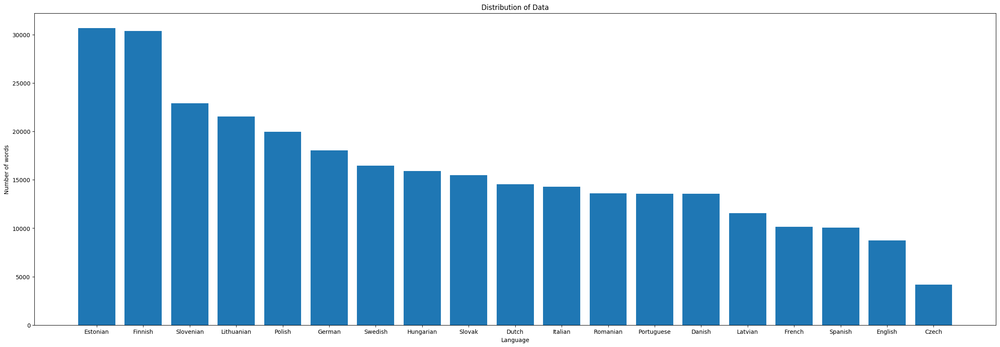

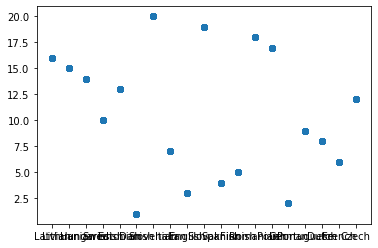

In [231]:
import matplotlib.pyplot as plt
# Data distribution
fig=plt.figure(figsize=(30, 10), dpi= 100, facecolor='white', edgecolor='red')
plt.bar(language_list,freq_list)
plt.xticks(rotation=0)
plt.title('Distribution of Data')
plt.xlabel('Language')
plt.ylabel('Number of words')
plt.show()
plt.scatter(df['language'], df['label'])


In [234]:
unique_words[:,0]

array(['Manis', 'gadadiena', 'neinformuojant', ..., 'toruje', 'moru',
       'globalizacja'], dtype='<U37')

In [235]:
unique_words[:,1]

array(['16', '16', '15', ..., '17', '19', '17'], dtype='<U37')

### Splitting data into test and training data 

In [253]:
X_train, X_test, y_train, y_test = train_test_split(unique_words[:,0], 
                                                    unique_words[:,1],
                                                    test_size = 0.15,
                                                    random_state = 0)

# X_train, X_test, y_train, y_test = train_test_split(df['sentences'], 
#                                                     df['label'],
#                                                     test_size = 0.25,
#                                                     random_state = 0)

In [254]:
def encode_data(X):
    lis = []
    for i in X:
        mybytes = i.encode('utf-8')
        myint = int.from_bytes(mybytes, 'little')
        lis.append(myint)
    return lis

In [404]:
X_train_encoded = encode_data(X_train)
X_train_encoded = np.array(X_train_encoded)
X_test_encoded = encode_data(X_test)
X_test_encoded = np.array(X_test_encoded)

In [405]:
X_train_encoded.shape

(259777,)

In [406]:
X_test.shape

(45843,)

In [407]:
X_test_encoded.reshape(45843,)

array([145412635431607794460192126119610705229, 448563606123,
       111541935108978, ..., 118121958831730, 448345175364,
       7954872530222998888], dtype=object)

In [408]:
z = np.ones((X_train.shape[0],1), dtype = 'int')
z

array([[1],
       [1],
       [1],
       ...,
       [1],
       [1],
       [1]])

In [409]:
X_train_encoded = X_train_encoded.reshape(1,259777)

In [451]:
#load data as numpy array using genfromtxt
#no of samples
m = X_train_encoded.shape[0]

#input(Features) last column is the output column so slicing the train_data based on that 
X = X_train_encoded
X.shape
#As we are using vector implementation adding a column in X with all the value 1
X = np.hstack((np.ones((m,1)),X))

# #output
Y = y_train

In [452]:
X.shape
Y.shape

(259777,)

# Failed Logistic Regression 

In [453]:
# theta = np.zeros((X.shape[1]))
# theta.shape

(259778,)

In [454]:
# X.shape

(1, 259778)

In [455]:
# theta = np.array(theta,  dtype = 'float')

In [456]:
# X.dtype

dtype('O')

In [457]:
# theta.dtype

dtype('float64')

In [458]:
# X = X.reshape((259778))

In [459]:
# for i in range(X.shape[1]):
#     X[1][i].astype(np.float)
#     X[0][i].astype(np.float)

In [465]:
# print(X.shape)
# print(theta.shape)

(259778,)
(259778,)


In [468]:
# Y = np.insert(Y, 0, 0., axis=0)
# Y.shape
# Y

array([ 0., 20.,  5., ..., 13., 19., 20.])

In [463]:
# Y = Y.astype(np.float)

In [480]:

# #learning rate
# learning_rate = 0.001

# #no of iterations we want our model to be trained
# no_of_iterations = 10

# #to visualise the cost function
# cost_arr = np.empty((0,1))

# #counter
# i = 1
# X = X/m
# def sigmoid(z):
#     return 1 / (1 + np.exp(-z))

# for i in range(no_of_iterations):
    
#     #model/hypothesis function
#     lineq = np.dot(X, theta.T)
# #     a = map(float,X)
# #     b = map(float,theta)
# #     a = np.array(a)
# #     b = np.array(b)
# #     a = np.array(X)
#     #a = a.astype(np.float)
# #     a = np.mat(X)
# #     b = np.mat(theta)
# #     print(a.dtype)
# #     lineq = np.dot(a,b.T)

#     #np.dot(a,b.T)
#     h = sigmoid(float(lineq))
    
#     #cost function -1/m * sum (y log h + (1-y)log(1-h))for each class
#     cost = -1/m * ((Y * np.log(h)) + ((1-Y) * np.log(1-h)))
#     print(cost)
#     cost = cost.sum(axis = 0)
    
#     cost_arr = np.vstack((cost_arr, cost))
    
#     #applying gradient descent to calculate new theta = theta - (learning_rate/m * summation[(h-y)*x]) -> delta
#     #summation can be replace by matrix multiplication
#     delta = (learning_rate) * np.dot((Y-h), X.T)
#     theta = theta + (delta)/m  
    
#     i = i + 1;
#     print(i)

<ipython-input-480-9c09360788fe>:35: RuntimeWarning: divide by zero encountered in log
  cost = -1/m * ((Y * np.log(h)) + ((1-Y) * np.log(1-h)))
<ipython-input-480-9c09360788fe>:35: RuntimeWarning: invalid value encountered in multiply
  cost = -1/m * ((Y * np.log(h)) + ((1-Y) * np.log(1-h)))


[ inf -inf -inf ... -inf -inf -inf]
1
[ inf -inf -inf ... -inf -inf -inf]
2
[ inf -inf -inf ... -inf -inf -inf]
3
[ inf -inf -inf ... -inf -inf -inf]
4
[ inf -inf -inf ... -inf -inf -inf]
5
[ inf -inf -inf ... -inf -inf -inf]
6
[ inf -inf -inf ... -inf -inf -inf]
7
[ inf -inf -inf ... -inf -inf -inf]
8
[ inf -inf -inf ... -inf -inf -inf]
9
[ inf -inf -inf ... -inf -inf -inf]
10


In [483]:
X_train

array(['upanje', 'paikallisviranomaisia', 'importowa', ..., 'viimastes',
       'rozkladn', 'Bolgarsko'], dtype='<U37')

In [487]:
trimmed_lang[2][0]

'I would like to ask the Group of the Progressive Alliance of Socialists and Democrats in the European Parliament to withdraw the alternative motion it has tabled so that the joint drafting work that has been carried out can be concluded '

In [489]:
trimmed_lang = np.array()

20

In [509]:
def combine_lang_to_sentences(sentences,label):
    sentences = np.array(sentences)
    sentences = sentences.reshape(sentences.shape[0],1)
    target = np.zeros((sentences.shape[0],1), dtype = 'uint32')
    target += label
    language_data = np.hstack((sentences, target))
    return language_data

languages_with_index = []

for i,s in enumerate(trimmed_lang):
    languages_with_index.append(combine_lang_to_sentences(s,i+1)) 

languages_with_index = np.vstack((languages_with_index))
languages_with_index = np.array(languages_with_index)

In [510]:
languages_with_index[0][0]

'Jeg beklager at der er en vis forvirring i denne bet nkning af fru Podimata som rejser en r kke vigtige aspekter af innovativ finansiering '

In [511]:
languages_with_index[0][1]

'1'

In [512]:
unique_words

array([['Manis', '16'],
       ['gadadiena', '16'],
       ['neinformuojant', '15'],
       ...,
       ['toruje', '17'],
       ['moru', '19'],
       ['globalizacja', '17']], dtype='<U37')

In [531]:

def tokenize_sentences2(s):
    lis = []
    if(len(s)>1):
        lis.append(s.split(" "))

    return lis
        

In [540]:
word_dict['pirmininke']

'15'

# KNN - Hardcoded

In [602]:
count = 0
leng = int(languages_with_index.shape[0]-0.25*languages_with_index.shape[0])
for i in range(0,languages_with_index.shape[0]):
#     for j in languages_with_index[i][0]:
    lis = tokenize_sentences2(languages_with_index[i][0])
    lis = np.array(lis)
    res = []
#     print(lis.shape)
    if lis.size == 0:
        continue
    for k in range(lis.shape[1]):
        if len(lis[0][k])>1:
            if(lis[0][k] in unique_words):
                res.append(word_dict[lis[0][k]])
    res = np.array(res, dtype = "uint32")
    counts = np.bincount(res)
    if res.size == 0:
        continue
    prediction = (np.argmax(counts))
    c = languages_with_index[i][1].astype(np.float)
    if prediction == c:
        count = count + 1
    print(count)

0
1
2
3
4
5
6
6
6
6
7
8
8
8
9
10
11
12
13
14
15
16
17
18
19
19
20
21
22
23
24
24
25
25
26
27
28
29
29
30
31
32
32
33
34
35
36
36
37
37
38
39
40
41
42
43
44
44
45
46
46
47
48
49
50
51
51
52
52
52
53
54
55
56
57
58
59
60
61
62
63
64
64
65
66
67
68
68
68
69
70
71
72
73
74
75
75
75
76
76
77
78
78
79
80
81
82
83
84
85
86
87
88
88
89
90
91
92
93
94
94
95
96
97
98
98
99
100
101
102
102
103
104
105
106
107
108
109
110
111
111
112
113
114
115
115
116
117
118
119
120
121
122
123
124
125
126
126
127
128
129
130
131
131
132
133
134
135
136
137
138
139
140
140
141
142
142
142
143
144
145
146
146
147
148
149
150
151
151
152
152
153
154
155
156
157
158
158
159
160
160
161
162
163
164
165
166
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
184
185
186
187
188
189
190
191
192
193
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
212
213
214
214
214
214
215
216
216
217
217
218
219
220
220
221
221
222
223
224
225
226
226
226
227
227
228
229
230
23

1580
1581
1582
1582
1583
1584
1585
1586
1587
1587
1588
1588
1588
1589
1590
1591
1592
1593
1594
1595
1596
1596
1597
1597
1598
1598
1599
1600
1601
1602
1603
1604
1605
1606
1607
1607
1608
1609
1610
1611
1612
1612
1612
1613
1614
1615
1616
1617
1618
1619
1620
1621
1622
1623
1624
1624
1625
1626
1626
1627
1627
1628
1629
1629
1630
1631
1632
1632
1633
1633
1634
1635
1636
1637
1638
1639
1639
1639
1640
1641
1642
1643
1644
1645
1645
1646
1647
1647
1648
1648
1648
1649
1650
1651
1652
1653
1654
1654
1655
1656
1657
1658
1659
1660
1660
1661
1662
1662
1663
1664
1665
1666
1667
1668
1669
1670
1671
1671
1672
1673
1674
1675
1676
1677
1678
1679
1680
1681
1682
1683
1684
1685
1686
1687
1688
1689
1690
1691
1692
1693
1693
1694
1695
1696
1697
1698
1699
1700
1701
1702
1703
1704
1705
1705
1706
1707
1708
1709
1710
1711
1712
1713
1714
1715
1715
1716
1717
1718
1719
1720
1721
1722
1723
1723
1724
1725
1726
1727
1728
1729
1730
1730
1731
1732
1733
1734
1735
1736
1737
1738
1739
1740
1741
1742
1742
1743
1744
1745
1746
1746


2994
2994
2995
2996
2996
2997
2998
2999
3000
3001
3002
3003
3004
3005
3006
3007
3008
3009
3010
3011
3011
3011
3012
3013
3014
3014
3015
3016
3017
3018
3019
3020
3020
3021
3021
3021
3021
3022
3023
3024
3025
3026
3027
3028
3029
3029
3030
3031
3032
3032
3033
3034
3034
3035
3036
3036
3037
3038
3038
3039
3039
3039
3040
3041
3042
3043
3044
3045
3046
3047
3048
3049
3050
3051
3052
3053
3054
3055
3056
3057
3058
3059
3060
3061
3061
3062
3062
3063
3064
3065
3066
3067
3068
3068
3069
3070
3071
3072
3072
3073
3074
3075
3076
3077
3078
3079
3080
3081
3082
3083
3084
3085
3086
3087
3088
3089
3090
3090
3091
3091
3092
3092
3093
3093
3094
3095
3096
3097
3097
3098
3099
3100
3101
3102
3103
3104
3105
3106
3107
3108
3109
3110
3111
3112
3113
3114
3115
3116
3117
3118
3119
3120
3121
3122
3123
3123
3124
3125
3126
3127
3128
3128
3129
3129
3130
3131
3132
3133
3134
3135
3136
3137
3137
3137
3138
3139
3140
3141
3142
3143
3144
3145
3146
3147
3148
3149
3150
3151
3152
3153
3154
3155
3155
3156
3157
3158
3159
3160
3161
3162


4237
4238
4239
4240
4240
4241
4242
4243
4244
4245
4246
4247
4247
4248
4249
4250
4251
4252
4253
4254
4254
4255
4256
4257
4258
4259
4260
4260
4260
4261
4262
4263
4263
4264
4265
4266
4267
4267
4268
4269
4270
4271
4272
4273
4274
4275
4276
4277
4277
4278
4279
4279
4280
4281
4282
4283
4284
4284
4285
4286
4287
4288
4288
4288
4289
4289
4289
4289
4289
4290
4291
4292
4293
4293
4293
4294
4294
4295
4296
4297
4297
4298
4299
4300
4300
4300
4301
4302
4303
4304
4305
4305
4306
4306
4306
4307
4307
4308
4309
4309
4310
4311
4312
4313
4314
4315
4316
4317
4318
4319
4320
4321
4321
4321
4322
4322
4322
4322
4323
4324
4324
4325
4325
4326
4326
4327
4328
4329
4329
4330
4331
4331
4332
4332
4333
4334
4335
4336
4337
4338
4338
4338
4338
4339
4340
4341
4342
4343
4344
4345
4346
4347
4348
4349
4350
4351
4351
4352
4353
4354
4355
4356
4357
4358
4359
4360
4361
4362
4363
4364
4365
4366
4367
4368
4368
4369
4370
4371
4372
4373
4374
4374
4375
4376
4377
4378
4379
4380
4380
4380
4380
4381
4381
4382
4383
4383
4383
4383
4384
4385


5825
5826
5826
5827
5828
5828
5829
5830
5831
5832
5833
5834
5835
5835
5836
5837
5838
5839
5840
5841
5842
5843
5844
5845
5846
5847
5848
5849
5850
5851
5852
5852
5853
5854
5855
5856
5856
5856
5857
5858
5859
5860
5861
5862
5863
5863
5864
5865
5866
5866
5867
5868
5868
5869
5870
5870
5870
5871
5872
5873
5874
5875
5876
5877
5878
5879
5879
5880
5881
5882
5883
5884
5885
5886
5887
5888
5889
5890
5891
5892
5892
5893
5894
5895
5896
5897
5898
5898
5899
5899
5900
5901
5902
5903
5904
5905
5906
5906
5906
5907
5908
5909
5910
5911
5911
5912
5913
5914
5915
5915
5915
5916
5916
5917
5918
5919
5920
5921
5922
5923
5924
5925
5926
5927
5928
5929
5930
5931
5932
5933
5934
5935
5936
5937
5938
5939
5940
5941
5942
5943
5944
5945
5945
5946
5947
5948
5949
5950
5951
5952
5953
5954
5955
5956
5957
5958
5958
5959
5959
5960
5961
5962
5963
5964
5964
5964
5964
5965
5966
5967
5968
5968
5969
5970
5971
5972
5972
5973
5974
5975
5976
5977
5978
5979
5980
5981
5982
5983
5984
5985
5986
5987
5988
5989
5990
5990
5991
5992
5993
5993


7135
7135
7136
7136
7137
7138
7138
7139
7140
7141
7142
7143
7144
7145
7145
7145
7146
7147
7148
7149
7150
7150
7151
7152
7153
7154
7155
7156
7157
7158
7159
7160
7161
7162
7163
7164
7165
7166
7166
7167
7168
7169
7170
7171
7172
7173
7174
7174
7175
7176
7177
7178
7179
7180
7181
7182
7183
7184
7185
7186
7187
7188
7189
7190
7190
7191
7192
7192
7193
7194
7195
7196
7197
7198
7198
7198
7199
7200
7201
7202
7203
7204
7205
7206
7207
7207
7208
7209
7210
7211
7212
7213
7214
7214
7215
7216
7216
7217
7218
7219
7220
7221
7222
7223
7224
7224
7225
7226
7227
7227
7227
7227
7228
7229
7230
7231
7232
7233
7234
7235
7236
7236
7237
7237
7237
7237
7238
7239
7240
7241
7241
7242
7242
7243
7244
7245
7246
7247
7248
7249
7249
7250
7250
7251
7251
7252
7253
7254
7255
7256
7257
7258
7259
7259
7259
7259
7260
7261
7262
7262
7262
7262
7263
7264
7264
7265
7265
7265
7266
7266
7266
7267
7267
7267
7268
7269
7270
7270
7270
7271
7272
7273
7274
7274
7275
7276
7276
7277
7278
7279
7280
7281
7282
7283
7284
7284
7284
7284
7285
7286


8361
8362
8362
8363
8364
8365
8366
8367
8367
8367
8368
8369
8370
8371
8372
8372
8373
8373
8374
8375
8376
8377
8378
8379
8380
8380
8381
8382
8383
8384
8385
8386
8387
8388
8389
8389
8390
8391
8392
8393
8394
8394
8395
8396
8397
8398
8399
8400
8401
8401
8401
8401
8402
8403
8403
8403
8404
8404
8404
8405
8406
8407
8408
8409
8410
8411
8411
8412
8413
8414
8415
8416
8417
8418
8419
8420
8421
8421
8422
8423
8424
8425
8426
8427
8428
8429
8429
8430
8430
8430
8431
8432
8433
8434
8435
8436
8437
8438
8438
8439
8440
8441
8442
8442
8443
8444
8445
8446
8446
8446
8446
8447
8448
8449
8450
8451
8452
8453
8454
8454
8455
8456
8456
8457
8458
8459
8460
8460
8460
8461
8461
8462
8463
8464
8465
8466
8467
8468
8469
8470
8471
8472
8473
8474
8475
8476
8477
8478
8478
8479
8480
8480
8481
8481
8482
8483
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8494
8495
8495
8496
8497
8498
8498
8499
8499
8499
8500
8501
8502
8503
8504
8505
8506
8507
8508
8508
8509
8509
8510
8511
8512
8512
8512
8513
8513
8514
8515
8516


9683
9683
9684
9685
9686
9686
9687
9688
9689
9689
9690
9690
9691
9692
9693
9694
9695
9696
9697
9698
9699
9700
9701
9701
9702
9703
9704
9705
9705
9705
9706
9706
9707
9708
9709
9710
9711
9712
9713
9714
9715
9716
9717
9717
9718
9718
9719
9720
9721
9722
9723
9723
9724
9725
9726
9727
9727
9728
9729
9730
9731
9732
9733
9733
9734
9735
9736
9737
9737
9738
9739
9740
9741
9742
9743
9744
9745
9746
9747
9748
9749
9750
9751
9752
9753
9753
9753
9754
9755
9756
9757
9758
9759
9760
9761
9762
9763
9764
9765
9765
9766
9767
9768
9769
9770
9771
9772
9773
9774
9775
9776
9777
9777
9778
9779
9780
9780
9780
9781
9782
9783
9784
9785
9786
9787
9788
9789
9789
9790
9791
9791
9791
9791
9792
9793
9793
9794
9795
9795
9796
9797
9798
9799
9799
9800
9801
9802
9803
9804
9805
9806
9806
9807
9808
9809
9809
9810
9811
9811
9812
9813
9814
9815
9816
9817
9818
9819
9820
9821
9822
9822
9823
9824
9825
9826
9827
9827
9828
9829
9829
9830
9830
9831
9832
9833
9833
9834
9835
9836
9836
9837
9838
9839
9840
9841
9842
9843
9844
9845
9846


10853
10854
10854
10854
10855
10856
10857
10858
10859
10859
10860
10861
10862
10863
10864
10865
10866
10867
10868
10869
10870
10871
10872
10873
10874
10875
10876
10877
10878
10879
10880
10881
10882
10883
10884
10885
10886
10886
10887
10888
10889
10890
10891
10892
10893
10894
10895
10896
10897
10898
10899
10900
10901
10902
10903
10904
10905
10906
10907
10907
10908
10909
10909
10910
10911
10912
10913
10914
10915
10915
10916
10917
10918
10919
10919
10920
10921
10922
10923
10924
10925
10926
10927
10928
10929
10930
10930
10931
10931
10932
10933
10934
10935
10936
10937
10938
10939
10940
10941
10942
10943
10943
10944
10945
10946
10947
10947
10948
10949
10950
10951
10952
10953
10954
10955
10956
10957
10958
10959
10959
10959
10960
10961
10962
10962
10962
10963
10964
10965
10966
10967
10968
10968
10968
10968
10969
10969
10970
10971
10972
10973
10974
10975
10976
10976
10977
10978
10979
10980
10981
10982
10983
10983
10983
10983
10984
10985
10985
10986
10987
10988
10988
10989
10989
10989
10990
1099

12343
12344
12345
12346
12347
12348
12349
12350
12351
12352
12353
12354
12355
12356
12357
12358
12359
12360
12361
12362
12363
12364
12365
12366
12367
12368
12369
12370
12371
12372
12373
12374
12375
12376
12377
12378
12379
12380
12381
12382
12383
12384
12385
12386
12387
12388
12389
12390
12391
12392
12392
12393
12394
12395
12396
12397
12398
12399
12400
12401
12402
12403
12404
12405
12406
12407
12408
12409
12410
12410
12411
12412
12413
12414
12415
12416
12417
12418
12419
12420
12421
12422
12423
12424
12425
12426
12427
12428
12429
12430
12431
12432
12433
12434
12435
12436
12437
12438
12439
12440
12441
12442
12443
12444
12445
12446
12447
12448
12448
12449
12450
12451
12452
12453
12454
12455
12456
12457
12458
12459
12460
12461
12462
12463
12463
12464
12465
12466
12467
12468
12469
12470
12471
12472
12473
12474
12475
12475
12476
12477
12478
12479
12480
12481
12482
12483
12484
12485
12486
12487
12488
12489
12490
12491
12492
12493
12494
12495
12496
12497
12498
12499
12500
12501
12502
12503
1250

13861
13862
13863
13864
13865
13866
13867
13868
13869
13870
13871
13872
13873
13874
13875
13876
13877
13878
13879
13880
13881
13882
13883
13884
13885
13886
13887
13888
13889
13890
13891
13892
13893
13894
13895
13896
13897
13898
13899
13900
13901
13902
13903
13904
13905
13906
13907
13908
13909
13910
13911
13912
13913
13914
13915
13916
13917
13918
13919
13920
13921
13922
13923
13924
13925
13926
13927
13928
13929
13930
13931
13932
13933
13934
13935
13936
13937
13938
13939
13940
13941
13942
13943
13944
13945
13946
13947
13948
13949
13950
13951
13952
13953
13954
13955
13956
13957
13958
13959
13960
13961
13962
13963
13964
13965
13966
13967
13968
13969
13970
13971
13972
13973
13974
13975
13976
13977
13978
13978
13979
13980
13981
13982
13983
13984
13985
13986
13987
13988
13989
13990
13991
13992
13993
13994
13995
13996
13997
13998
13999
14000
14001
14002
14003
14004
14005
14006
14007
14008
14009
14010
14011
14012
14013
14014
14015
14016
14017
14018
14019
14020
14021
14022
14023
14024
14025
1402

15483
15484
15485
15486
15486
15487
15488
15489
15490
15491
15492
15492
15493
15494
15495
15496
15497
15498
15499
15500
15501
15502
15503
15504
15505
15506
15507
15508
15509
15510
15511
15512
15513
15514
15515
15516
15517
15518
15519
15520
15521
15522
15523
15524
15525
15526
15527
15528
15529
15530
15531
15532
15533
15534
15535
15536
15537
15538
15539
15540
15541
15542
15543
15544
15545
15546
15547
15548
15549
15550
15551
15552
15553
15554
15555
15556
15557
15558
15559
15559
15560
15561
15562
15563
15564
15565
15566
15567
15568
15569
15570
15571
15572
15573
15574
15575
15576
15577
15578
15579
15580
15581
15582
15583
15584
15585
15586
15587
15588
15589
15589
15590
15591
15592
15593
15594
15595
15596
15597
15598
15599
15600
15601
15602
15602
15603
15604
15605
15605
15606
15607
15608
15609
15610
15611
15612
15613
15614
15615
15616
15617
15618
15618
15619
15620
15621
15622
15623
15624
15625
15626
15627
15628
15629
15630
15631
15632
15633
15634
15635
15636
15637
15638
15639
15639
15640
1564

16913
16914
16915
16916
16917
16918
16919
16920
16921
16922
16923
16924
16925
16926
16927
16928
16929
16930
16931
16932
16932
16933
16934
16935
16936
16937
16938
16939
16940
16941
16942
16943
16944
16945
16946
16947
16948
16949
16950
16951
16952
16953
16954
16955
16956
16957
16958
16959
16960
16960
16961
16962
16963
16964
16965
16966
16967
16968
16969
16970
16971
16972
16972
16973
16974
16975
16976
16977
16978
16979
16980
16981
16982
16983
16984
16985
16986
16987
16988
16989
16990
16991
16992
16993
16994
16995
16996
16997
16998
16999
17000
17001
17002
17003
17004
17005
17006
17007
17008
17009
17010
17011
17012
17013
17014
17015
17016
17017
17018
17019
17020
17021
17022
17023
17024
17025
17026
17027
17028
17029
17030
17031
17032
17033
17034
17035
17036
17037
17038
17039
17040
17041
17042
17043
17044
17045
17046
17047
17048
17049
17050
17051
17052
17053
17054
17055
17056
17057
17058
17059
17060
17061
17062
17063
17064
17065
17066
17067
17068
17069
17070
17071
17072
17073
17074
17075
1707

18312
18312
18313
18314
18315
18316
18317
18318
18319
18320
18321
18322
18323
18324
18325
18326
18327
18328
18329
18330
18331
18332
18333
18334
18335
18336
18337
18337
18338
18339
18340
18341
18342
18343
18343
18344
18345
18346
18347
18348
18349
18350
18350
18351
18352
18353
18354
18355
18356
18357
18358
18359
18360
18361
18362
18363
18364
18365
18366
18367
18368
18369
18370
18371
18372
18373
18374
18375
18376
18377
18378
18379
18380
18381
18382
18383
18384
18385
18386
18387
18388
18389
18390
18391
18392
18393
18394
18395
18396
18397
18398
18399
18400
18401
18402
18403
18404
18405
18406
18407
18408
18409
18410
18411
18412
18413
18414
18415
18416
18417
18418
18419
18420
18421
18422
18423
18424
18425
18426
18427
18428
18429
18430
18431
18432
18433
18434
18435
18436
18437
18438
18439
18440
18441
18442
18443
18444
18445
18446
18447
18448
18449
18450
18451
18452
18453
18454
18455
18456
18457
18458
18459
18460
18461
18462
18463
18464
18465
18466
18467
18468
18469
18470
18471
18472
18473
1847

20006
20007
20007
20008
20008
20009
20010
20011
20012
20013
20014
20015
20016
20017
20018
20019
20020
20021
20021
20022
20023
20024
20025
20026
20027
20028
20029
20030
20031
20032
20033
20034
20035
20036
20037
20038
20039
20040
20041
20042
20043
20044
20045
20046
20047
20048
20049
20050
20051
20051
20052
20052
20053
20054
20055
20056
20057
20058
20059
20060
20061
20062
20063
20064
20065
20066
20067
20068
20069
20070
20071
20072
20073
20074
20075
20076
20077
20078
20079
20080
20081
20082
20083
20084
20084
20085
20086
20087
20088
20089
20090
20091
20092
20093
20094
20095
20096
20097
20098
20099
20100
20101
20102
20103
20104
20105
20106
20106
20107
20108
20109
20110
20111
20112
20113
20114
20115
20116
20117
20118
20119
20120
20121
20122
20123
20124
20125
20126
20127
20128
20129
20130
20131
20132
20133
20134
20135
20136
20137
20138
20139
20140
20141
20142
20143
20144
20145
20145
20146
20147
20148
20149
20150
20151
20152
20153
20154
20155
20156
20157
20158
20159
20160
20161
20162
20162
2016

21565
21566
21567
21568
21569
21570
21571
21572
21573
21574
21574
21575
21576
21577
21578
21579
21580
21581
21582
21583
21584
21585
21586
21587
21588
21589
21590
21591
21592
21593
21594
21595
21596
21597
21598
21599
21599
21600
21601
21602
21603
21604
21605
21606
21607
21608
21609
21610
21611
21612
21613
21614
21615
21616
21617
21617
21618
21619
21620
21621
21622
21623
21624
21625
21626
21627
21628
21629
21630
21631
21632
21633
21634
21635
21636
21637
21638
21639
21640
21641
21642
21643
21644
21645
21646
21647
21648
21649
21650
21651
21652
21653
21654
21655
21656
21657
21658
21659
21660
21661
21662
21663
21664
21665
21666
21667
21668
21669
21670
21671
21672
21673
21674
21675
21676
21677
21678
21679
21680
21681
21682
21683
21684
21685
21686
21687
21688
21689
21690
21691
21692
21693
21694
21695
21696
21697
21698
21699
21700
21701
21702
21703
21704
21705
21706
21707
21708
21709
21710
21711
21712
21713
21714
21715
21716
21717
21718
21719
21720
21721
21722
21723
21724
21725
21726
21727
2172

23086
23087
23088
23089
23090
23091
23092
23093
23094
23095
23096
23097
23098
23099
23100
23101
23102
23103
23104
23105
23106
23107
23108
23109
23110
23111
23112
23113
23113
23114
23115
23116
23117
23118
23119
23120
23121
23122
23123
23124
23125
23126
23126
23127
23128
23129
23130
23131
23132
23133
23134
23135
23136
23137
23138
23139
23140
23140
23141
23142
23143
23144
23145
23146
23147
23148
23149
23150
23151
23152
23153
23154
23155
23156
23157
23158
23159
23160
23161
23162
23163
23164
23165
23166
23167
23168
23169
23170
23171
23172
23173
23174
23175
23176
23177
23178
23179
23180
23181
23182
23183
23184
23185
23185
23186
23187
23188
23189
23190
23191
23192
23193
23194
23195
23196
23197
23198
23199
23200
23201
23202
23203
23204
23205
23206
23207
23208
23209
23210
23211
23212
23213
23214
23215
23215
23216
23217
23218
23219
23220
23221
23222
23223
23224
23225
23226
23227
23228
23229
23229
23230
23231
23232
23233
23234
23235
23236
23237
23238
23239
23240
23241
23242
23243
23244
23245
2324

24423
24424
24425
24426
24427
24428
24429
24430
24431
24432
24433
24434
24435
24436
24437
24438
24439
24440
24441
24442
24443
24444
24445
24446
24447
24447
24448
24449
24450
24451
24452
24453
24454
24455
24456
24457
24458
24458
24458
24459
24460
24460
24461
24462
24463
24464
24465
24466
24466
24467
24468
24468
24469
24470
24470
24471
24472
24473
24474
24475
24476
24477
24478
24479
24480
24481
24481
24482
24482
24483
24484
24485
24486
24487
24488
24489
24490
24491
24492
24493
24494
24494
24495
24496
24497
24497
24498
24499
24500
24501
24502
24503
24504
24505
24506
24507
24508
24508
24509
24509
24510
24511
24512
24512
24513
24514
24515
24516
24517
24517
24518
24519
24520
24521
24521
24522
24523
24524
24525
24526
24527
24528
24528
24529
24530
24531
24532
24533
24533
24534
24534
24534
24535
24536
24537
24538
24539
24540
24540
24540
24540
24540
24541
24541
24542
24543
24543
24544
24545
24546
24547
24548
24548
24548
24549
24549
24550
24551
24552
24552
24553
24554
24554
24555
24556
24557
2455

25725
25726
25727
25728
25729
25730
25731
25732
25733
25734
25735
25736
25737
25737
25737
25738
25739
25740
25741
25742
25743
25743
25744
25745
25746
25747
25748
25749
25750
25751
25752
25753
25754
25755
25756
25757
25758
25758
25759
25760
25761
25762
25763
25764
25765
25765
25765
25766
25767
25768
25769
25770
25770
25771
25771
25771
25772
25772
25772
25773
25773
25773
25774
25775
25776
25777
25777
25778
25779
25780
25781
25782
25782
25783
25783
25784
25785
25786
25787
25788
25788
25789
25790
25791
25791
25792
25792
25793
25793
25793
25794
25795
25795
25795
25795
25796
25797
25798
25799
25799
25800
25801
25802
25802
25802
25803
25803
25804
25805
25806
25807
25807
25808
25809
25810
25810
25811
25812
25813
25814
25815
25816
25817
25818
25818
25819
25819
25820
25821
25822
25823
25823
25824
25824
25825
25826
25827
25828
25828
25829
25830
25831
25832
25833
25833
25833
25833
25834
25834
25835
25836
25836
25837
25838
25839
25840
25840
25840
25841
25842
25843
25844
25844
25845
25846
25846
2584

26839
26840
26840
26841
26842
26843
26844
26845
26846
26846
26846
26846
26847
26848
26848
26849
26849
26849
26849
26850
26851
26852
26852
26853
26854
26855
26855
26856
26857
26857
26858
26859
26860
26861
26862
26863
26864
26865
26866
26866
26867
26868
26869
26870
26871
26871
26871
26871
26871
26871
26872
26873
26874
26875
26875
26876
26877
26878
26879
26880
26880
26880
26880
26880
26881
26882
26883
26884
26885
26886
26887
26888
26888
26889
26890
26891
26892
26893
26894
26894
26895
26896
26897
26897
26898
26899
26900
26901
26902
26902
26903
26904
26905
26906
26907
26908
26908
26909
26910
26911
26912
26913
26914
26915
26916
26916
26917
26918
26919
26919
26919
26919
26919
26919
26920
26921
26922
26922
26923
26923
26924
26925
26926
26927
26928
26928
26929
26930
26931
26932
26933
26934
26935
26936
26937
26938
26939
26940
26941
26942
26942
26943
26944
26944
26945
26945
26945
26945
26946
26947
26948
26949
26950
26951
26951
26952
26953
26954
26955
26955
26956
26957
26958
26959
26960
26961
2696

28041
28042
28043
28044
28045
28046
28047
28048
28049
28050
28051
28052
28053
28054
28055
28056
28057
28058
28059
28060
28061
28062
28062
28062
28063
28064
28065
28066
28067
28068
28068
28069
28070
28071
28072
28073
28074
28074
28075
28076
28077
28078
28079
28080
28081
28082
28083
28083
28084
28085
28086
28087
28088
28089
28089
28089
28090
28091
28092
28093
28094
28095
28096
28097
28098
28099
28100
28101
28102
28103
28104
28105
28105
28106
28107
28108
28109
28110
28111
28112
28113
28114
28115
28116
28117
28118
28119
28120
28121
28122
28123
28124
28125
28126
28127
28128
28129
28130
28131
28132
28133
28133
28134
28135
28136
28137
28138
28139
28140
28141
28142
28143
28144
28145
28146
28147
28148
28149
28150
28151
28152
28152
28153
28153
28154
28155
28156
28157
28158
28159
28160
28161
28161
28162
28163
28164
28165
28166
28166
28167
28168
28169
28170
28171
28172
28173
28174
28175
28176
28177
28178
28179
28180
28180
28181
28182
28183
28184
28185
28186
28187
28188
28189
28190
28190
28191
2819

29514
29515
29515
29516
29516
29517
29518
29519
29520
29521
29522
29523
29524
29525
29526
29527
29527
29528
29529
29530
29531
29532
29533
29534
29534
29535
29536
29536
29537
29537
29538
29539
29539
29539
29540
29541
29541
29542
29542
29543
29544
29545
29546
29547
29547
29548
29548
29549
29550
29551
29551
29551
29552
29553
29554
29555
29556
29557
29558
29559
29560
29561
29562
29563
29564
29564
29565
29566
29567
29568
29569
29570
29571
29572
29573
29574
29575
29576
29576
29577
29577
29578
29578
29579
29580
29580
29580
29580
29581
29582
29583
29584
29585
29586
29587
29588
29589
29590
29591
29592
29593
29593
29594
29595
29596
29597
29598
29599
29600
29601
29602
29603
29604
29604
29605
29606
29607
29607
29608
29608
29609
29610
29611
29612
29613
29614
29615
29616
29617
29618
29619
29619
29620
29621
29622
29623
29623
29624
29625
29626
29626
29627
29627
29627
29628
29629
29630
29631
29632
29633
29634
29635
29636
29637
29638
29639
29640
29641
29641
29642
29643
29644
29645
29646
29647
29648
2964

30882
30883
30884
30885
30886
30887
30888
30889
30889
30890
30890
30891
30892
30893
30894
30894
30895
30896
30897
30898
30899
30900
30901
30901
30902
30903
30903
30904
30905
30906
30907
30908
30909
30910
30911
30912
30913
30913
30914
30915
30916
30917
30917
30918
30919
30920
30920
30921
30922
30923
30924
30925
30925
30926
30927
30928
30928
30928
30929
30930
30931
30931
30932
30932
30933
30934
30935
30936
30936
30937
30938
30939
30940
30941
30942
30943
30944
30945
30946
30947
30948
30948
30949
30950
30951
30952
30952
30953
30954
30955
30955
30956
30957
30957
30957
30958
30959
30959
30960
30961
30961
30962
30963
30964
30965
30966
30966
30967
30968
30968
30969
30970
30971
30972
30972
30973
30973
30974
30975
30976
30976
30976
30977
30978
30978
30978
30979
30980
30981
30982
30983
30984
30985
30986
30986
30987
30988
30989
30990
30991
30992
30993
30994
30995
30996
30997
30997
30998
30998
30999
31000
31000
31001
31002
31003
31004
31004
31005
31005
31006
31007
31008
31009
31010
31010
31011
3101

32398
32398
32399
32400
32401
32402
32403
32403
32404
32404
32405
32406
32407
32408
32409
32409
32410
32411
32411
32412
32413
32414
32415
32416
32417
32417
32418
32419
32420
32421
32422
32423
32424
32424
32424
32425
32426
32426
32427
32427
32428
32429
32429
32430
32431
32432
32433
32433
32434
32434
32435
32436
32437
32438
32439
32440
32441
32442
32443
32444
32445
32446
32447
32447
32448
32449
32450
32450
32450
32451
32452
32453
32454
32454
32455
32456
32457
32458
32459
32459
32459
32459
32460
32460
32461
32462
32463
32464
32465
32465
32466
32466
32466
32467
32468
32469
32470
32471
32472
32473
32474
32475
32476
32476
32477
32478
32479
32480
32481
32482
32483
32484
32485
32486
32487
32488
32489
32490
32491
32492
32493
32493
32494
32495
32495
32496
32497
32498
32499
32500
32501
32502
32503
32504
32505
32505
32506
32507
32508
32509
32509
32510
32511
32512
32513
32514
32515
32516
32517
32518
32518
32518
32519
32520
32521
32521
32522
32523
32523
32524
32524
32525
32526
32527
32528
32528
3252

33614
33615
33615
33616
33616
33616
33617
33617
33618
33619
33619
33620
33620
33620
33621
33621
33621
33622
33622
33623
33623
33623
33623
33624
33625
33625
33625
33625
33625
33625
33625
33625
33625
33625
33625
33625
33626
33626
33627
33627
33627
33627
33628
33628
33629
33630
33630
33630
33630
33630
33630
33630
33630
33630
33630
33630
33631
33631
33631
33631
33631
33632
33632
33633
33634
33635
33635
33635
33635
33636
33636
33636
33637
33638
33639
33639
33640
33640
33641
33641
33641
33641
33641
33641
33642
33642
33643
33644
33645
33645
33645
33646
33647
33647
33647
33647
33647
33647
33647
33648
33649
33649
33650
33651
33651
33652
33652
33653
33653
33653
33653
33654
33654
33655
33655
33655
33655
33655
33655
33656
33657
33657
33658
33658
33659
33659
33659
33659
33659
33660
33660
33660
33660
33660
33660
33660
33661
33662
33662
33662
33663
33663
33664
33665
33665
33665
33666
33666
33667
33667
33667
33667
33667
33667
33667
33668
33668
33668
33668
33668
33669
33669
33669
33670
33670
33670
3367

34166
34167
34167
34167
34168
34168
34168
34168
34169
34170
34170
34170
34170
34171
34172
34173
34174
34174
34174
34175
34176
34177
34178
34178
34179
34179
34180
34180
34181
34181
34182
34182
34183
34183
34184
34184
34184
34184
34184
34184
34184
34184
34184
34184
34184
34184
34184
34184
34184
34185
34185
34186
34187
34188
34188
34188
34188
34188
34188
34188
34188
34188
34188
34188
34189
34189
34190
34190
34190
34190
34190
34190
34190
34191
34191
34191
34191
34191
34191
34191
34191
34191
34191
34191
34191
34191
34191
34191
34191
34191
34191
34192
34193
34193
34193
34193
34193
34193
34193
34194
34195
34196
34196
34196
34197
34197
34198
34198
34198
34199
34199
34199
34199
34200
34201
34202
34202
34203
34203
34203
34204
34204
34204
34205
34206
34207
34208
34208
34209
34209
34209
34209
34209
34210
34211
34212
34213
34214
34215
34216
34217
34217
34217
34218
34219
34220
34221
34222
34222
34223
34223
34223
34223
34223
34224
34225
34225
34225
34226
34226
34227
34227
34228
34228
34228
34228
3422

34682
34682
34683
34684
34685
34686
34687
34687
34687
34688
34689
34689
34690
34690
34691
34692
34693
34693
34693
34693
34693
34693
34694
34695
34695
34696
34696
34696
34696
34696
34696
34696
34697
34698
34699
34700
34700
34700
34700
34701
34701
34701
34702
34702
34703
34704
34705
34705
34705
34705
34705
34705
34705
34705
34705
34705
34706
34706
34706
34706
34706
34706
34707
34707
34708
34708
34708
34708
34708
34708
34709
34709
34709
34709
34709
34709
34709
34709
34709
34709
34710
34711
34711
34711
34711
34711
34711
34711
34711
34712
34712
34713
34713
34713
34713
34713
34714
34714
34715
34715
34716
34717
34718
34718
34718
34718
34718
34719
34719
34719
34720
34721
34722
34722
34723
34723
34723
34724
34725
34725
34725
34726
34726
34727
34727
34727
34727
34728
34729
34729
34730
34731
34731
34732
34732
34732
34732
34733
34733
34733
34733
34733
34734
34734
34734
34734
34734
34734
34735
34735
34735
34736
34737
34738
34738
34738
34738
34739
34739
34740
34740
34740
34740
34741
34742
34742
3474

35292
35292
35292
35292
35292
35292
35292
35293
35294
35294
35294
35294
35295
35296
35297
35297
35297
35298
35298
35299
35299
35300
35300
35300
35300
35300
35300
35301
35301
35301
35301
35302
35302
35303
35303
35304
35305
35305
35306
35306
35306
35306
35307
35307
35308
35308
35308
35309
35309
35310
35310
35311
35312
35312
35312
35312
35312
35313
35314
35314
35314
35314
35314
35314
35315
35316
35316
35316
35317
35317
35317
35317
35317
35318
35318
35318
35318
35318
35318
35319
35320
35320
35321
35321
35322
35322
35322
35323
35323
35323
35323
35324
35324
35324
35324
35325
35325
35325
35326
35327
35328
35328
35328
35328
35328
35328
35328
35329
35330
35330
35330
35331
35331
35332
35333
35333
35333
35334
35334
35334
35334
35334
35334
35335
35335
35336
35336
35336
35336
35336
35337
35337
35337
35337
35338
35339
35339
35339
35340
35340
35340
35340
35340
35340
35340
35340
35341
35341
35341
35341
35341
35342
35342
35342
35342
35343
35343
35343
35343
35343
35343
35344
35344
35345
35345
35345
3534

35912
35912
35912
35912
35913
35914
35914
35914
35914
35914
35915
35915
35916
35916
35917
35918
35918
35918
35919
35919
35920
35920
35921
35921
35922
35923
35924
35924
35925
35925
35925
35926
35926
35926
35926
35927
35928
35928
35928
35928
35928
35928
35928
35928
35928
35928
35929
35929
35929
35929
35929
35930
35931
35931
35931
35931
35932
35933
35933
35933
35933
35934
35935
35935
35936
35936
35937
35937
35937
35937
35937
35937
35937
35938
35938
35938
35938
35938
35938
35939
35940
35940
35940
35940
35940
35940
35940
35940
35940
35940
35940
35940
35940
35940
35940
35940
35940
35941
35941
35942
35942
35942
35942
35943
35943
35943
35944
35944
35945
35945
35945
35945
35946
35946
35947
35947
35947
35947
35947
35947
35947
35948
35948
35948
35948
35948
35948
35948
35948
35949
35950
35951
35952
35953
35953
35954
35954
35955
35955
35956
35956
35956
35957
35957
35957
35957
35957
35957
35958
35958
35958
35959
35959
35959
35959
35960
35960
35960
35960
35961
35961
35961
35961
35962
35962
35962
3596

36397
36398
36398
36398
36399
36400
36400
36400
36401
36402
36403
36403
36404
36405
36405
36405
36406
36406
36407
36407
36407
36407
36407
36407
36408
36409
36410
36410
36411
36412
36412
36413
36413
36413
36414
36415
36415
36415
36416
36416
36417
36418
36419
36420
36421
36421
36421
36422
36422
36422
36423
36423
36423
36424
36424
36425
36425
36425
36425
36426
36426
36427
36427
36428
36428
36428
36428
36428
36428
36428
36428
36429
36430
36430
36430
36430
36431
36431
36431
36432
36432
36432
36433
36434
36434
36435
36435
36436
36436
36436
36436
36437
36437
36437
36438
36439
36439
36439
36440
36441
36441
36442
36442
36442
36443
36443
36443
36443
36443
36443
36444
36445
36445
36445
36446
36446
36447
36447
36448
36448
36448
36448
36448
36449
36450
36451
36451
36452
36452
36452
36452
36453
36453
36454
36454
36454
36454
36454
36454
36455
36456
36456
36456
36457
36458
36459
36459
36460
36461
36462
36462
36462
36462
36462
36462
36462
36462
36462
36463
36463
36463
36463
36464
36464
36464
36464
3646

36899
36899
36899
36899
36899
36899
36899
36899
36899
36900
36900
36900
36901
36902
36902
36903
36903
36903
36904
36905
36905
36905
36905
36905
36906
36906
36906
36907
36907
36907
36907
36907
36907
36908
36908
36908
36908
36908
36909
36909
36910
36910
36911
36912
36913
36913
36914
36915
36915
36915
36915
36916
36916
36917
36917
36917
36917
36917
36918
36919
36920
36920
36920
36920
36920
36920
36921
36921
36922
36922
36923
36924
36925
36925
36925
36925
36925
36925
36925
36926
36927
36928
36928
36929
36929
36929
36929
36930
36931
36932
36933
36933
36933
36933
36933
36933
36934
36935
36935
36935
36935
36935
36935
36936
36936
36937
36938
36938
36939
36939
36940
36941
36942
36942
36942
36942
36943
36943
36943
36944
36945
36945
36945
36945
36945
36946
36946
36946
36946
36947
36948
36948
36948
36948
36949
36950
36950
36951
36951
36951
36951
36951
36951
36951
36951
36951
36951
36951
36951
36951
36951
36952
36952
36952
36953
36953
36953
36953
36953
36954
36954
36954
36954
36954
36955
36956
3695

37480
37481
37481
37481
37481
37482
37482
37483
37483
37483
37483
37484
37485
37485
37486
37487
37487
37488
37488
37489
37490
37490
37490
37491
37491
37492
37492
37493
37494
37495
37495
37495
37496
37496
37497
37498
37498
37498
37498
37499
37499
37499
37500
37500
37500
37500
37500
37501
37502
37503
37503
37504
37504
37505
37506
37507
37507
37508
37509
37510
37510
37511
37511
37511
37512
37513
37513
37513
37514
37515
37516
37516
37516
37516
37516
37516
37516
37516
37516
37516
37516
37516
37516
37516
37517
37517
37517
37517
37517
37517
37517
37518
37518
37518
37518
37518
37518
37518
37518
37518
37519
37519
37520
37520
37520
37521
37521
37521
37521
37521
37521
37521
37521
37521
37521
37521
37521
37521
37522
37523
37524
37524
37525
37526
37527
37527
37527
37528
37528
37529
37529
37529
37529
37530
37531
37532
37532
37532
37533
37533
37533
37534
37535
37535
37535
37536
37536
37536
37536
37537
37537
37537
37538
37538
37538
37538
37538
37539
37539
37539
37540
37540
37540
37540
37540
37541
3754

38502
38503
38504
38505
38506
38507
38508
38509
38510
38511
38512
38513
38514
38515
38516
38517
38518
38519
38520
38521
38522
38523
38524
38525
38526
38527
38528
38529
38530
38531
38532
38533
38534
38535
38536
38537
38538
38539
38540
38541
38542
38543
38544
38545
38546
38547
38548
38549
38550
38551
38552
38553
38554
38555
38556
38557
38558
38559
38560
38561
38562
38563
38564
38565
38566
38567
38568
38569
38570
38571
38572
38573
38574
38575
38576
38577
38578
38579
38580
38581
38582
38583
38584
38585
38586
38587
38588
38589
38590
38591
38592
38593
38594
38595
38596
38597
38598
38599
38600
38601
38602
38603
38604
38605
38606
38607
38608
38609
38610
38611
38612
38613
38614
38615
38616
38617
38618
38619
38620
38621
38622
38623
38624
38625
38626
38627
38628
38629
38630
38631
38632
38633
38634
38635
38636
38637
38638
38639
38640
38641
38642
38643
38644
38645
38646
38647
38648
38649
38650
38651
38652
38653
38654
38655
38656
38657
38658
38659
38660
38661
38662
38663
38664
38665
38666
38667
3866

40025
40026
40027
40028
40029
40030
40031
40032
40033
40034
40035
40036
40037
40038
40039
40040
40041
40042
40043
40044
40045
40046
40047
40048
40049
40050
40051
40052
40053
40054
40055
40056
40057
40058
40059
40060
40061
40062
40063
40064
40065
40066
40067
40068
40069
40070
40071
40072
40073
40074
40075
40076
40077
40078
40079
40080
40081
40082
40083
40084
40085
40086
40087
40088
40089
40090
40091
40092
40093
40094
40095
40096
40097
40098
40099
40100
40101
40102
40103
40104
40105
40106
40107
40108
40109
40110
40111
40112
40113
40114
40115
40116
40117
40118
40119
40120
40121
40122
40123
40124
40125
40126
40127
40128
40129
40130
40131
40132
40133
40134
40135
40136
40137
40138
40139
40140
40141
40142
40143
40144
40145
40146
40147
40148
40149
40150
40151
40152
40153
40154
40155
40156
40157
40158
40159
40160
40161
40162
40163
40164
40165
40166
40167
40168
40169
40170
40171
40172
40173
40174
40175
40176
40177
40178
40179
40180
40181
40182
40183
40184
40185
40186
40187
40188
40189
40190
4019

41444
41445
41446
41447
41448
41449
41450
41451
41452
41453
41454
41455
41456
41457
41458
41459
41460
41461
41462
41463
41464
41465
41466
41467
41468
41469
41470
41471
41472
41473
41474
41475
41476
41477
41478
41479
41480
41481
41482
41483
41484
41485
41486
41487
41488
41489
41490
41491
41492
41493
41494
41495
41496
41497
41498
41499
41500
41501
41502
41503
41504
41505
41506
41507
41508
41509
41510
41511
41512
41513
41514
41515
41516
41517
41518
41519
41520
41521
41522
41523
41524
41525
41526
41527
41528
41529
41530
41531
41532
41532
41533
41534
41535
41536
41537
41538
41539
41540
41541
41542
41543
41544
41545
41546
41547
41548
41549
41550
41551
41552
41553
41554
41555
41556
41557
41558
41559
41560
41561
41562
41563
41564
41565
41566
41567
41568
41569
41570
41571
41572
41572
41573
41574
41575
41576
41577
41578
41579
41580
41581
41582
41583
41584
41585
41586
41587
41588
41589
41590
41591
41592
41593
41594
41595
41596
41597
41598
41599
41600
41601
41602
41603
41604
41605
41606
41607
4160

42813
42814
42815
42816
42817
42818
42819
42820
42821
42822
42823
42824
42825
42826
42827
42828
42829
42830
42831
42832
42833
42834
42835
42836
42837
42838
42839
42840
42841
42842
42843
42844
42845
42846
42847
42848
42849
42850
42851
42852
42853
42854
42855
42856
42857
42858
42859
42860
42861
42862
42863
42864
42865
42866
42867
42868
42869
42870
42871
42872
42873
42874
42875
42876
42877
42878
42879
42880
42881
42882
42883
42884
42885
42886
42887
42888
42889
42890
42891
42892
42893
42894
42895
42896
42897
42898
42899
42900
42901
42902
42903
42904
42905
42906
42907
42908
42909
42910
42911
42912
42913
42914
42915
42916
42917
42918
42919
42920
42921
42922
42923
42924
42925
42926
42927
42928
42929
42930
42931
42932
42933
42934
42935
42936
42937
42938
42939
42940
42941
42942
42943
42944
42945
42946
42947
42948
42949
42950
42951
42952
42953
42954
42955
42956
42957
42958
42959
42960
42961
42962
42963
42964
42965
42966
42967
42968
42969
42970
42971
42972
42973
42974
42975
42976
42977
42978
4297

44511
44512
44513
44514
44515
44516
44517
44518
44519
44520
44521
44522
44523
44524
44525
44526
44527
44528
44529
44530
44531
44532
44533
44534
44535
44536
44537
44538
44539
44540
44541
44542
44543
44544
44545
44546
44547
44548
44549
44550
44551
44551
44552
44553
44554
44555
44556
44557
44558
44559
44560
44561
44561
44562
44563
44564
44565
44566
44567
44568
44568
44569
44570
44571
44572
44573
44574
44575
44576
44577
44578
44579
44580
44581
44582
44583
44584
44585
44586
44587
44588
44589
44590
44591
44592
44593
44594
44595
44596
44597
44598
44599
44600
44601
44602
44603
44604
44605
44606
44607
44608
44609
44610
44611
44612
44613
44614
44615
44616
44617
44618
44619
44620
44621
44622
44623
44624
44625
44626
44627
44628
44629
44630
44631
44632
44633
44634
44635
44636
44637
44638
44639
44640
44641
44642
44643
44644
44645
44646
44647
44648
44649
44650
44651
44652
44653
44654
44655
44656
44657
44658
44659
44660
44661
44662
44663
44664
44665
44666
44667
44668
44669
44670
44671
44672
44673
4467

45893
45894
45895
45896
45897
45898
45899
45900
45901
45902
45903
45904
45905
45905
45906
45907
45908
45909
45910
45911
45912
45913
45914
45915
45916
45917
45918
45919
45920
45921
45922
45923
45924
45925
45926
45927
45928
45929
45930
45931
45932
45933
45934
45935
45936
45937
45938
45939
45940
45941
45942
45943
45944
45945
45946
45947
45948
45949
45950
45951
45952
45953
45954
45955
45956
45957
45958
45959
45960
45961
45962
45963
45964
45965
45966
45967
45968
45969
45970
45971
45972
45973
45974
45975
45976
45977
45978
45979
45980
45981
45982
45983
45984
45985
45986
45987
45988
45989
45990
45991
45992
45993
45994
45995
45996
45997
45998
45999
46000
46001
46002
46003
46004
46005
46006
46007
46008
46009
46010
46011
46012
46013
46014
46015
46016
46017
46018
46019
46020
46021
46022
46023
46024
46025
46026
46027
46028
46029
46030
46031
46032
46033
46034
46035
46036
46037
46038
46039
46040
46041
46042
46043
46044
46045
46046
46047
46048
46049
46050
46051
46052
46053
46054
46055
46056
46057
4605

47275
47276
47277
47278
47279
47280
47281
47282
47283
47284
47285
47286
47287
47288
47289
47290
47291
47292
47293
47294
47295
47296
47297
47298
47299
47300
47301
47302
47303
47304
47305
47306
47307
47308
47309
47310
47311
47312
47313
47314
47315
47316
47317
47318
47319
47320
47321
47322
47323
47324
47325
47326
47327
47328
47329
47330
47331
47332
47333
47334
47335
47336
47337
47338
47339
47340
47341
47342
47343
47344
47345
47346
47347
47348
47349
47350
47351
47352
47353
47354
47355
47356
47357
47358
47359
47360
47361
47362
47363
47364
47365
47366
47367
47367
47368
47369
47370
47371
47372
47373
47374
47375
47376
47377
47378
47379
47380
47381
47382
47383
47384
47385
47386
47387
47388
47389
47390
47391
47392
47393
47394
47395
47396
47397
47398
47399
47400
47401
47402
47403
47404
47405
47406
47407
47408
47409
47410
47411
47412
47413
47414
47415
47416
47417
47418
47419
47420
47421
47422
47423
47424
47425
47426
47427
47428
47429
47430
47431
47432
47433
47434
47435
47436
47437
47438
47439
4744

48919
48920
48921
48922
48923
48924
48925
48926
48927
48928
48929
48930
48931
48932
48933
48934
48935
48936
48937
48938
48939
48940
48941
48942
48943
48944
48945
48946
48947
48948
48949
48950
48951
48952
48953
48954
48955
48956
48957
48958
48959
48960
48961
48962
48963
48964
48965
48966
48967
48968
48969
48970
48971
48972
48973
48974
48975
48976
48977
48978
48979
48980
48981
48982
48983
48984
48985
48986
48987
48988
48989
48990
48991
48992
48993
48994
48995
48996
48997
48998
48999
49000
49001
49002
49003
49004
49005
49006
49007
49008
49009
49010
49011
49012
49013
49014
49015
49016
49017
49018
49019
49020
49021
49022
49023
49024
49025
49026
49027
49028
49029
49030
49031
49032
49033
49034
49035
49036
49037
49038
49039
49040
49041
49042
49043
49044
49045
49046
49047
49048
49049
49050
49051
49052
49053
49054
49055
49056
49057
49058
49059
49060
49061
49062
49063
49064
49065
49066
49067
49068
49069
49070
49071
49072
49073
49074
49075
49076
49077
49078
49079
49080
49081
49082
49083
49084
4908

50326
50327
50328
50329
50330
50331
50332
50333
50334
50335
50336
50337
50338
50339
50340
50341
50342
50343
50344
50345
50346
50347
50348
50349
50350
50351
50352
50353
50354
50355
50356
50357
50358
50359
50360
50361
50362
50363
50364
50365
50366
50367
50368
50369
50370
50371
50372
50373
50374
50375
50376
50377
50378
50379
50380
50381
50382
50383
50384
50385
50386
50387
50388
50389
50390
50391
50392
50393
50394
50395
50396
50397
50398
50399
50400
50401
50402
50403
50404
50405
50406
50407
50408
50409
50410
50411
50412
50413
50414
50415
50416
50417
50418
50419
50420
50421
50422
50423
50424
50425
50426
50427
50428
50429
50430
50431
50432
50433
50434
50435
50436
50437
50438
50439
50440
50441
50442
50443
50444
50445
50446
50447
50448
50449
50449
50450
50451
50452
50453
50454
50455
50456
50457
50458
50459
50460
50461
50462
50463
50464
50465
50466
50467
50468
50469
50470
50471
50472
50473
50474
50475
50476
50477
50478
50479
50480
50481
50482
50483
50484
50485
50486
50487
50488
50489
50490
5049

51714
51715
51716
51716
51717
51718
51719
51720
51721
51722
51723
51724
51725
51726
51727
51728
51729
51730
51731
51731
51731
51732
51733
51734
51735
51736
51736
51736
51737
51738
51739
51740
51741
51742
51743
51743
51744
51745
51746
51747
51748
51748
51749
51750
51751
51751
51751
51752
51753
51754
51755
51756
51757
51757
51758
51759
51760
51761
51762
51763
51763
51764
51765
51765
51766
51767
51768
51769
51770
51771
51772
51773
51774
51775
51775
51776
51777
51778
51779
51780
51781
51782
51782
51782
51783
51783
51783
51784
51785
51786
51787
51788
51789
51790
51791
51792
51793
51794
51795
51796
51797
51798
51799
51800
51800
51800
51801
51802
51803
51804
51805
51806
51807
51808
51809
51809
51810
51811
51812
51813
51814
51815
51816
51816
51816
51817
51817
51818
51819
51820
51821
51822
51823
51824
51825
51825
51826
51826
51827
51828
51828
51828
51828
51829
51830
51831
51832
51833
51833
51834
51835
51836
51837
51838
51839
51839
51840
51841
51841
51842
51843
51844
51845
51846
51847
51848
5184

53215
53216
53216
53217
53218
53219
53219
53220
53221
53222
53223
53224
53225
53226
53227
53227
53228
53229
53230
53231
53231
53232
53233
53234
53235
53236
53237
53238
53239
53240
53241
53242
53243
53244
53245
53246
53247
53248
53248
53249
53250
53251
53252
53253
53254
53255
53256
53257
53258
53259
53260
53261
53262
53263
53264
53265
53266
53267
53267
53268
53269
53270
53271
53272
53273
53274
53275
53276
53277
53278
53279
53280
53281
53282
53283
53284
53284
53285
53285
53286
53287
53288
53289
53290
53291
53292
53293
53294
53294
53295
53296
53297
53297
53298
53299
53300
53301
53302
53303
53304
53305
53306
53307
53307
53308
53309
53310
53311
53312
53313
53313
53314
53315
53315
53315
53316
53317
53318
53319
53320
53321
53322
53323
53324
53325
53326
53327
53327
53328
53329
53329
53329
53330
53331
53332
53333
53333
53334
53335
53336
53336
53337
53338
53339
53339
53339
53340
53341
53342
53342
53343
53344
53345
53345
53346
53346
53347
53348
53349
53350
53351
53352
53353
53353
53354
53355
5335

54468
54469
54470
54471
54472
54473
54474
54474
54475
54475
54475
54476
54477
54478
54479
54479
54480
54481
54482
54483
54484
54485
54486
54487
54488
54489
54490
54491
54491
54492
54493
54494
54495
54496
54497
54498
54499
54500
54501
54502
54503
54504
54505
54506
54507
54508
54509
54509
54509
54510
54511
54512
54513
54514
54515
54516
54517
54518
54518
54519
54520
54521
54522
54523
54523
54523
54524
54525
54526
54526
54527
54527
54528
54529
54530
54531
54532
54533
54533
54534
54535
54536
54536
54537
54538
54539
54540
54541
54541
54542
54543
54544
54545
54545
54546
54547
54548
54549
54550
54550
54551
54552
54553
54554
54555
54556
54557
54558
54559
54560
54561
54561
54561
54561
54562
54562
54563
54564
54565
54566
54567
54568
54569
54570
54571
54572
54572
54573
54574
54575
54576
54577
54578
54579
54580
54581
54581
54582
54583
54584
54584
54585
54586
54586
54587
54588
54589
54590
54591
54592
54592
54593
54594
54595
54595
54596
54597
54598
54599
54600
54601
54601
54602
54603
54603
54603
5460

55684
55685
55686
55687
55688
55689
55689
55690
55691
55692
55693
55694
55695
55696
55697
55698
55699
55700
55700
55700
55700
55700
55701
55702
55703
55704
55705
55706
55707
55708
55709
55709
55710
55711
55712
55712
55713
55714
55715
55716
55717
55718
55719
55720
55721
55722
55723
55723
55724
55725
55725
55726
55726
55726
55727
55728
55729
55730
55731
55732
55733
55734
55735
55736
55736
55737
55738
55739
55739
55740
55740
55741
55741
55741
55741
55742
55743
55744
55745
55746
55747
55748
55748
55749
55750
55751
55752
55753
55753
55753
55754
55755
55756
55757
55757
55758
55758
55759
55760
55761
55762
55762
55763
55764
55764
55765
55766
55767
55768
55769
55769
55770
55771
55772
55773
55774
55775
55775
55775
55776
55777
55778
55778
55778
55778
55779
55779
55780
55781
55782
55782
55783
55784
55784
55785
55786
55787
55788
55789
55789
55790
55790
55791
55792
55792
55792
55793
55794
55794
55794
55795
55795
55796
55797
55798
55799
55800
55801
55802
55803
55804
55805
55806
55807
55808
55808
5580

56843
56843
56843
56844
56844
56845
56846
56847
56848
56849
56850
56850
56851
56852
56853
56854
56855
56856
56857
56858
56858
56859
56859
56860
56861
56862
56862
56862
56862
56862
56863
56864
56865
56866
56867
56868
56868
56869
56869
56869
56870
56871
56872
56872
56873
56874
56874
56874
56875
56876
56877
56878
56879
56880
56881
56881
56882
56883
56884
56885
56886
56887
56888
56889
56890
56891
56892
56892
56892
56893
56894
56894
56895
56896
56896
56896
56897
56897
56898
56899
56899
56899
56900
56901
56901
56902
56902
56903
56904
56905
56906
56906
56906
56907
56908
56908
56909
56909
56910
56911
56912
56913
56913
56914
56915
56916
56916
56916
56917
56917
56918
56919
56920
56921
56922
56923
56924
56925
56926
56927
56927
56928
56928
56929
56930
56930
56931
56932
56933
56934
56934
56934
56935
56935
56935
56936
56937
56938
56939
56940
56941
56942
56943
56944
56945
56946
56947
56948
56949
56949
56950
56951
56952
56953
56954
56955
56956
56957
56958
56959
56960
56961
56962
56963
56964
56964
5696

58033
58034
58035
58036
58037
58037
58038
58039
58040
58041
58042
58042
58042
58043
58044
58045
58046
58047
58048
58049
58050
58051
58052
58053
58053
58054
58055
58056
58057
58058
58059
58059
58060
58060
58060
58061
58061
58062
58062
58063
58064
58064
58064
58065
58066
58066
58066
58067
58068
58069
58070
58071
58072
58073
58073
58074
58075
58075
58076
58077
58077
58078
58078
58079
58080
58081
58082
58082
58083
58084
58085
58086
58087
58088
58089
58090
58091
58092
58093
58094
58095
58095
58095
58096
58096
58097
58098
58099
58100
58101
58102
58103
58104
58105
58105
58105
58106
58106
58107
58108
58109
58110
58111
58112
58113
58113
58114
58114
58115
58116
58117
58118
58119
58120
58120
58121
58122
58123
58124
58125
58126
58127
58128
58129
58130
58130
58131
58132
58133
58134
58135
58136
58137
58138
58139
58140
58141
58142
58143
58144
58144
58145
58146
58146
58147
58148
58149
58149
58150
58151
58152
58152
58153
58154
58155
58155
58155
58155
58155
58155
58156
58156
58156
58156
58156
58156
5815

59119
59120
59121
59122
59123
59124
59125
59125
59126
59127
59128
59129
59130
59131
59132
59133
59133
59133
59134
59135
59136
59137
59137
59137
59138
59139
59140
59141
59142
59143
59144
59145
59146
59147
59148
59149
59150
59151
59152
59152
59152
59152
59153
59154
59154
59155
59155
59156
59157
59157
59157
59158
59159
59160
59160
59161
59162
59163
59164
59165
59166
59167
59168
59169
59170
59171
59172
59173
59173
59174
59174
59175
59176
59177
59178
59179
59180
59180
59181
59182
59183
59184
59185
59186
59187
59188
59189
59190
59190
59190
59191
59192
59193
59194
59195
59196
59197
59198
59199
59200
59201
59202
59203
59204
59205
59206
59207
59207
59208
59209
59210
59211
59212
59213
59213
59214
59214
59214
59215
59216
59217
59218
59219
59220
59221
59222
59222
59223
59224
59225
59226
59227
59228
59229
59230
59231
59232
59232
59232
59233
59234
59235
59236
59236
59237
59238
59238
59239
59240
59241
59242
59243
59244
59245
59246
59247
59248
59249
59250
59251
59252
59252
59253
59254
59255
59256
5925

60478
60479
60480
60481
60482
60483
60484
60485
60486
60487
60488
60489
60490
60491
60492
60493
60494
60495
60496
60497
60498
60499
60500
60501
60502
60503
60504
60505
60506
60507
60508
60509
60510
60511
60512
60513
60514
60515
60516
60517
60518
60519
60520
60521
60522
60523
60524
60525
60526
60527
60528
60529
60530
60531
60532
60533
60534
60535
60536
60537
60538
60539
60540
60541
60542
60543
60544
60545
60546
60547
60548
60549
60550
60551
60552
60553
60554
60555
60556
60557
60558
60559
60560
60561
60562
60563
60564
60565
60566
60567
60568
60569
60570
60571
60572
60573
60574
60575
60576
60577
60578
60579
60580
60581
60582
60583
60584
60585
60586
60587
60588
60589
60590
60591
60592
60593
60594
60595
60596
60597
60598
60599
60600
60601
60602
60603
60604
60605
60606
60607
60608
60609
60610
60611
60612
60613
60614
60615
60616
60617
60618
60619
60620
60621
60622
60623
60624
60625
60626
60627
60628
60629
60630
60631
60632
60633
60634
60635
60636
60637
60638
60639
60640
60641
60642
60643
6064

61900
61901
61902
61903
61904
61905
61906
61907
61908
61909
61910
61911
61912
61913
61914
61915
61916
61917
61918
61919
61920
61921
61922
61923
61924
61925
61926
61927
61928
61929
61930
61931
61932
61933
61934
61935
61936
61937
61938
61939
61940
61941
61942
61943
61944
61945
61946
61947
61948
61949
61949
61950
61951
61952
61953
61954
61955
61956
61957
61958
61959
61960
61961
61962
61963
61964
61965
61966
61967
61968
61968
61969
61970
61971
61972
61973
61974
61975
61976
61977
61978
61979
61980
61981
61982
61983
61984
61985
61986
61987
61988
61989
61990
61991
61992
61993
61994
61995
61996
61997
61998
61999
62000
62001
62002
62002
62003
62004
62005
62006
62007
62008
62009
62010
62010
62011
62012
62013
62014
62015
62016
62017
62018
62019
62020
62021
62022
62023
62024
62025
62026
62027
62028
62029
62030
62031
62032
62033
62034
62035
62036
62037
62038
62039
62040
62041
62042
62043
62044
62045
62046
62047
62048
62049
62050
62051
62052
62053
62054
62055
62056
62056
62057
62058
62059
62060
6206

63251
63252
63253
63254
63255
63256
63257
63257
63258
63259
63260
63261
63262
63263
63264
63265
63266
63267
63268
63269
63270
63271
63272
63273
63274
63275
63276
63277
63278
63279
63280
63281
63282
63283
63284
63285
63286
63287
63288
63289
63290
63291
63292
63293
63294
63295
63296
63297
63298
63299
63300
63301
63302
63303
63304
63305
63306
63307
63308
63309
63310
63311
63312
63313
63314
63315
63316
63317
63318
63319
63320
63321
63322
63323
63324
63325
63326
63327
63328
63329
63330
63331
63332
63333
63334
63335
63336
63337
63338
63339
63340
63341
63342
63343
63344
63345
63346
63347
63348
63349
63350
63351
63352
63353
63354
63355
63356
63357
63358
63359
63360
63361
63362
63363
63364
63365
63366
63367
63368
63369
63370
63371
63372
63373
63374
63375
63376
63377
63378
63379
63380
63381
63382
63383
63384
63385
63386
63387
63388
63389
63390
63391
63392
63393
63394
63395
63395
63396
63397
63398
63399
63400
63401
63402
63403
63404
63405
63405
63406
63407
63408
63408
63409
63410
63411
63412
6341

64887
64888
64889
64890
64891
64892
64893
64894
64895
64896
64897
64898
64899
64900
64901
64902
64903
64904
64905
64906
64907
64908
64909
64910
64911
64912
64913
64914
64915
64916
64917
64918
64919
64920
64921
64922
64923
64924
64925
64926
64927
64928
64929
64930
64931
64932
64933
64934
64935
64936
64937
64938
64939
64940
64941
64942
64943
64944
64945
64946
64947
64948
64949
64950
64951
64952
64953
64954
64955
64956
64957
64958
64959
64960
64961
64962
64963
64964
64965
64966
64967
64968
64969
64970
64971
64972
64973
64974
64975
64976
64977
64978
64979
64980
64981
64982
64983
64984
64985
64986
64987
64988
64989
64990
64991
64992
64993
64994
64995
64996
64997
64998
64999
65000
65001
65002
65003
65004
65005
65006
65007
65008
65009
65010
65011
65012
65013
65014
65015
65016
65017
65018
65019
65020
65021
65022
65023
65024
65025
65026
65027
65028
65029
65030
65031
65032
65033
65034
65035
65036
65037
65038
65039
65040
65041
65042
65043
65044
65045
65046
65047
65048
65049
65050
65051
65052
6505

66317
66318
66319
66320
66321
66322
66323
66324
66325
66326
66327
66328
66329
66330
66331
66332
66333
66334
66335
66336
66337
66338
66339
66340
66341
66342
66343
66344
66345
66346
66347
66348
66349
66350
66351
66352
66353
66354
66355
66356
66357
66358
66359
66360
66361
66362
66363
66364
66365
66366
66367
66368
66369
66370
66371
66372
66373
66374
66375
66376
66377
66378
66379
66380
66381
66382
66383
66384
66385
66386
66387
66388
66389
66390
66391
66392
66393
66394
66395
66396
66397
66398
66399
66400
66401
66402
66403
66404
66405
66405
66406
66407
66408
66409
66410
66411
66412
66413
66414
66415
66416
66417
66418
66419
66420
66421
66422
66423
66424
66425
66426
66427
66428
66429
66430
66431
66432
66433
66434
66435
66436
66437
66438
66439
66440
66441
66442
66443
66444
66445
66446
66447
66448
66449
66449
66450
66451
66452
66453
66454
66455
66456
66457
66458
66459
66460
66461
66462
66463
66464
66465
66466
66467
66468
66469
66470
66471
66472
66473
66474
66475
66476
66477
66478
66479
66480
6648

67800
67801
67802
67803
67804
67805
67806
67807
67808
67809
67810
67811
67812
67813
67814
67815
67816
67817
67818
67819
67820
67820
67821
67822
67823
67824
67825
67826
67827
67828
67829
67829
67830
67831
67832
67833
67834
67835
67836
67837
67838
67839
67840
67841
67842
67843
67844
67845
67846
67847
67848
67849
67850
67851
67852
67853
67854
67854
67855
67856
67857
67858
67859
67860
67861
67862
67863
67864
67865
67866
67867
67868
67869
67870
67871
67872
67873
67874
67875
67876
67877
67878
67879
67880
67881
67882
67883
67884
67885
67886
67887
67888
67889
67890
67891
67892
67893
67894
67895
67896
67896
67897
67898
67899
67900
67901
67902
67903
67904
67905
67906
67907
67908
67909
67910
67911
67912
67913
67914
67915
67916
67917
67918
67919
67920
67921
67922
67923
67924
67925
67926
67927
67928
67929
67930
67931
67932
67933
67934
67935
67936
67937
67938
67939
67940
67941
67942
67943
67944
67945
67946
67947
67948
67949
67950
67951
67952
67953
67954
67955
67956
67957
67958
67959
67960
67961
6796

69427
69428
69429
69430
69431
69432
69433
69434
69435
69436
69437
69438
69439
69440
69441
69442
69443
69444
69445
69446
69447
69448
69449
69450
69451
69452
69453
69454
69455
69456
69457
69458
69459
69460
69461
69462
69463
69464
69465
69466
69467
69468
69469
69470
69471
69472
69473
69474
69475
69476
69477
69478
69479
69480
69481
69482
69483
69484
69485
69486
69487
69488
69489
69490
69491
69492
69493
69494
69495
69496
69497
69498
69499
69500
69501
69502
69503
69504
69505
69506
69507
69507
69508
69509
69510
69511
69512
69513
69514
69515
69516
69517
69518
69519
69520
69521
69522
69523
69524
69525
69526
69527
69528
69529
69530
69531
69532
69533
69534
69535
69536
69537
69538
69539
69540
69541
69542
69543
69544
69545
69546
69547
69548
69549
69550
69551
69552
69553
69554
69555
69556
69557
69558
69559
69560
69561
69562
69563
69564
69565
69566
69567
69568
69569
69570
69571
69572
69573
69574
69575
69576
69577
69578
69579
69580
69581
69582
69583
69584
69585
69586
69587
69588
69589
69590
69591
6959

71226
71227
71228
71229
71230
71231
71232
71233
71234
71235
71236
71237
71238
71239
71240
71241
71241
71242
71243
71244
71245
71246
71247
71248
71249
71250
71251
71252
71253
71254
71255
71256
71257
71258
71259
71260
71261
71262
71263
71264
71265
71266
71267
71268
71269
71270
71271
71272
71273
71274
71275
71276
71276
71277
71278
71279
71280
71281
71282
71283
71284
71285
71286
71287
71288
71289
71290
71291
71292
71293
71294
71295
71296
71297
71298
71299
71300
71301
71302
71303
71304
71305
71306
71307
71308
71309
71310
71311
71312
71313
71314
71315
71316
71317
71318
71319
71320
71321
71322
71323
71324
71325
71326
71327
71328
71329
71330
71331
71332
71333
71334
71335
71336
71337
71338
71339
71340
71341
71342
71343
71344
71345
71346
71347
71348
71349
71350
71351
71352
71353
71354
71355
71356
71357
71358
71359
71360
71360
71361
71362
71363
71364
71365
71366
71367
71368
71369
71370
71371
71372
71373
71374
71375
71376
71377
71378
71379
71380
71381
71382
71383
71384
71385
71386
71387
71388
7138

72879
72880
72881
72882
72883
72884
72885
72886
72887
72888
72889
72890
72891
72892
72893
72894
72895
72896
72897
72898
72899
72900
72901
72902
72903
72904
72905
72906
72907
72908
72909
72910
72911
72912
72913
72914
72915
72916
72917
72918
72919
72920
72921
72922
72923
72924
72925
72926
72927
72928
72929
72930
72931
72932
72933
72934
72935
72936
72937
72938
72939
72940
72941
72942
72943
72944
72945
72946
72947
72948
72949
72950
72951
72952
72953
72954
72955
72956
72957
72958
72959
72960
72961
72962
72963
72964
72965
72966
72967
72968
72969
72970
72971
72972
72973
72974
72975
72976
72977
72978
72979
72980
72980
72981
72982
72983
72984
72985
72986
72987
72988
72989
72990
72991
72992
72993
72994
72995
72996
72997
72998
72999
73000
73001
73002
73003
73004
73005
73006
73007
73008
73009
73010
73011
73012
73013
73014
73015
73016
73017
73018
73019
73020
73021
73022
73023
73024
73025
73026
73027
73028
73028
73029
73030
73031
73032
73033
73034
73035
73036
73037
73038
73039
73040
73041
73042
7304

74548
74549
74550
74551
74552
74553
74554
74554
74555
74556
74557
74558
74559
74560
74561
74562
74563
74564
74564
74565
74566
74567
74568
74569
74570
74571
74572
74573
74574
74575
74576
74577
74578
74579
74580
74581
74582
74583
74584
74585
74586
74587
74588
74589
74590
74591
74592
74593
74594
74595
74596
74597
74597
74598
74599
74600
74601
74602
74603
74604
74605
74606
74607
74608
74609
74610
74611
74612
74613
74614
74615
74616
74617
74618
74619
74620
74621
74622
74623
74624
74625
74626
74627
74628
74629
74630
74631
74632
74633
74634
74635
74636
74637
74638
74639
74640
74641
74642
74643
74644
74645
74646
74647
74648
74649
74650
74651
74652
74653
74654
74655
74656
74657
74658
74659
74660
74661
74662
74663
74664
74665
74666
74667
74668
74669
74670
74671
74672
74673
74674
74675
74676
74677
74678
74679
74680
74681
74682
74683
74684
74685
74686
74687
74688
74689
74690
74691
74692
74693
74694
74695
74696
74697
74698
74699
74700
74701
74701
74702
74703
74704
74705
74706
74707
74708
74709
7471

76159
76160
76161
76162
76163
76164
76165
76166
76167
76168
76169
76170
76171
76172
76173
76174
76175
76176
76177
76178
76179
76180
76181
76182
76183
76184
76185
76186
76187
76188
76189
76190
76191
76192
76193
76194
76195
76196
76197
76198
76199
76200
76201
76202
76203
76204
76205
76206
76207
76208
76209
76210
76211
76212
76213
76214
76215
76216
76217
76218
76219
76220
76221
76222
76223
76224
76225
76226
76227
76228
76229
76230
76231
76232
76233
76234
76235
76236
76237
76238
76239
76240
76241
76241
76242
76243
76244
76245
76246
76247
76248
76249
76250
76251
76252
76253
76254
76255
76256
76257
76258
76259
76260
76261
76262
76263
76264
76265
76266
76267
76268
76269
76270
76271
76272
76273
76274
76275
76276
76277
76278
76279
76280
76281
76282
76283
76284
76285
76286
76287
76288
76289
76290
76291
76292
76293
76294
76295
76296
76297
76298
76299
76300
76301
76302
76303
76304
76305
76306
76307
76308
76309
76310
76311
76312
76313
76314
76315
76316
76317
76318
76319
76320
76321
76322
76323
7632

78039
78040
78041
78042
78043
78044
78045
78046
78047
78048
78049
78050
78051
78052
78053
78054
78055
78056
78057
78058
78059
78060
78061
78062
78063
78064
78065
78066
78067
78068
78069
78070
78071
78072
78073
78074
78075
78076
78077
78078
78079
78080
78081
78082
78083
78084
78085
78086
78087
78088
78089
78090
78091
78092
78093
78094
78095
78096
78097
78098
78099
78100
78101
78102
78103
78104
78105
78106
78107
78108
78109
78110
78111
78112
78113
78114
78115
78116
78117
78118
78119
78120
78121
78122
78123
78124
78125
78126
78127
78128
78129
78130
78131
78132
78133
78134
78135
78136
78137
78138
78139
78140
78141
78142
78143
78144
78145
78146
78147
78148
78149
78150
78151
78152
78153
78154
78155
78156
78157
78158
78159
78160
78161
78162
78163
78164
78165
78166
78167
78167
78168
78169
78170
78171
78172
78173
78174
78175
78176
78177
78178
78179
78180
78181
78182
78183
78184
78185
78186
78187
78188
78189
78190
78191
78192
78193
78194
78195
78196
78197
78197
78198
78199
78200
78201
78202
7820

79758
79759
79760
79761
79762
79763
79764
79765
79766
79767
79768
79769
79770
79771
79772
79773
79774
79775
79776
79777
79778
79779
79779
79780
79781
79782
79783
79784
79785
79786
79787
79788
79789
79790
79791
79792
79793
79794
79795
79796
79797
79798
79799
79800
79801
79802
79803
79804
79805
79806
79807
79808
79809
79810
79811
79812
79813
79814
79815
79816
79817
79818
79819
79820
79821
79822
79823
79824
79825
79826
79827
79828
79829
79830
79830
79831
79832
79833
79834
79835
79836
79837
79838
79839
79840
79841
79842
79843
79844
79845
79846
79847
79848
79849
79850
79851
79852
79853
79854
79855
79856
79857
79858
79859
79860
79861
79862
79863
79864
79865
79866
79867
79868
79869
79870
79871
79872
79873
79874
79875
79876
79877
79878
79879
79880
79881
79882
79883
79884
79885
79886
79887
79888
79889
79890
79891
79892
79893
79894
79895
79896
79897
79898
79899
79900
79901
79902
79903
79904
79905
79906
79907
79908
79909
79910
79911
79912
79913
79914
79915
79916
79917
79918
79919
79920
79921
7992

81226
81227
81228
81229
81230
81231
81232
81233
81234
81235
81236
81237
81238
81239
81240
81241
81242
81243
81244
81245
81246
81247
81248
81249
81250
81251
81252
81253
81254
81255
81256
81257
81258
81259
81260
81261
81262
81263
81264
81265
81266
81267
81268
81269
81270
81271
81272
81273
81274
81275
81276
81277
81278
81279
81280
81281
81282
81283
81284
81285
81286
81287
81288
81289
81290
81291
81292
81293
81294
81295
81296
81297
81298
81299
81300
81301
81302
81303
81304
81305
81306
81307
81308
81309
81310
81311
81312
81313
81314
81315
81316
81317
81318
81319
81320
81321
81322
81323
81324
81325
81326
81327
81328
81329
81330
81330
81331
81332
81333
81334
81335
81336
81337
81338
81339
81340
81341
81342
81343
81344
81345
81346
81347
81348
81349
81350
81351
81352
81353
81354
81355
81356
81357
81358
81359
81360
81361
81362
81363
81364
81365
81366
81367
81368
81369
81370
81371
81372
81373
81374
81375
81376
81377
81378
81379
81380
81381
81382
81383
81384
81385
81386
81387
81388
81389
81390
8139

82790
82791
82792
82793
82794
82795
82796
82797
82798
82799
82800
82801
82802
82803
82804
82805
82806
82807
82808
82809
82810
82811
82812
82813
82814
82815
82816
82817
82818
82819
82820
82821
82821
82822
82823
82824
82825
82826
82826
82827
82828
82829
82830
82831
82832
82833
82834
82835
82836
82837
82838
82839
82840
82841
82842
82843
82844
82845
82846
82847
82848
82849
82850
82851
82852
82853
82854
82855
82856
82857
82858
82859
82860
82861
82862
82863
82864
82865
82866
82867
82868
82869
82870
82871
82872
82873
82874
82875
82876
82877
82878
82879
82880
82881
82882
82883
82884
82885
82886
82887
82888
82889
82890
82891
82892
82893
82894
82895
82896
82897
82897
82898
82899
82900
82901
82902
82903
82904
82905
82906
82907
82908
82909
82910
82911
82912
82913
82914
82915
82915
82916
82917
82918
82919
82920
82921
82922
82923
82924
82925
82926
82927
82928
82929
82930
82931
82932
82933
82934
82935
82936
82937
82938
82939
82940
82941
82942
82943
82944
82945
82946
82947
82948
82949
82950
82951
8295

84176
84177
84178
84179
84180
84181
84182
84183
84184
84185
84186
84187
84188
84189
84190
84190
84191
84192
84193
84194
84195
84196
84197
84197
84198
84199
84199
84200
84201
84202
84203
84204
84205
84206
84207
84208
84209
84210
84211
84212
84213
84214
84215
84216
84217
84218
84219
84220
84221
84222
84223
84224
84225
84226
84226
84227
84227
84227
84228
84229
84230
84231
84232
84232
84233
84234
84235
84236
84237
84238
84239
84240
84241
84242
84243
84244
84245
84246
84247
84248
84249
84250
84251
84252
84253
84254
84255
84256
84257
84258
84259
84260
84261
84262
84263
84264
84265
84266
84267
84268
84269
84270
84270
84271
84272
84273
84274
84275
84276
84277
84278
84279
84280
84281
84282
84283
84284
84285
84286
84287
84288
84289
84290
84291
84292
84293
84294
84295
84296
84297
84298
84299
84300
84301
84302
84303
84304
84305
84306
84307
84308
84309
84310
84311
84312
84313
84314
84315
84316
84317
84318
84319
84320
84321
84322
84323
84324
84325
84326
84327
84328
84329
84330
84331
84332
84333
8433

85840
85841
85842
85843
85844
85845
85846
85847
85848
85849
85850
85851
85852
85853
85854
85855
85856
85857
85858
85859
85860
85861
85862
85863
85864
85865
85866
85867
85868
85869
85870
85871
85872
85873
85874
85875
85876
85877
85878
85879
85880
85881
85882
85883
85884
85885
85886
85887
85888
85889
85890
85891
85892
85893
85894
85895
85896
85897
85898
85899
85900
85901
85902
85903
85904
85905
85906
85907
85908
85909
85910
85911
85912
85913
85914
85914
85915
85916
85917
85918
85919
85920
85921
85922
85923
85924
85925
85926
85927
85928
85929
85930
85931
85932
85933
85934
85935
85936
85937
85938
85939
85940
85941
85942
85943
85944
85945
85946
85947
85948
85949
85950
85951
85952
85953
85954
85955
85956
85957
85958
85959
85960
85961
85962
85963
85964
85965
85966
85967
85968
85969
85970
85971
85972
85973
85974
85975
85976
85977
85978
85979
85980
85981
85982
85982
85983
85984
85985
85986
85987
85988
85989
85990
85991
85992
85993
85994
85995
85995
85996
85997
85998
85999
86000
86001
86002
8600

87538
87539
87540
87541
87542
87543
87544
87545
87546
87547
87548
87549
87550
87551
87552
87553
87553
87554
87555
87556
87557
87558
87559
87560
87561
87561
87562
87563
87564
87565
87566
87567
87568
87569
87570
87571
87572
87573
87574
87574
87574
87575
87576
87577
87578
87579
87579
87580
87580
87581
87582
87583
87584
87585
87586
87587
87588
87589
87590
87591
87592
87593
87594
87595
87596
87596
87597
87598
87599
87600
87601
87602
87603
87604
87605
87606
87607
87608
87609
87610
87611
87612
87613
87614
87615
87616
87617
87618
87619
87620
87621
87622
87623
87624
87625
87626
87627
87628
87629
87630
87631
87632
87633
87634
87635
87636
87637
87638
87638
87639
87640
87641
87642
87643
87644
87645
87646
87647
87648
87649
87650
87651
87652
87653
87654
87655
87656
87657
87658
87659
87660
87661
87662
87663
87664
87665
87666
87667
87668
87669
87670
87671
87672
87673
87674
87675
87676
87676
87677
87678
87679
87680
87681
87682
87683
87684
87685
87686
87687
87688
87689
87690
87691
87692
87693
87694
8769

88883
88884
88885
88886
88887
88888
88889
88890
88891
88891
88892
88893
88894
88895
88896
88897
88898
88899
88900
88901
88902
88903
88904
88905
88906
88907
88908
88909
88910
88911
88912
88913
88914
88915
88916
88917
88917
88918
88919
88920
88921
88922
88923
88924
88925
88926
88927
88928
88929
88930
88931
88932
88933
88934
88935
88936
88937
88938
88939
88940
88941
88942
88943
88944
88945
88946
88947
88948
88949
88950
88951
88952
88953
88954
88955
88955
88956
88957
88958
88959
88960
88961
88962
88963
88964
88965
88966
88967
88968
88969
88970
88971
88972
88973
88974
88975
88976
88977
88978
88979
88980
88981
88982
88983
88984
88985
88986
88987
88988
88989
88990
88991
88992
88993
88994
88995
88996
88997
88998
88999
89000
89000
89000
89001
89002
89003
89004
89005
89006
89007
89008
89009
89010
89011
89012
89013
89014
89015
89016
89017
89018
89019
89020
89021
89022
89023
89024
89025
89026
89027
89028
89029
89030
89031
89032
89033
89034
89035
89036
89037
89038
89039
89040
89041
89042
89043
8904

90310
90311
90312
90313
90314
90315
90316
90317
90318
90319
90320
90321
90322
90323
90324
90325
90326
90327
90328
90329
90330
90330
90331
90332
90333
90334
90335
90336
90337
90338
90339
90340
90341
90342
90343
90344
90345
90346
90347
90348
90349
90350
90351
90352
90353
90354
90355
90356
90357
90358
90359
90360
90361
90362
90363
90364
90365
90366
90367
90368
90369
90370
90371
90372
90373
90374
90375
90376
90377
90378
90379
90380
90381
90382
90383
90384
90385
90386
90387
90388
90389
90390
90391
90392
90393
90394
90395
90396
90397
90398
90399
90400
90401
90402
90403
90404
90405
90406
90406
90407
90408
90409
90410
90411
90412
90413
90414
90415
90416
90417
90418
90419
90420
90421
90422
90423
90424
90425
90426
90427
90428
90429
90430
90431
90432
90433
90434
90435
90435
90436
90437
90438
90439
90440
90441
90442
90443
90444
90445
90446
90447
90448
90449
90450
90451
90452
90453
90454
90455
90456
90457
90458
90459
90460
90460
90461
90462
90463
90464
90465
90466
90467
90468
90469
90470
90471
9047

91703
91704
91705
91706
91707
91708
91709
91709
91710
91711
91712
91713
91714
91714
91715
91716
91717
91718
91718
91719
91720
91721
91722
91723
91724
91725
91726
91727
91728
91729
91730
91731
91732
91733
91734
91735
91736
91737
91738
91739
91740
91741
91742
91743
91744
91745
91746
91747
91748
91749
91750
91751
91752
91753
91754
91755
91756
91757
91758
91759
91760
91761
91762
91763
91764
91765
91766
91767
91768
91768
91769
91770
91771
91772
91773
91774
91775
91776
91777
91778
91779
91780
91781
91782
91783
91784
91785
91786
91787
91788
91789
91790
91791
91792
91792
91793
91794
91795
91796
91797
91798
91799
91800
91801
91802
91803
91804
91805
91806
91807
91808
91809
91810
91811
91812
91813
91814
91815
91816
91817
91818
91819
91819
91820
91821
91822
91823
91824
91825
91826
91827
91828
91829
91830
91831
91832
91833
91834
91835
91836
91837
91838
91839
91840
91841
91842
91843
91844
91844
91845
91846
91847
91848
91849
91850
91851
91852
91853
91854
91855
91856
91857
91858
91859
91860
91861
9186

93274
93275
93276
93277
93278
93279
93280
93281
93282
93283
93284
93285
93286
93287
93288
93289
93290
93291
93292
93293
93294
93295
93296
93297
93298
93299
93300
93300
93301
93302
93303
93304
93305
93306
93307
93308
93309
93310
93311
93312
93313
93313
93313
93314
93315
93316
93317
93318
93319
93320
93321
93322
93323
93324
93325
93326
93327
93328
93329
93330
93331
93332
93333
93334
93335
93336
93337
93338
93339
93340
93341
93342
93343
93344
93345
93346
93347
93348
93349
93350
93351
93352
93353
93354
93355
93356
93357
93358
93359
93360
93361
93362
93363
93364
93365
93366
93366
93367
93368
93369
93370
93371
93372
93373
93374
93375
93375
93376
93377
93377
93378
93379
93380
93381
93382
93383
93384
93385
93386
93387
93387
93388
93389
93390
93391
93392
93393
93394
93395
93396
93397
93398
93399
93400
93401
93402
93403
93404
93405
93406
93407
93408
93409
93410
93411
93412
93413
93414
93415
93415
93416
93417
93418
93419
93420
93421
93422
93423
93424
93425
93426
93427
93428
93429
93430
93431
9343

94693
94694
94695
94696
94697
94698
94699
94700
94701
94702
94703
94704
94705
94706
94707
94708
94709
94710
94711
94712
94713
94714
94715
94716
94717
94718
94719
94720
94721
94722
94723
94724
94725
94726
94727
94728
94729
94730
94731
94732
94733
94734
94735
94736
94737
94737
94738
94739
94739
94740
94741
94742
94743
94744
94745
94746
94747
94748
94749
94750
94751
94752
94753
94754
94755
94756
94757
94758
94759
94760
94761
94762
94763
94764
94765
94766
94767
94768
94769
94770
94771
94772
94773
94774
94775
94776
94777
94778
94779
94780
94781
94782
94783
94784
94785
94786
94787
94788
94789
94790
94791
94792
94793
94794
94795
94796
94797
94798
94799
94800
94801
94802
94803
94804
94805
94806
94807
94807
94808
94809
94810
94811
94812
94813
94814
94815
94816
94817
94818
94819
94820
94820
94821
94822
94823
94824
94825
94826
94827
94828
94829
94830
94831
94832
94833
94834
94835
94836
94837
94838
94839
94840
94841
94841
94842
94843
94844
94845
94846
94847
94848
94849
94850
94850
94851
94852
9485

96346
96347
96348
96349
96350
96351
96352
96353
96354
96355
96356
96357
96358
96359
96360
96361
96362
96363
96364
96365
96366
96367
96368
96369
96370
96371
96372
96373
96374
96375
96376
96377
96378
96378
96379
96380
96381
96382
96383
96384
96385
96386
96387
96388
96389
96390
96391
96392
96393
96394
96395
96396
96397
96398
96399
96400
96401
96402
96403
96404
96405
96406
96407
96408
96409
96410
96411
96412
96413
96414
96415
96416
96417
96418
96419
96420
96421
96422
96423
96424
96425
96426
96427
96428
96429
96430
96431
96432
96433
96434
96435
96436
96437
96438
96439
96440
96441
96442
96443
96444
96445
96446
96447
96448
96449
96450
96451
96452
96453
96454
96455
96456
96457
96458
96459
96460
96461
96462
96463
96464
96465
96466
96467
96468
96469
96470
96471
96472
96473
96474
96475
96476
96477
96478
96479
96480
96481
96481
96482
96483
96484
96485
96485
96486
96487
96488
96489
96490
96491
96492
96493
96494
96495
96496
96497
96498
96499
96500
96501
96502
96503
96504
96505
96506
96507
96508
9650

97945
97946
97947
97948
97949
97950
97951
97951
97952
97953
97954
97955
97956
97957
97958
97959
97960
97961
97962
97963
97964
97965
97966
97967
97968
97969
97970
97971
97972
97973
97974
97975
97976
97977
97978
97978
97979
97980
97981
97982
97983
97984
97985
97986
97987
97988
97989
97990
97991
97992
97993
97994
97995
97996
97997
97998
97999
98000
98001
98002
98003
98004
98005
98006
98007
98008
98009
98010
98011
98012
98013
98014
98015
98016
98017
98018
98018
98019
98020
98021
98022
98023
98024
98025
98026
98027
98028
98029
98030
98031
98032
98033
98034
98035
98036
98037
98038
98039
98040
98041
98041
98042
98043
98044
98045
98046
98047
98048
98049
98050
98051
98052
98053
98054
98055
98055
98056
98056
98057
98058
98059
98060
98061
98062
98063
98064
98065
98066
98067
98068
98068
98069
98070
98071
98072
98073
98074
98075
98076
98077
98078
98079
98080
98081
98082
98083
98084
98085
98086
98087
98088
98089
98090
98091
98092
98093
98094
98095
98096
98097
98098
98099
98100
98101
98102
98103
9810

99599
99600
99601
99602
99603
99604
99605
99606
99607
99608
99609
99610
99611
99612
99613
99614
99615
99616
99617
99618
99619
99620
99621
99622
99623
99624
99625
99626
99627
99628
99629
99630
99631
99632
99633
99634
99635
99636
99637
99638
99639
99640
99641
99641
99641
99642
99643
99644
99645
99646
99647
99648
99649
99650
99651
99652
99653
99654
99655
99656
99657
99658
99659
99660
99661
99662
99663
99664
99665
99666
99667
99668
99669
99669
99670
99671
99672
99673
99674
99675
99676
99677
99678
99679
99680
99681
99682
99683
99684
99685
99686
99686
99687
99688
99689
99690
99690
99691
99692
99693
99694
99695
99696
99697
99698
99699
99700
99701
99702
99703
99704
99705
99706
99707
99708
99709
99709
99710
99711
99712
99713
99714
99715
99716
99717
99718
99719
99720
99721
99722
99723
99724
99725
99726
99727
99728
99729
99730
99731
99732
99733
99734
99735
99735
99736
99737
99738
99739
99740
99741
99742
99743
99744
99745
99746
99747
99748
99749
99750
99751
99752
99753
99754
99755
99756
99757
9975

100918
100919
100920
100921
100922
100923
100924
100925
100926
100927
100928
100929
100930
100931
100932
100933
100934
100935
100936
100937
100938
100939
100940
100941
100942
100943
100944
100945
100946
100947
100948
100949
100950
100951
100952
100953
100954
100955
100956
100957
100958
100959
100960
100961
100962
100963
100964
100965
100966
100967
100968
100969
100970
100971
100972
100973
100974
100975
100976
100977
100978
100979
100980
100981
100982
100983
100984
100985
100986
100987
100988
100989
100990
100991
100992
100993
100994
100995
100996
100997
100998
100999
101000
101001
101002
101003
101004
101004
101005
101006
101007
101008
101009
101010
101011
101012
101013
101014
101015
101016
101017
101018
101019
101020
101021
101022
101023
101024
101025
101026
101027
101028
101029
101030
101031
101032
101033
101034
101034
101035
101036
101037
101038
101039
101040
101041
101042
101043
101044
101045
101046
101047
101048
101049
101050
101051
101052
101052
101053
101054
101055
101056
101057

102075
102076
102076
102077
102078
102079
102080
102081
102082
102083
102084
102085
102086
102087
102088
102089
102090
102091
102092
102093
102094
102095
102096
102097
102098
102099
102100
102101
102102
102103
102104
102105
102106
102107
102108
102109
102110
102111
102112
102113
102114
102115
102116
102117
102118
102119
102120
102121
102122
102123
102124
102125
102125
102126
102127
102128
102129
102130
102131
102132
102133
102134
102135
102136
102137
102138
102139
102140
102141
102142
102143
102144
102145
102146
102147
102148
102149
102150
102151
102152
102153
102154
102155
102156
102157
102158
102159
102160
102161
102162
102163
102164
102165
102166
102167
102168
102169
102170
102171
102172
102173
102174
102175
102176
102177
102178
102179
102180
102181
102182
102183
102184
102185
102186
102186
102187
102188
102189
102190
102191
102192
102193
102194
102195
102196
102197
102198
102199
102200
102201
102202
102202
102203
102204
102205
102206
102206
102207
102208
102209
102210
102211
102212

103277
103278
103279
103280
103281
103281
103282
103283
103284
103285
103286
103287
103288
103289
103290
103291
103292
103293
103294
103295
103296
103297
103298
103299
103300
103301
103302
103303
103304
103305
103306
103307
103308
103309
103310
103311
103312
103313
103314
103315
103316
103317
103318
103319
103320
103321
103322
103323
103324
103325
103326
103327
103328
103329
103330
103331
103332
103333
103334
103335
103336
103337
103338
103339
103340
103341
103342
103343
103344
103345
103346
103347
103348
103349
103350
103351
103352
103353
103354
103355
103356
103357
103358
103359
103360
103361
103362
103363
103364
103365
103366
103367
103368
103369
103370
103371
103372
103373
103374
103375
103376
103377
103378
103379
103380
103381
103382
103383
103384
103385
103386
103387
103388
103389
103390
103391
103392
103393
103394
103395
103396
103397
103398
103398
103399
103400
103401
103402
103403
103404
103405
103406
103406
103407
103408
103409
103410
103411
103411
103412
103413
103414
103415

104670
104671
104672
104673
104674
104675
104676
104677
104678
104679
104680
104681
104682
104683
104684
104685
104686
104687
104688
104689
104690
104691
104692
104693
104694
104695
104696
104697
104698
104699
104700
104701
104702
104703
104704
104705
104706
104707
104708
104709
104710
104711
104712
104713
104714
104715
104716
104717
104718
104719
104720
104721
104722
104723
104724
104725
104726
104727
104728
104729
104730
104731
104732
104733
104734
104735
104736
104737
104738
104739
104740
104741
104742
104743
104744
104745
104746
104747
104748
104749
104750
104751
104752
104753
104754
104755
104756
104757
104758
104759
104760
104761
104762
104763
104764
104765
104766
104767
104768
104769
104770
104771
104772
104773
104774
104775
104776
104777
104778
104779
104780
104781
104782
104783
104784
104785
104786
104787
104788
104789
104790
104791
104792
104793
104794
104795
104796
104797
104798
104799
104800
104801
104802
104803
104804
104805
104806
104807
104808
104809
104810
104811
104812

105836
105837
105838
105839
105840
105841
105842
105843
105844
105845
105846
105847
105848
105849
105850
105851
105852
105853
105854
105855
105856
105856
105857
105858
105859
105859
105860
105861
105862
105863
105864
105865
105866
105867
105868
105869
105870
105871
105872
105873
105874
105875
105876
105877
105878
105879
105880
105881
105882
105883
105884
105885
105886
105887
105888
105889
105890
105891
105892
105893
105894
105895
105896
105897
105898
105899
105900
105901
105902
105903
105904
105905
105906
105907
105908
105909
105910
105911
105912
105913
105914
105914
105915
105916
105917
105918
105918
105919
105920
105921
105922
105923
105924
105925
105926
105927
105928
105929
105930
105931
105932
105933
105934
105935
105936
105937
105938
105939
105940
105941
105942
105942
105943
105944
105945
105946
105947
105947
105948
105949
105950
105951
105952
105953
105954
105955
105956
105957
105958
105959
105960
105961
105962
105963
105964
105965
105966
105967
105968
105969
105970
105971
105972

106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106568
106569
106569
106569
106569
106569
106569
106569
106569
106569
106570
106571
106572
106573
106574
106575
106575
106575
106575
106575
106575
106576
106576
106576
106576
106576
106576
106576
106576
106576
106577
106577
106577
106577
106577
106577
106577
106577
106577
106577
106577
106578
106578
106578
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106579
106580
106581
106581
106582
106582
106582
106582
106583
106583
106584
106584
106584
106584
106584
106584

106872
106872
106872
106872
106872
106872
106872
106872
106872
106872
106872
106872
106872
106873
106874
106874
106874
106875
106875
106876
106877
106877
106878
106879
106879
106879
106879
106880
106881
106881
106882
106882
106882
106882
106882
106882
106882
106882
106882
106883
106883
106884
106885
106885
106886
106887
106887
106887
106888
106888
106888
106888
106888
106888
106889
106889
106889
106889
106889
106890
106890
106890
106890
106891
106891
106892
106892
106892
106893
106893
106893
106893
106893
106893
106894
106894
106894
106894
106894
106895
106896
106897
106897
106897
106898
106898
106898
106898
106899
106900
106900
106900
106900
106900
106901
106901
106901
106901
106901
106901
106901
106901
106901
106902
106902
106903
106903
106903
106903
106903
106903
106903
106903
106904
106905
106905
106905
106905
106906
106906
106906
106906
106906
106907
106908
106908
106908
106908
106908
106908
106909
106909
106909
106909
106909
106909
106909
106909
106910
106911
106911
106911
106911

107126
107126
107126
107126
107126
107126
107126
107126
107126
107126
107126
107126
107126
107126
107126
107126
107126
107127
107127
107127
107127
107127
107127
107127
107127
107127
107128
107128
107128
107129
107130
107130
107131
107131
107131
107132
107132
107133
107134
107134
107134
107135
107135
107135
107135
107136
107136
107137
107137
107138
107139
107140
107141
107141
107141
107142
107142
107142
107142
107142
107142
107142
107142
107142
107142
107142
107143
107143
107143
107143
107143
107144
107144
107144
107145
107145
107145
107145
107145
107145
107146
107147
107147
107147
107148
107148
107148
107148
107149
107149
107149
107150
107150
107150
107151
107152
107152
107153
107153
107153
107153
107153
107153
107153
107153
107153
107153
107154
107155
107156
107157
107158
107159
107159
107160
107160
107161
107162
107163
107163
107163
107164
107164
107164
107164
107164
107165
107165
107165
107165
107166
107166
107166
107166
107166
107167
107168
107168
107168
107168
107169
107169
107169

107444
107444
107444
107444
107445
107446
107447
107448
107448
107449
107449
107450
107450
107450
107450
107450
107450
107451
107451
107451
107451
107451
107451
107451
107452
107453
107454
107455
107455
107455
107455
107455
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107456
107457
107457
107457
107458
107459
107460
107460
107460
107460
107460
107460
107460
107460
107460
107460
107461
107461
107461
107461
107461
107461
107461
107461
107461
107461
107461
107462
107462
107462
107462
107462
107462
107462
107462
107463
107463
107464
107464
107465
107465
107465
107465
107465
107466
107466
107466
107466
107466
107466
107466
107467
107467
107468
107468
107468
107468
107468
107468
107468
107468
107468
107469
107470
107471
107471
107471
107471
107472
107472
107472
107473
107474
107474
107474
107474
107475
107475
107475
107475
107475
107475
107475
107475
107476
107476
107477
107477
107477

107780
107781
107781
107782
107783
107783
107783
107783
107783
107783
107783
107783
107783
107783
107784
107785
107785
107785
107785
107785
107785
107785
107785
107785
107785
107785
107785
107785
107786
107786
107786
107787
107787
107787
107787
107787
107787
107788
107789
107789
107789
107789
107790
107790
107790
107790
107791
107791
107792
107792
107792
107792
107792
107792
107793
107793
107793
107793
107793
107794
107795
107796
107797
107798
107799
107799
107799
107800
107801
107801
107802
107802
107803
107803
107804
107804
107804
107804
107805
107805
107805
107805
107806
107807
107807
107807
107807
107807
107807
107807
107808
107808
107808
107809
107809
107809
107809
107809
107809
107809
107809
107809
107809
107809
107809
107809
107810
107810
107810
107810
107810
107810
107810
107810
107810
107810
107810
107810
107810
107810
107811
107811
107811
107811
107812
107813
107813
107813
107813
107813
107814
107814
107814
107814
107814
107814
107814
107814
107814
107815
107816
107816
107816

108062
108062
108062
108062
108062
108062
108062
108063
108063
108063
108063
108063
108063
108063
108063
108063
108063
108063
108063
108064
108064
108064
108064
108064
108064
108064
108064
108064
108064
108064
108064
108064
108064
108064
108064
108065
108065
108065
108065
108065
108066
108067
108067
108067
108067
108067
108067
108068
108068
108068
108068
108068
108068
108068
108068
108068
108068
108068
108069
108069
108069
108069
108069
108069
108069
108069
108070
108070
108070
108071
108071
108071
108072
108072
108073
108073
108074
108074
108074
108074
108074
108074
108074
108074
108075
108075
108075
108075
108075
108076
108076
108076
108077
108077
108077
108077
108077
108078
108078
108078
108078
108078
108078
108078
108078
108078
108078
108078
108078
108079
108079
108079
108079
108079
108079
108079
108079
108079
108080
108081
108081
108081
108081
108081
108081
108081
108082
108083
108083
108084
108084
108085
108085
108085
108085
108085
108085
108085
108085
108085
108085
108085
108085

108364
108365
108365
108365
108365
108365
108366
108367
108368
108368
108368
108368
108369
108369
108369
108370
108371
108372
108372
108372
108373
108373
108373
108373
108374
108374
108375
108375
108376
108376
108376
108376
108376
108376
108376
108376
108376
108376
108376
108376
108376
108377
108377
108377
108378
108379
108379
108379
108380
108381
108381
108382
108382
108382
108382
108383
108383
108384
108385
108385
108385
108385
108386
108386
108386
108386
108386
108386
108386
108386
108386
108386
108386
108386
108386
108386
108386
108386
108386
108386
108386
108387
108387
108387
108387
108387
108387
108387
108387
108387
108387
108387
108387
108388
108388
108389
108389
108389
108389
108389
108390
108390
108390
108390
108390
108390
108390
108391
108392
108392
108393
108393
108393
108393
108394
108395
108395
108395
108395
108396
108397
108397
108397
108397
108397
108398
108399
108399
108399
108399
108399
108399
108400
108400
108400
108400
108400
108401
108401
108402
108403
108403
108403

108667
108667
108667
108667
108668
108668
108668
108668
108668
108668
108668
108668
108669
108669
108670
108671
108671
108671
108671
108672
108673
108674
108675
108676
108676
108676
108676
108677
108677
108678
108679
108679
108680
108680
108681
108681
108681
108681
108681
108681
108681
108682
108683
108684
108684
108685
108686
108686
108687
108687
108687
108688
108689
108689
108690
108690
108691
108691
108691
108692
108692
108693
108693
108693
108693
108693
108693
108694
108695
108695
108695
108696
108697
108697
108697
108698
108698
108699
108699
108699
108699
108699
108699
108699
108700
108701
108701
108701
108701
108701
108701
108701
108701
108701
108701
108701
108702
108703
108703
108703
108703
108703
108704
108704
108704
108704
108705
108705
108705
108705
108705
108705
108706
108706
108707
108708
108708
108708
108709
108710
108711
108711
108711
108711
108711
108712
108712
108713
108713
108713
108713
108713
108713
108714
108714
108714
108714
108714
108714
108715
108716
108716
108716

108978
108978
108978
108978
108978
108979
108979
108979
108979
108979
108979
108979
108979
108980
108980
108980
108980
108980
108980
108980
108981
108982
108983
108983
108983
108983
108983
108983
108983
108983
108984
108984
108984
108984
108984
108985
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108986
108987
108987
108987
108987
108987
108987
108987
108987
108988
108989
108989
108989
108989
108989
108989
108989
108989
108990
108991
108991
108991
108991
108991
108991
108991
108991
108991
108991
108991
108991
108991
108991
108991
108991
108991
108991
108992
108992
108992
108992
108993
108993
108994
108994
108994
108994
108994
108994
108995
108995
108995
108995
108996
108996
108996
108996
108997
108997
108997
108997
108997
108997
108997
108997
108998
108998
108998
108998
108999
108999
108999
108999
109000
109000
109000
109001
109001
109001

109260
109260
109260
109261
109261
109261
109261
109261
109262
109262
109262
109262
109262
109262
109262
109262
109262
109262
109262
109263
109263
109264
109264
109265
109265
109265
109265
109266
109267
109267
109267
109268
109268
109268
109268
109268
109268
109268
109268
109268
109268
109268
109268
109268
109269
109270
109270
109270
109271
109271
109271
109271
109271
109271
109271
109272
109272
109272
109273
109273
109273
109274
109274
109274
109274
109274
109274
109274
109274
109275
109275
109275
109275
109276
109277
109277
109277
109277
109277
109278
109278
109278
109278
109278
109278
109278
109278
109278
109278
109279
109279
109279
109279
109279
109279
109279
109280
109280
109280
109281
109282
109282
109282
109282
109282
109282
109282
109282
109282
109282
109282
109283
109283
109284
109284
109285
109285
109285
109286
109286
109286
109287
109288
109288
109288
109289
109289
109290
109290
109290
109291
109292
109293
109293
109293
109293
109293
109293
109293
109294
109294
109294
109294

109619
109619
109619
109619
109620
109620
109620
109620
109620
109620
109620
109621
109622
109622
109622
109622
109622
109623
109623
109623
109624
109624
109624
109624
109624
109624
109625
109625
109626
109626
109626
109626
109626
109626
109626
109626
109626
109626
109626
109626
109626
109627
109627
109627
109627
109627
109627
109627
109627
109628
109628
109629
109630
109630
109630
109630
109631
109632
109633
109634
109635
109635
109635
109635
109636
109636
109637
109638
109638
109639
109639
109640
109640
109640
109640
109640
109640
109640
109641
109642
109643
109643
109644
109645
109645
109646
109646
109646
109647
109648
109648
109649
109649
109650
109650
109650
109651
109651
109652
109652
109652
109652
109652
109652
109653
109654
109654
109654
109655
109656
109656
109656
109657
109657
109658
109658
109658
109658
109658
109658
109658
109659
109660
109660
109660
109660
109660
109660
109660
109660
109660
109660
109660
109661
109662
109662
109662
109662
109662
109663
109663
109663
109663

110306
110307
110308
110309
110310
110311
110312
110313
110314
110315
110316
110317
110318
110319
110320
110321
110322
110323
110324
110325
110326
110327
110328
110329
110330
110331
110332
110333
110334
110335
110336
110337
110338
110339
110340
110341
110342
110343
110344
110345
110346
110347
110348
110349
110350
110351
110352
110353
110354
110355
110356
110357
110358
110359
110360
110361
110362
110363
110364
110365
110366
110367
110368
110369
110370
110371
110372
110373
110374
110375
110376
110377
110378
110379
110380
110381
110382
110383
110384
110385
110386
110387
110388
110389
110390
110391
110392
110393
110394
110395
110396
110397
110398
110398
110399
110400
110401
110402
110403
110404
110405
110406
110407
110408
110409
110410
110411
110412
110413
110414
110415
110416
110417
110418
110419
110420
110421
110422
110423
110424
110425
110426
110427
110428
110429
110430
110431
110432
110433
110434
110435
110436
110437
110438
110439
110440
110441
110442
110443
110444
110445
110446
110447

111827
111828
111829
111830
111831
111832
111833
111834
111835
111836
111837
111838
111839
111840
111841
111842
111843
111844
111845
111846
111847
111848
111849
111850
111851
111852
111853
111854
111855
111856
111857
111858
111859
111860
111861
111862
111863
111864
111865
111866
111867
111868
111869
111870
111871
111872
111873
111874
111875
111876
111877
111878
111879
111880
111881
111882
111883
111884
111885
111886
111887
111888
111889
111890
111891
111892
111893
111894
111895
111896
111897
111898
111899
111900
111901
111902
111903
111904
111905
111906
111907
111908
111909
111910
111911
111912
111913
111914
111915
111916
111917
111918
111919
111920
111921
111922
111923
111924
111925
111926
111927
111928
111929
111930
111931
111932
111933
111934
111935
111936
111937
111938
111939
111940
111941
111942
111943
111944
111945
111946
111947
111948
111949
111950
111951
111952
111953
111954
111955
111956
111957
111958
111959
111960
111961
111962
111963
111964
111965
111966
111967
111968
111969

113161
113162
113163
113164
113165
113166
113167
113168
113169
113170
113171
113172
113173
113174
113175
113176
113177
113178
113179
113180
113181
113182
113183
113184
113185
113186
113187
113188
113189
113190
113191
113192
113193
113194
113195
113196
113197
113198
113199
113200
113201
113202
113203
113204
113205
113206
113207
113208
113209
113210
113211
113212
113213
113214
113215
113216
113217
113218
113219
113220
113221
113222
113223
113224
113225
113226
113227
113228
113229
113230
113231
113232
113233
113234
113235
113236
113237
113238
113239
113240
113241
113242
113243
113244
113245
113246
113247
113248
113249
113250
113251
113252
113253
113254
113255
113256
113257
113258
113259
113260
113261
113262
113263
113264
113265
113266
113267
113268
113269
113270
113271
113272
113273
113274
113275
113276
113277
113278
113279
113280
113281
113282
113283
113284
113285
113286
113287
113288
113289
113290
113291
113292
113293
113294
113295
113296
113297
113298
113299
113300
113301
113302
113303

114487
114488
114489
114490
114491
114492
114493
114494
114495
114496
114497
114498
114499
114500
114501
114502
114503
114504
114505
114506
114507
114508
114509
114510
114511
114512
114513
114514
114515
114516
114517
114518
114519
114520
114521
114522
114523
114524
114525
114526
114527
114528
114529
114530
114531
114532
114533
114534
114535
114536
114537
114538
114539
114540
114541
114542
114543
114544
114544
114545
114546
114547
114548
114549
114550
114551
114552
114553
114554
114555
114556
114557
114558
114559
114560
114561
114562
114563
114564
114565
114566
114567
114568
114569
114570
114571
114572
114573
114574
114575
114576
114577
114578
114579
114580
114581
114582
114583
114584
114585
114586
114587
114588
114589
114590
114591
114592
114593
114594
114595
114595
114596
114597
114598
114599
114600
114601
114602
114603
114604
114605
114606
114607
114608
114609
114610
114611
114612
114613
114614
114615
114616
114617
114618
114619
114620
114621
114622
114623
114624
114625
114626
114627

115985
115986
115987
115988
115989
115990
115991
115992
115993
115994
115995
115996
115997
115998
115999
116000
116001
116002
116003
116004
116005
116006
116007
116008
116009
116010
116011
116012
116013
116014
116015
116016
116017
116018
116019
116020
116021
116022
116023
116024
116025
116026
116027
116028
116029
116030
116031
116032
116033
116034
116035
116036
116037
116038
116039
116040
116041
116042
116043
116044
116045
116045
116045
116045
116046
116047
116048
116049
116050
116051
116052
116053
116054
116055
116056
116057
116058
116059
116060
116061
116062
116063
116064
116065
116066
116067
116068
116069
116070
116071
116072
116073
116074
116075
116076
116077
116078
116079
116080
116081
116082
116083
116084
116085
116086
116087
116088
116089
116090
116091
116092
116093
116094
116095
116096
116097
116098
116099
116100
116101
116102
116103
116104
116105
116106
116107
116108
116109
116110
116111
116112
116113
116114
116115
116116
116117
116118
116119
116120
116121
116122
116123
116124

117240
117241
117242
117243
117244
117245
117246
117247
117248
117249
117250
117251
117252
117253
117254
117255
117256
117257
117257
117258
117259
117260
117261
117262
117263
117264
117265
117266
117267
117268
117269
117270
117271
117272
117273
117274
117275
117276
117277
117278
117279
117280
117281
117282
117283
117284
117285
117286
117287
117288
117289
117290
117291
117292
117293
117294
117295
117296
117297
117298
117299
117300
117301
117302
117303
117304
117305
117306
117307
117308
117309
117310
117311
117312
117313
117314
117315
117316
117317
117318
117319
117320
117321
117322
117323
117324
117325
117326
117327
117328
117329
117330
117331
117332
117333
117334
117335
117336
117337
117338
117339
117340
117341
117342
117343
117344
117345
117346
117347
117348
117349
117350
117351
117352
117353
117354
117355
117356
117357
117358
117359
117360
117361
117362
117363
117364
117365
117366
117367
117368
117369
117370
117371
117372
117373
117374
117375
117376
117377
117378
117379
117380
117381

118730
118731
118732
118733
118734
118735
118736
118737
118738
118739
118740
118741
118742
118743
118744
118745
118746
118747
118748
118749
118750
118751
118752
118753
118754
118755
118756
118757
118758
118759
118760
118761
118762
118763
118764
118765
118766
118767
118768
118769
118770
118771
118772
118773
118774
118775
118776
118777
118778
118779
118780
118781
118782
118783
118784
118785
118786
118787
118788
118789
118790
118791
118792
118793
118794
118795
118796
118797
118798
118799
118800
118801
118802
118803
118804
118805
118806
118807
118808
118809
118810
118811
118812
118813
118814
118815
118816
118817
118818
118819
118820
118821
118822
118823
118824
118825
118826
118827
118828
118829
118830
118831
118832
118833
118834
118835
118836
118837
118838
118839
118840
118841
118842
118843
118844
118845
118846
118847
118848
118849
118850
118851
118852
118853
118854
118855
118856
118857
118858
118859
118860
118861
118862
118863
118864
118865
118866
118867
118868
118869
118870
118871
118872

120169
120170
120171
120172
120173
120174
120175
120176
120177
120178
120179
120180
120181
120182
120183
120184
120185
120186
120187
120188
120189
120190
120191
120192
120193
120194
120195
120196
120197
120198
120199
120200
120201
120202
120203
120204
120205
120206
120207
120208
120209
120210
120211
120212
120213
120214
120215
120216
120217
120218
120219
120220
120221
120222
120223
120224
120225
120226
120227
120228
120229
120230
120231
120232
120233
120234
120235
120236
120237
120238
120239
120240
120241
120242
120243
120244
120245
120246
120247
120248
120249
120250
120251
120252
120253
120254
120255
120256
120257
120258
120259
120260
120261
120262
120263
120264
120265
120266
120267
120268
120269
120270
120271
120272
120273
120274
120275
120276
120277
120278
120279
120280
120281
120282
120283
120284
120285
120286
120287
120288
120289
120290
120291
120292
120293
120294
120295
120296
120297
120298
120299
120300
120301
120302
120303
120304
120305
120306
120307
120308
120309
120310
120311

121336
121337
121338
121339
121340
121341
121342
121343
121344
121345
121346
121347
121348
121349
121350
121351
121352
121353
121354
121355
121356
121357
121358
121359
121360
121361
121362
121363
121364
121365
121366
121367
121368
121369
121370
121371
121372
121373
121374
121375
121376
121377
121378
121379
121380
121381
121382
121383
121384
121385
121386
121387
121388
121389
121390
121391
121392
121393
121394
121395
121396
121397
121398
121399
121400
121401
121402
121403
121404
121405
121406
121407
121408
121409
121410
121411
121412
121413
121414
121415
121416
121417
121418
121419
121420
121421
121422
121423
121424
121425
121426
121427
121428
121429
121430
121431
121432
121433
121434
121435
121436
121437
121438
121439
121440
121441
121442
121443
121444
121445
121446
121447
121448
121449
121450
121451
121452
121453
121454
121455
121456
121457
121458
121459
121460
121461
121462
121463
121464
121465
121466
121467
121468
121469
121470
121471
121472
121473
121474
121475
121476
121477
121478

122654
122655
122656
122657
122658
122659
122660
122661
122662
122663
122664
122665
122666
122667
122668
122669
122670
122671
122672
122673
122674
122675
122676
122677
122678
122679
122680
122681
122682
122683
122684
122685
122686
122687
122688
122689
122690
122691
122692
122693
122694
122695
122696
122697
122698
122699
122700
122701
122702
122703
122704
122705
122706
122707
122708
122709
122710
122711
122712
122713
122714
122715
122716
122717
122718
122719
122720
122721
122722
122723
122724
122725
122726
122727
122728
122729
122730
122731
122732
122733
122734
122735
122736
122737
122738
122739
122740
122741
122742
122743
122744
122745
122746
122747
122748
122749
122750
122751
122752
122753
122754
122755
122756
122757
122758
122759
122760
122761
122762
122763
122764
122765
122766
122767
122768
122769
122770
122771
122772
122773
122774
122775
122776
122777
122778
122779
122780
122781
122782
122783
122784
122785
122786
122787
122788
122789
122790
122791
122792
122793
122794
122795
122796

124131
124132
124133
124134
124135
124136
124137
124138
124139
124140
124141
124142
124143
124144
124145
124146
124147
124148
124149
124150
124151
124152
124153
124154
124155
124156
124157
124158
124159
124160
124161
124162
124163
124164
124165
124166
124167
124168
124169
124170
124171
124172
124173
124174
124175
124176
124177
124178
124179
124180
124181
124182
124183
124184
124185
124186
124187
124188
124189
124190
124191
124192
124193
124194
124195
124196
124197
124198
124199
124200
124201
124202
124203
124204
124205
124206
124207
124208
124209
124210
124211
124212
124213
124214
124215
124216
124217
124218
124219
124220
124221
124222
124223
124224
124225
124226
124227
124228
124229
124230
124231
124232
124233
124234
124235
124236
124237
124238
124239
124240
124241
124242
124243
124244
124245
124246
124247
124248
124249
124250
124251
124252
124253
124254
124255
124256
124257
124258
124259
124260
124261
124262
124263
124264
124265
124266
124267
124268
124269
124270
124271
124272
124273

125281
125282
125283
125284
125285
125286
125287
125288
125289
125290
125291
125292
125293
125294
125295
125296
125297
125298
125299
125300
125301
125302
125303
125304
125305
125306
125307
125308
125309
125310
125311
125312
125313
125314
125315
125316
125317
125318
125319
125320
125321
125322
125323
125324
125325
125326
125327
125328
125329
125330
125331
125332
125333
125334
125335
125336
125337
125338
125339
125340
125341
125342
125343
125344
125345
125346
125347
125348
125349
125350
125351
125352
125353
125354
125355
125356
125357
125358
125359
125360
125361
125362
125363
125363
125364
125365
125366
125367
125368
125369
125370
125371
125372
125373
125374
125375
125376
125377
125378
125379
125380
125381
125382
125383
125384
125385
125386
125387
125388
125389
125390
125391
125392
125393
125394
125395
125396
125397
125398
125399
125400
125401
125402
125403
125404
125405
125406
125407
125408
125409
125410
125411
125412
125413
125414
125415
125416
125417
125418
125419
125420
125421
125422

126466
126467
126468
126469
126470
126471
126472
126473
126474
126475
126476
126477
126478
126479
126480
126481
126482
126483
126484
126485
126486
126487
126488
126489
126490
126491
126492
126493
126494
126495
126496
126496
126497
126498
126499
126500
126501
126502
126503
126504
126505
126506
126507
126508
126509
126510
126511
126512
126513
126514
126515
126516
126517
126518
126519
126520
126521
126522
126523
126524
126525
126526
126527
126528
126529
126530
126531
126532
126533
126534
126535
126536
126537
126538
126539
126540
126541
126542
126543
126544
126545
126546
126547
126548
126549
126550
126551
126552
126553
126554
126555
126556
126557
126558
126559
126560
126561
126562
126563
126564
126565
126566
126567
126568
126569
126570
126571
126572
126573
126574
126575
126576
126577
126578
126579
126580
126581
126582
126583
126584
126585
126586
126587
126588
126589
126590
126591
126592
126593
126594
126595
126596
126597
126598
126599
126600
126601
126602
126603
126604
126605
126606
126607

127903
127904
127905
127906
127907
127908
127909
127910
127911
127912
127913
127914
127915
127916
127917
127918
127919
127919
127920
127921
127922
127923
127924
127924
127925
127926
127927
127928
127929
127930
127931
127932
127933
127934
127935
127936
127937
127938
127939
127940
127941
127942
127943
127943
127944
127945
127946
127947
127948
127949
127950
127951
127952
127953
127954
127955
127956
127957
127958
127959
127959
127960
127961
127962
127963
127964
127965
127966
127967
127968
127969
127970
127971
127972
127973
127974
127975
127976
127977
127978
127979
127980
127981
127982
127983
127984
127985
127986
127987
127988
127989
127990
127991
127992
127993
127994
127995
127996
127997
127998
127999
128000
128001
128002
128003
128004
128005
128006
128007
128008
128009
128010
128011
128012
128013
128014
128015
128016
128017
128018
128019
128020
128021
128022
128022
128023
128024
128025
128026
128027
128028
128029
128030
128031
128032
128033
128034
128035
128036
128037
128038
128039
128040

129520
129521
129522
129523
129524
129525
129526
129527
129528
129529
129530
129531
129532
129533
129534
129535
129536
129537
129538
129539
129540
129541
129542
129543
129544
129545
129546
129547
129548
129549
129550
129551
129552
129553
129554
129555
129556
129557
129558
129559
129559
129560
129561
129562
129563
129564
129565
129566
129567
129568
129569
129570
129571
129572
129573
129574
129575
129576
129577
129578
129579
129580
129581
129582
129583
129584
129585
129586
129587
129588
129589
129590
129591
129592
129593
129594
129595
129596
129597
129598
129599
129600
129601
129602
129603
129604
129605
129606
129607
129608
129609
129610
129611
129612
129613
129614
129615
129616
129617
129618
129619
129620
129621
129622
129623
129624
129625
129626
129627
129628
129629
129630
129631
129632
129633
129634
129635
129636
129637
129638
129639
129640
129641
129642
129643
129644
129645
129646
129647
129648
129649
129650
129651
129652
129653
129654
129655
129656
129657
129658
129659
129659
129660

130701
130702
130703
130704
130705
130706
130707
130708
130709
130710
130711
130712
130713
130714
130715
130716
130717
130718
130719
130720
130721
130722
130723
130724
130725
130726
130727
130728
130729
130730
130731
130732
130733
130734
130735
130736
130737
130737
130738
130739
130740
130741
130742
130743
130744
130745
130746
130747
130748
130749
130750
130751
130752
130753
130754
130755
130756
130757
130758
130759
130760
130761
130762
130763
130764
130765
130766
130767
130768
130769
130770
130771
130772
130773
130774
130775
130776
130777
130778
130779
130780
130781
130782
130783
130784
130785
130786
130787
130788
130789
130790
130791
130792
130793
130794
130795
130796
130797
130798
130799
130800
130801
130802
130803
130804
130805
130806
130807
130808
130809
130810
130811
130812
130813
130814
130815
130816
130817
130818
130819
130820
130821
130822
130823
130824
130825
130826
130827
130828
130829
130830
130831
130832
130833
130834
130835
130836
130837
130838
130839
130840
130841
130842

132073
132074
132075
132076
132077
132078
132079
132080
132081
132082
132083
132084
132085
132086
132087
132088
132089
132090
132091
132092
132093
132094
132095
132096
132097
132098
132099
132100
132101
132102
132103
132104
132105
132106
132107
132108
132109
132110
132111
132112
132113
132114
132115
132116
132117
132118
132119
132120
132121
132122
132123
132124
132125
132126
132127
132128
132129
132129
132130
132131
132132
132133
132134
132135
132135
132136
132137
132138
132139
132140
132140
132141
132142
132143
132144
132145
132146
132147
132148
132149
132150
132151
132152
132153
132154
132154
132155
132156
132157
132158
132159
132160
132161
132162
132163
132164
132164
132165
132166
132167
132168
132169
132170
132171
132172
132173
132174
132175
132176
132177
132178
132179
132180
132181
132182
132183
132184
132185
132186
132187
132188
132189
132190
132191
132192
132193
132194
132195
132196
132197
132198
132199
132200
132201
132202
132203
132204
132205
132206
132207
132208
132209
132210

133339
133340
133341
133342
133343
133344
133345
133346
133347
133348
133349
133350
133351
133352
133353
133354
133355
133356
133357
133358
133359
133360
133361
133362
133363
133364
133365
133366
133367
133368
133369
133370
133371
133372
133373
133374
133375
133376
133377
133378
133379
133380
133380
133381
133382
133383
133384
133385
133386
133387
133388
133389
133390
133391
133392
133393
133394
133395
133396
133397
133398
133399
133400
133401
133402
133403
133404
133405
133406
133407
133408
133409
133410
133411
133412
133413
133414
133415
133416
133417
133418
133419
133420
133421
133422
133423
133424
133425
133426
133427
133428
133429
133430
133430
133431
133432
133433
133433
133434
133435
133436
133437
133438
133439
133440
133441
133442
133443
133444
133445
133446
133447
133448
133449
133450
133450
133451
133452
133453
133454
133455
133456
133457
133458
133459
133460
133461
133462
133463
133464
133465
133466
133467
133468
133469
133470
133471
133472
133473
133474
133475
133476
133477

134686
134687
134688
134689
134690
134691
134692
134693
134694
134695
134696
134697
134698
134699
134700
134701
134702
134703
134704
134705
134706
134707
134708
134709
134710
134711
134712
134713
134714
134715
134716
134717
134718
134719
134720
134721
134722
134723
134724
134725
134726
134727
134728
134729
134730
134731
134732
134733
134734
134735
134736
134737
134738
134739
134740
134741
134742
134743
134744
134745
134746
134747
134748
134749
134750
134751
134752
134753
134754
134755
134756
134757
134758
134759
134760
134761
134762
134763
134764
134765
134766
134767
134768
134769
134770
134771
134772
134773
134774
134775
134776
134777
134778
134779
134780
134781
134782
134783
134784
134785
134786
134787
134788
134789
134790
134791
134792
134793
134794
134795
134796
134797
134798
134799
134800
134801
134802
134803
134804
134805
134806
134807
134808
134809
134810
134811
134812
134813
134814
134815
134816
134817
134818
134819
134819
134820
134821
134822
134823
134824
134825
134826
134827

135886
135887
135888
135889
135890
135891
135892
135893
135894
135895
135896
135897
135898
135899
135900
135901
135902
135903
135904
135905
135906
135907
135908
135909
135910
135911
135912
135913
135914
135915
135916
135917
135918
135919
135920
135921
135922
135923
135924
135925
135925
135926
135927
135928
135929
135930
135931
135932
135933
135934
135935
135936
135937
135938
135939
135940
135941
135942
135943
135944
135945
135946
135946
135947
135948
135949
135950
135951
135952
135953
135954
135955
135956
135957
135958
135959
135960
135961
135962
135963
135964
135965
135966
135967
135968
135969
135970
135971
135972
135972
135973
135974
135975
135976
135977
135978
135979
135980
135981
135982
135983
135984
135985
135986
135987
135988
135989
135990
135991
135992
135993
135994
135995
135996
135997
135998
135999
135999
136000
136001
136002
136003
136004
136005
136006
136007
136008
136009
136010
136011
136012
136013
136014
136015
136016
136017
136018
136019
136020
136021
136022
136023
136023

137303
137304
137305
137306
137307
137308
137308
137309
137310
137311
137312
137313
137314
137315
137316
137317
137318
137319
137320
137321
137322
137323
137324
137325
137326
137327
137328
137329
137330
137331
137332
137333
137334
137335
137336
137337
137338
137339
137340
137341
137342
137343
137344
137345
137346
137347
137348
137349
137350
137351
137352
137353
137354
137355
137356
137357
137358
137359
137360
137361
137362
137363
137364
137365
137366
137367
137368
137369
137370
137371
137372
137373
137374
137375
137376
137377
137378
137379
137380
137381
137382
137383
137384
137385
137386
137387
137388
137389
137390
137391
137392
137393
137394
137395
137396
137397
137398
137399
137400
137401
137402
137403
137404
137405
137406
137407
137408
137409
137410
137411
137412
137413
137414
137415
137416
137417
137418
137419
137420
137421
137422
137423
137424
137425
137426
137427
137428
137429
137430
137431
137432
137433
137434
137435
137436
137437
137438
137439
137440
137441
137442
137443
137444

138801
138802
138803
138804
138805
138806
138807
138808
138809
138810
138811
138812
138813
138814
138815
138816
138817
138818
138819
138820
138821
138822
138823
138824
138825
138826
138827
138828
138829
138830
138831
138832
138833
138834
138835
138836
138837
138838
138839
138840
138841
138841
138842
138843
138844
138845
138846
138847
138848
138849
138850
138851
138852
138853
138854
138855
138856
138857
138858
138859
138860
138861
138862
138863
138864
138865
138866
138867
138868
138869
138870
138871
138872
138873
138874
138875
138876
138877
138878
138879
138880
138881
138882
138883
138884
138885
138886
138887
138888
138889
138890
138891
138891
138892
138893
138894
138895
138896
138897
138898
138899
138900
138901
138902
138903
138904
138905
138906
138907
138908
138909
138910
138910
138911
138912
138913
138914
138915
138916
138917
138918
138919
138920
138921
138922
138923
138924
138925
138926
138927
138928
138929
138930
138930
138931
138932
138933
138934
138935
138936
138937
138938
138939

140104
140105
140106
140107
140108
140109
140110
140111
140112
140113
140114
140115
140116
140117
140118
140119
140120
140121
140122
140123
140124
140125
140126
140127
140128
140129
140130
140131
140132
140133
140134
140135
140136
140137
140138
140139
140140
140141
140142
140143
140144
140145
140145
140146
140147
140148
140149
140150
140151
140152
140153
140154
140155
140156
140157
140158
140159
140160
140161
140162
140163
140164
140165
140166
140167
140168
140169
140170
140171
140172
140173
140174
140175
140176
140177
140177
140178
140179
140180
140181
140182
140183
140184
140185
140186
140187
140187
140188
140189
140190
140191
140192
140193
140194
140194
140195
140196
140197
140198
140199
140200
140201
140202
140203
140204
140205
140206
140207
140208
140209
140210
140211
140212
140213
140214
140215
140215
140216
140217
140218
140219
140220
140221
140222
140223
140224
140225
140226
140227
140228
140229
140230
140231
140232
140233
140234
140234
140235
140236
140237
140238
140239
140240

141251
141252
141253
141254
141255
141256
141257
141258
141259
141260
141261
141262
141263
141264
141265
141266
141267
141268
141269
141270
141271
141272
141273
141274
141275
141276
141277
141278
141279
141280
141281
141282
141283
141284
141285
141286
141287
141288
141289
141290
141291
141292
141293
141293
141294
141295
141296
141296
141297
141298
141299
141300
141301
141302
141303
141304
141305
141306
141307
141308
141309
141310
141311
141312
141313
141314
141315
141316
141317
141318
141319
141320
141321
141322
141323
141324
141325
141326
141327
141328
141329
141330
141331
141332
141333
141334
141335
141336
141337
141338
141339
141340
141341
141342
141343
141344
141345
141346
141347
141348
141349
141350
141351
141352
141353
141354
141355
141356
141357
141358
141359
141360
141361
141362
141363
141364
141365
141366
141367
141368
141369
141370
141371
141372
141373
141374
141375
141376
141377
141378
141379
141380
141381
141382
141383
141384
141385
141386
141387
141388
141389
141390
141390

142591
142592
142593
142594
142595
142596
142597
142598
142599
142600
142601
142602
142603
142604
142605
142606
142607
142608
142609
142610
142611
142612
142613
142614
142615
142616
142617
142618
142619
142620
142621
142622
142623
142624
142625
142626
142627
142628
142629
142630
142631
142632
142633
142634
142635
142636
142637
142638
142639
142640
142641
142642
142643
142644
142645
142646
142647
142648
142649
142650
142651
142652
142653
142654
142655
142656
142657
142658
142659
142660
142661
142662
142663
142664
142665
142666
142667
142668
142669
142670
142671
142672
142673
142674
142675
142676
142677
142678
142679
142680
142681
142682
142683
142684
142685
142686
142687
142688
142689
142690
142691
142692
142693
142694
142695
142696
142697
142698
142699
142700
142701
142702
142703
142704
142705
142706
142707
142708
142709
142710
142711
142712
142713
142714
142715
142716
142717
142718
142719
142720
142721
142722
142723
142724
142725
142726
142727
142728
142729
142730
142731
142732
142733

143890
143891
143892
143893
143894
143895
143896
143897
143898
143899
143900
143901
143902
143902
143903
143904
143905
143906
143907
143908
143909
143910
143911
143912
143913
143914
143915
143916
143917
143918
143919
143920
143921
143922
143923
143924
143925
143926
143927
143928
143929
143930
143931
143932
143933
143934
143935
143936
143937
143938
143939
143940
143941
143942
143943
143944
143945
143946
143947
143948
143949
143950
143951
143952
143953
143954
143955
143956
143957
143958
143959
143960
143961
143962
143963
143964
143965
143966
143967
143968
143969
143970
143971
143972
143973
143974
143975
143976
143977
143978
143979
143980
143981
143982
143983
143984
143985
143986
143986
143987
143988
143988
143989
143990
143991
143992
143993
143993
143994
143995
143996
143997
143997
143998
143999
144000
144001
144002
144003
144004
144005
144006
144006
144006
144007
144008
144009
144010
144011
144012
144013
144014
144015
144016
144017
144018
144019
144020
144021
144022
144023
144024
144025

145302
145303
145304
145305
145306
145307
145308
145309
145310
145311
145312
145313
145314
145315
145316
145317
145318
145319
145320
145321
145322
145323
145324
145325
145326
145327
145328
145329
145330
145331
145332
145333
145334
145335
145336
145337
145338
145339
145340
145341
145342
145343
145344
145345
145346
145347
145348
145349
145350
145351
145352
145353
145353
145354
145355
145356
145357
145358
145359
145360
145361
145362
145363
145364
145365
145366
145367
145368
145369
145370
145371
145372
145373
145374
145375
145376
145377
145378
145379
145380
145381
145382
145383
145384
145385
145386
145387
145388
145389
145390
145391
145392
145393
145394
145395
145396
145397
145398
145399
145400
145401
145402
145403
145404
145405
145406
145407
145408
145409
145410
145411
145411
145412
145413
145414
145415
145416
145417
145418
145419
145420
145421
145421
145422
145423
145424
145425
145426
145427
145428
145428
145429
145430
145431
145431
145432
145433
145434
145435
145436
145437
145438
145439

146561
146562
146563
146564
146565
146566
146567
146568
146569
146570
146571
146572
146573
146574
146575
146576
146577
146578
146579
146580
146581
146581
146582
146583
146584
146585
146586
146587
146588
146589
146590
146591
146592
146593
146594
146595
146596
146597
146598
146599
146600
146601
146602
146603
146604
146605
146606
146607
146608
146609
146610
146611
146612
146613
146614
146615
146616
146617
146618
146619
146620
146621
146622
146623
146624
146625
146626
146627
146628
146629
146630
146631
146632
146633
146634
146635
146636
146637
146638
146639
146640
146641
146642
146643
146644
146645
146646
146647
146648
146649
146650
146651
146652
146653
146654
146655
146656
146657
146658
146659
146660
146661
146662
146663
146664
146665
146666
146667
146668
146669
146670
146671
146672
146673
146674
146675
146675
146676
146677
146678
146679
146680
146681
146682
146683
146684
146685
146686
146687
146688
146689
146690
146691
146692
146693
146694
146695
146696
146697
146698
146699
146700
146701

147969
147970
147971
147972
147973
147974
147975
147976
147977
147978
147979
147980
147981
147982
147983
147983
147983
147984
147985
147986
147987
147988
147989
147990
147991
147992
147993
147994
147995
147996
147997
147998
147999
148000
148001
148002
148003
148003
148004
148005
148006
148007
148008
148009
148010
148011
148012
148013
148014
148015
148016
148017
148018
148019
148020
148021
148022
148023
148024
148025
148026
148027
148028
148029
148030
148031
148032
148033
148034
148035
148036
148037
148038
148039
148040
148041
148042
148043
148044
148045
148046
148047
148048
148048
148049
148050
148051
148052
148053
148054
148054
148055
148056
148057
148058
148058
148059
148060
148061
148062
148063
148064
148065
148066
148067
148068
148069
148070
148071
148072
148073
148074
148075
148076
148076
148077
148078
148079
148080
148081
148082
148083
148084
148085
148086
148087
148088
148089
148090
148091
148092
148093
148094
148095
148096
148097
148097
148098
148099
148100
148101
148102
148103

149376
149377
149378
149379
149380
149380
149381
149382
149383
149384
149385
149386
149387
149388
149389
149390
149391
149392
149393
149394
149395
149396
149397
149398
149399
149400
149401
149402
149403
149404
149405
149406
149407
149408
149409
149410
149411
149412
149412
149413
149414
149415
149416
149417
149418
149419
149420
149420
149421
149422
149423
149424
149425
149426
149427
149428
149429
149430
149430
149431
149432
149433
149434
149435
149436
149437
149437
149438
149439
149440
149441
149442
149443
149444
149445
149446
149447
149448
149448
149449
149450
149451
149452
149453
149454
149455
149456
149457
149458
149459
149460
149461
149462
149463
149464
149465
149466
149467
149468
149469
149470
149471
149472
149472
149473
149474
149475
149475
149476
149477
149478
149479
149480
149481
149482
149483
149484
149485
149486
149487
149488
149489
149490
149491
149492
149493
149494
149495
149496
149496
149497
149498
149499
149500
149501
149502
149503
149504
149505
149506
149507
149508
149509

150665
150666
150667
150668
150669
150670
150671
150672
150673
150674
150675
150676
150677
150677
150678
150678
150679
150680
150681
150682
150683
150684
150685
150686
150687
150688
150689
150690
150691
150692
150693
150694
150695
150696
150697
150698
150699
150700
150700
150701
150702
150703
150703
150704
150705
150706
150707
150708
150709
150710
150711
150712
150713
150713
150714
150715
150716
150717
150718
150719
150719
150720
150721
150722
150723
150724
150725
150726
150727
150728
150729
150730
150731
150732
150733
150734
150734
150735
150736
150737
150738
150739
150740
150741
150742
150743
150744
150745
150746
150747
150748
150749
150750
150751
150752
150753
150754
150755
150756
150757
150758
150759
150760
150761
150762
150763
150764
150765
150766
150767
150768
150769
150770
150771
150772
150773
150774
150775
150776
150777
150778
150779
150780
150781
150781
150782
150783
150784
150785
150786
150787
150788
150789
150790
150791
150792
150792
150793
150794
150795
150796
150797
150798

152186
152186
152187
152188
152188
152189
152190
152191
152192
152193
152194
152194
152195
152196
152197
152198
152199
152200
152201
152202
152203
152204
152205
152206
152207
152208
152209
152210
152211
152212
152213
152214
152215
152216
152217
152218
152219
152220
152221
152222
152222
152223
152224
152225
152226
152227
152228
152229
152230
152231
152232
152233
152234
152235
152236
152237
152238
152239
152240
152241
152242
152242
152243
152244
152245
152246
152247
152248
152249
152250
152250
152251
152252
152253
152254
152255
152256
152257
152258
152259
152260
152260
152261
152262
152263
152264
152265
152266
152267
152268
152269
152270
152271
152272
152273
152274
152275
152276
152277
152278
152279
152280
152281
152282
152283
152284
152285
152286
152287
152288
152289
152290
152291
152292
152293
152294
152294
152295
152296
152297
152297
152298
152299
152300
152301
152302
152303
152304
152305
152306
152307
152308
152309
152310
152311
152312
152313
152314
152315
152316
152317
152318
152319

153553
153554
153555
153556
153557
153557
153558
153558
153559
153560
153560
153561
153561
153562
153563
153563
153564
153564
153565
153566
153567
153568
153569
153570
153571
153572
153573
153574
153575
153576
153576
153577
153578
153579
153580
153581
153582
153583
153584
153585
153586
153586
153587
153588
153589
153590
153591
153592
153593
153594
153595
153596
153597
153598
153599
153600
153601
153602
153603
153604
153605
153606
153607
153608
153609
153610
153611
153612
153613
153614
153614
153615
153616
153617
153618
153619
153620
153621
153622
153623
153624
153625
153626
153627
153628
153629
153630
153631
153632
153633
153634
153635
153635
153636
153637
153638
153639
153640
153641
153642
153643
153644
153645
153646
153646
153647
153648
153649
153650
153651
153652
153653
153654
153655
153656
153657
153658
153659
153660
153661
153662
153663
153664
153665
153666
153667
153668
153669
153670
153671
153672
153673
153674
153675
153676
153677
153678
153679
153680
153681
153682
153683
153684

154871
154872
154873
154874
154875
154876
154877
154878
154879
154880
154881
154882
154883
154884
154885
154886
154887
154888
154889
154890
154891
154892
154893
154894
154895
154896
154897
154898
154899
154900
154901
154902
154903
154904
154905
154906
154907
154908
154909
154910
154911
154912
154913
154914
154915
154916
154917
154918
154919
154920
154921
154922
154923
154924
154925
154926
154927
154928
154929
154930
154931
154932
154933
154934
154935
154936
154937
154938
154939
154940
154941
154942
154943
154944
154945
154946
154947
154948
154949
154950
154951
154952
154953
154954
154955
154956
154957
154958
154959
154960
154961
154962
154963
154964
154965
154966
154967
154968
154969
154970
154971
154972
154973
154974
154975
154976
154977
154978
154979
154980
154981
154982
154983
154984
154985
154986
154987
154988
154989
154990
154991
154992
154993
154994
154995
154996
154997
154998
154999
155000
155001
155002
155003
155004
155005
155006
155007
155008
155009
155010
155011
155012
155013

156167
156168
156168
156169
156170
156171
156172
156173
156174
156175
156176
156177
156178
156179
156180
156181
156182
156183
156183
156184
156185
156186
156187
156188
156189
156190
156190
156191
156192
156193
156194
156194
156195
156196
156197
156198
156199
156200
156201
156202
156203
156204
156205
156206
156207
156207
156208
156209
156210
156211
156212
156213
156214
156215
156216
156217
156218
156219
156220
156221
156222
156223
156224
156225
156226
156227
156228
156229
156230
156231
156232
156233
156233
156234
156235
156236
156237
156238
156239
156240
156241
156242
156243
156244
156245
156246
156247
156247
156248
156248
156249
156250
156251
156251
156252
156253
156254
156255
156256
156257
156258
156259
156260
156261
156261
156262
156262
156263
156264
156265
156266
156267
156268
156269
156270
156271
156272
156273
156274
156275
156276
156277
156278
156279
156280
156281
156281
156281
156281
156282
156283
156284
156285
156286
156287
156287
156288
156289
156289
156289
156290
156291
156291

157505
157506
157507
157508
157509
157510
157511
157512
157513
157514
157515
157516
157517
157518
157519
157520
157521
157521
157522
157523
157524
157525
157526
157527
157528
157529
157530
157531
157532
157533
157534
157535
157536
157536
157537
157538
157539
157540
157541
157542
157543
157544
157545
157546
157547
157548
157549
157550
157550
157551
157551
157551
157552
157553
157554
157555
157556
157557
157558
157559
157560
157561
157562
157563
157564
157565
157566
157567
157568
157569
157570
157570
157571
157572
157573
157574
157574
157575
157576
157577
157578
157579
157580
157580
157581
157582
157583
157584
157585
157586
157587
157588
157589
157590
157591
157592
157593
157594
157595
157596
157597
157598
157599
157600
157601
157601
157602
157603
157604
157605
157606
157607
157608
157609
157610
157611
157612
157613
157614
157615
157616
157617
157618
157619
157620
157621
157622
157623
157624
157625
157625
157626
157627
157628
157629
157630
157631
157632
157633
157634
157635
157636
157637

158908
158909
158910
158911
158912
158913
158914
158915
158916
158917
158918
158919
158920
158921
158922
158923
158924
158925
158926
158927
158928
158929
158930
158931
158932
158933
158934
158935
158936
158937
158938
158939
158940
158941
158942
158943
158944
158945
158945
158946
158947
158948
158949
158950
158951
158952
158953
158954
158955
158956
158957
158958
158959
158960
158961
158962
158963
158964
158965
158966
158967
158968
158969
158970
158971
158972
158973
158974
158975
158976
158977
158978
158979
158980
158981
158982
158983
158984
158985
158986
158987
158988
158989
158990
158991
158992
158993
158994
158995
158996
158997
158998
158999
159000
159001
159002
159003
159004
159005
159005
159005
159006
159007
159008
159009
159010
159011
159012
159013
159014
159015
159016
159017
159018
159019
159019
159020
159021
159022
159023
159024
159025
159026
159027
159028
159029
159030
159031
159032
159033
159034
159035
159036
159037
159038
159039
159040
159041
159042
159043
159043
159044
159045

160354
160355
160356
160357
160358
160359
160360
160361
160362
160363
160364
160365
160366
160367
160368
160369
160370
160371
160372
160373
160374
160375
160376
160377
160378
160379
160380
160381
160382
160383
160384
160385
160386
160387
160388
160389
160390
160391
160392
160393
160394
160395
160396
160397
160398
160399
160400
160401
160402
160403
160404
160405
160406
160407
160408
160409
160410
160411
160412
160413
160414
160415
160416
160417
160418
160419
160420
160421
160422
160422
160423
160424
160425
160426
160427
160428
160429
160430
160431
160432
160433
160434
160435
160436
160437
160438
160439
160440
160441
160442
160443
160444
160445
160446
160447
160448
160449
160450
160451
160452
160453
160454
160455
160456
160457
160458
160459
160460
160461
160462
160463
160464
160465
160466
160467
160468
160469
160470
160471
160472
160473
160474
160475
160475
160476
160477
160478
160479
160480
160481
160482
160483
160484
160485
160486
160487
160488
160489
160490
160491
160492
160493
160494

161606
161607
161608
161609
161610
161610
161611
161612
161613
161614
161615
161616
161617
161618
161619
161620
161621
161622
161623
161624
161625
161626
161627
161628
161629
161630
161631
161632
161633
161634
161635
161636
161637
161638
161639
161640
161641
161642
161643
161644
161645
161646
161647
161648
161649
161650
161651
161652
161653
161654
161655
161656
161657
161658
161659
161660
161661
161662
161663
161664
161665
161666
161667
161668
161669
161670
161671
161672
161673
161674
161675
161676
161677
161678
161679
161680
161681
161682
161683
161684
161685
161686
161687
161688
161689
161690
161691
161692
161693
161694
161695
161696
161697
161698
161699
161700
161701
161702
161703
161704
161705
161706
161707
161708
161709
161710
161711
161712
161713
161714
161715
161716
161717
161718
161719
161720
161721
161722
161723
161724
161725
161726
161727
161728
161729
161730
161731
161732
161733
161734
161735
161736
161737
161738
161739
161739
161740
161741
161742
161743
161744
161745
161746

162864
162865
162866
162866
162867
162868
162869
162870
162871
162872
162873
162874
162875
162876
162877
162878
162879
162880
162881
162882
162883
162884
162885
162886
162887
162888
162889
162890
162891
162892
162893
162894
162895
162896
162897
162897
162898
162899
162900
162901
162902
162903
162904
162905
162906
162907
162908
162909
162910
162911
162911
162912
162913
162914
162915
162916
162917
162918
162919
162920
162921
162922
162923
162924
162925
162926
162927
162928
162928
162929
162930
162931
162932
162933
162934
162935
162936
162937
162937
162938
162939
162939
162940
162941
162942
162943
162944
162945
162946
162947
162948
162949
162950
162951
162952
162953
162953
162954
162955
162956
162957
162958
162959
162960
162961
162962
162963
162964
162965
162965
162966
162966
162967
162967
162968
162969
162970
162971
162972
162973
162974
162975
162975
162976
162977
162978
162979
162980
162981
162982
162983
162984
162985
162986
162987
162988
162989
162990
162991
162992
162993
162994
162995

164182
164183
164184
164185
164186
164187
164188
164189
164190
164191
164192
164193
164194
164195
164196
164197
164198
164199
164200
164201
164202
164203
164204
164205
164206
164207
164208
164209
164210
164211
164212
164213
164214
164215
164216
164217
164217
164218
164219
164220
164221
164222
164223
164224
164225
164226
164226
164227
164228
164229
164230
164231
164232
164233
164234
164235
164236
164237
164238
164239
164240
164241
164242
164243
164244
164245
164246
164247
164248
164249
164250
164251
164252
164253
164254
164254
164255
164256
164257
164258
164259
164260
164261
164262
164263
164264
164265
164266
164267
164268
164269
164270
164271
164272
164273
164274
164275
164276
164277
164278
164279
164280
164281
164282
164283
164284
164285
164286
164287
164288
164289
164290
164291
164292
164293
164294
164295
164296
164297
164298
164299
164300
164301
164302
164303
164304
164305
164306
164307
164308
164309
164310
164311
164312
164313
164314
164315
164316
164317
164318
164319
164319
164320

165361
165362
165363
165364
165365
165366
165367
165368
165369
165370
165371
165372
165373
165374
165375
165376
165377
165378
165379
165380
165381
165382
165383
165384
165385
165386
165387
165388
165389
165390
165391
165392
165393
165394
165395
165396
165397
165398
165399
165400
165401
165402
165403
165404
165405
165406
165407
165408
165409
165410
165411
165412
165413
165414
165415
165416
165417
165418
165419
165420
165421
165422
165423
165424
165425
165426
165427
165428
165429
165430
165431
165432
165433
165434
165435
165436
165437
165438
165439
165440
165441
165442
165443
165444
165445
165446
165447
165448
165449
165450
165451
165451
165452
165453
165454
165455
165455
165456
165457
165458
165459
165460
165461
165462
165462
165463
165464
165465
165466
165467
165468
165469
165470
165471
165472
165473
165474
165475
165476
165477
165478
165479
165480
165481
165482
165483
165484
165485
165486
165487
165488
165489
165490
165491
165492
165493
165494
165495
165496
165497
165498
165499
165500

166580
166581
166581
166582
166583
166584
166585
166586
166587
166588
166589
166590
166591
166592
166593
166594
166595
166596
166597
166598
166599
166600
166601
166602
166603
166604
166605
166606
166607
166608
166609
166610
166611
166612
166613
166614
166615
166616
166617
166618
166619
166620
166621
166622
166623
166624
166625
166626
166627
166628
166629
166630
166631
166632
166633
166634
166635
166636
166637
166638
166639
166640
166641
166642
166643
166644
166645
166646
166647
166648
166649
166650
166651
166652
166653
166654
166655
166656
166657
166658
166659
166660
166661
166662
166663
166664
166665
166666
166667
166668
166669
166670
166671
166672
166673
166674
166675
166676
166677
166678
166679
166680
166681
166682
166683
166684
166685
166686
166687
166688
166689
166690
166691
166692
166693
166694
166695
166696
166697
166698
166699
166700
166701
166702
166703
166704
166705
166706
166707
166708
166709
166710
166711
166712
166713
166714
166715
166716
166717
166718
166719
166720
166721

167836
167837
167838
167839
167840
167841
167842
167843
167844
167845
167846
167847
167848
167849
167850
167851
167852
167853
167854
167855
167856
167857
167858
167859
167860
167861
167862
167863
167864
167865
167866
167867
167868
167869
167870
167871
167872
167873
167874
167875
167876
167877
167878
167879
167880
167881
167882
167883
167884
167885
167886
167886
167887
167888
167889
167890
167891
167892
167893
167894
167895
167896
167897
167898
167899
167900
167901
167902
167903
167904
167905
167906
167907
167908
167909
167910
167911
167912
167913
167914
167915
167916
167917
167918
167919
167920
167921
167922
167923
167924
167925
167926
167927
167928
167929
167930
167931
167932
167933
167934
167935
167936
167937
167938
167939
167940
167941
167942
167943
167944
167945
167946
167947
167948
167949
167950
167951
167952
167953
167954
167954
167955
167956
167957
167958
167959
167960
167961
167962
167963
167964
167965
167966
167967
167968
167969
167970
167971
167972
167973
167974
167975
167976

169214
169215
169216
169217
169218
169219
169220
169221
169222
169223
169224
169225
169226
169227
169228
169229
169230
169231
169232
169233
169234
169235
169236
169237
169238
169239
169240
169241
169242
169243
169244
169245
169246
169247
169248
169249
169250
169251
169252
169253
169254
169255
169256
169257
169258
169258
169259
169260
169261
169262
169263
169264
169265
169266
169267
169268
169269
169270
169271
169272
169273
169274
169275
169276
169277
169278
169279
169280
169281
169282
169283
169284
169285
169286
169287
169288
169289
169290
169291
169292
169293
169294
169295
169296
169297
169298
169299
169300
169301
169302
169303
169304
169305
169306
169307
169308
169309
169310
169311
169312
169313
169314
169315
169316
169317
169318
169319
169320
169321
169322
169323
169324
169325
169326
169327
169328
169329
169330
169331
169332
169333
169334
169335
169335
169336
169337
169338
169339
169340
169341
169342
169343
169344
169345
169346
169347
169348
169349
169349
169350
169351
169352
169353

170517
170518
170519
170520
170521
170522
170523
170524
170525
170526
170527
170528
170529
170530
170531
170531
170532
170533
170534
170535
170535
170536
170537
170538
170539
170540
170541
170542
170543
170544
170545
170546
170547
170548
170549
170550
170551
170552
170553
170553
170554
170555
170556
170557
170558
170559
170560
170561
170562
170563
170564
170565
170566
170567
170568
170569
170570
170571
170572
170573
170574
170575
170576
170577
170578
170579
170580
170581
170582
170583
170584
170585
170586
170587
170588
170589
170590
170591
170592
170593
170594
170595
170596
170597
170598
170599
170600
170601
170602
170603
170604
170605
170606
170607
170608
170609
170610
170611
170612
170613
170614
170615
170616
170617
170618
170619
170620
170621
170622
170623
170624
170625
170626
170627
170628
170629
170630
170631
170632
170632
170633
170634
170635
170636
170637
170638
170639
170640
170641
170642
170643
170644
170645
170646
170647
170648
170649
170650
170651
170652
170653
170654
170655

171762
171763
171764
171765
171766
171767
171768
171769
171770
171771
171772
171773
171774
171775
171776
171777
171778
171779
171780
171781
171782
171783
171784
171785
171786
171787
171788
171789
171790
171791
171792
171793
171794
171795
171796
171797
171798
171799
171800
171801
171802
171803
171804
171805
171806
171807
171808
171809
171810
171811
171812
171813
171814
171815
171816
171817
171817
171818
171819
171820
171821
171822
171823
171824
171825
171826
171826
171827
171828
171829
171830
171831
171832
171833
171834
171835
171836
171837
171837
171838
171839
171840
171841
171842
171843
171844
171845
171846
171847
171848
171849
171850
171851
171852
171853
171854
171855
171856
171857
171858
171859
171860
171861
171862
171863
171864
171865
171866
171867
171868
171869
171870
171871
171872
171873
171874
171875
171876
171877
171878
171879
171880
171881
171882
171883
171884
171885
171886
171887
171888
171889
171890
171891
171892
171893
171894
171895
171896
171897
171898
171899
171900
171901

173281
173282
173283
173284
173285
173286
173287
173288
173289
173290
173291
173292
173293
173294
173295
173296
173297
173298
173299
173300
173301
173302
173303
173304
173305
173306
173307
173308
173309
173310
173311
173312
173313
173314
173315
173316
173317
173318
173319
173320
173321
173322
173323
173324
173325
173326
173327
173328
173329
173330
173331
173332
173333
173334
173335
173336
173337
173338
173339
173340
173341
173342
173343
173344
173345
173346
173347
173348
173349
173350
173351
173352
173353
173354
173355
173356
173357
173358
173359
173360
173361
173362
173363
173364
173365
173366
173367
173368
173369
173370
173371
173372
173373
173374
173375
173376
173377
173378
173379
173380
173381
173382
173383
173384
173385
173386
173387
173388
173389
173390
173391
173392
173393
173394
173395
173396
173397
173398
173399
173400
173401
173402
173403
173404
173405
173406
173407
173408
173409
173410
173411
173412
173413
173414
173415
173416
173417
173418
173419
173420
173421
173422
173423

174534
174535
174536
174537
174538
174539
174540
174541
174542
174543
174544
174545
174546
174547
174548
174549
174550
174551
174552
174553
174554
174555
174556
174557
174558
174559
174560
174561
174562
174563
174564
174565
174566
174567
174568
174569
174570
174571
174572
174573
174574
174575
174576
174577
174578
174579
174580
174581
174582
174583
174584
174585
174586
174587
174588
174589
174590
174591
174592
174593
174594
174595
174596
174597
174598
174599
174600
174601
174602
174603
174604
174605
174606
174607
174608
174609
174610
174611
174612
174613
174614
174615
174616
174617
174618
174619
174620
174621
174622
174623
174624
174625
174626
174627
174628
174629
174630
174631
174632
174633
174634
174635
174636
174637
174638
174639
174640
174641
174642
174643
174644
174645
174646
174647
174648
174649
174650
174651
174652
174653
174654
174655
174656
174657
174658
174659
174660
174661
174662
174663
174664
174665
174666
174667
174668
174669
174670
174671
174672
174673
174674
174675
174676

175892
175893
175894
175895
175896
175897
175898
175899
175900
175901
175902
175903
175904
175905
175906
175907
175908
175909
175910
175911
175912
175913
175914
175915
175916
175917
175918
175919
175920
175921
175922
175923
175924
175925
175926
175927
175928
175929
175930
175931
175932
175933
175934
175935
175936
175937
175938
175939
175940
175941
175942
175943
175944
175945
175946
175947
175948
175949
175950
175951
175952
175953
175954
175955
175956
175957
175958
175959
175960
175961
175962
175963
175964
175965
175966
175967
175968
175969
175970
175971
175972
175973
175974
175975
175976
175977
175978
175979
175980
175981
175982
175983
175984
175985
175986
175987
175988
175989
175990
175991
175992
175993
175994
175995
175996
175997
175998
175999
176000
176001
176002
176003
176004
176005
176006
176007
176008
176009
176010
176011
176012
176013
176014
176015
176016
176017
176018
176019
176020
176021
176022
176023
176024
176025
176026
176027
176028
176029
176030
176031
176032
176033
176034

177262
177263
177264
177265
177266
177267
177268
177269
177270
177271
177272
177273
177274
177275
177276
177277
177278
177279
177280
177281
177282
177283
177284
177285
177286
177287
177288
177289
177290
177291
177292
177293
177294
177295
177296
177297
177298
177299
177300
177301
177302
177303
177304
177305
177306
177307
177308
177309
177310
177311
177312
177313
177314
177315
177316
177317
177318
177319
177320
177321
177322
177323
177324
177325
177326
177327
177328
177329
177330
177331
177332
177333
177334
177335
177336
177337
177338
177339
177340
177341
177342
177343
177344
177345
177346
177347
177348
177349
177350
177351
177352
177353
177354
177355
177356
177357
177358
177359
177360
177361
177362
177363
177364
177365
177366
177367
177368
177369
177370
177371
177372
177373
177374
177375
177376
177377
177378
177379
177380
177381
177382
177383
177384
177385
177386
177387
177388
177389
177390
177391
177392
177393
177394
177395
177396
177397
177398
177399
177400
177401
177402
177403
177404

178460
178461
178462
178463
178464
178465
178466
178467
178468
178469
178470
178471
178472
178473
178474
178475
178476
178477
178478
178479
178480
178481
178482
178483
178484
178485
178486
178487
178488
178489
178490
178491
178492
178493
178494
178495
178496
178497
178498
178499
178500
178501
178502
178503
178504
178505
178506
178507
178508
178509
178510
178511
178512
178513
178514
178515
178516
178517
178518
178519
178520
178521
178522
178523
178524
178525
178526
178527
178528
178529
178530
178531
178532
178533
178534
178535
178536
178537
178538
178539
178540
178541
178542
178543
178544
178545
178546
178546
178547
178548
178549
178550
178551
178552
178553
178554
178555
178556
178557
178558
178559
178560
178561
178562
178563
178564
178565
178566
178567
178568
178569
178570
178571
178572
178573
178574
178575
178576
178577
178578
178579
178580
178581
178582
178583
178584
178585
178586
178587
178588
178589
178590
178591
178592
178593
178594
178595
178596
178597
178598
178599
178600
178601

180051
180052
180053
180054
180055
180056
180057
180058
180059
180060
180061
180062
180063
180064
180065
180066
180067
180068
180069
180070
180071
180072
180073
180074
180075
180076
180077
180078
180079
180080
180081
180082
180083
180084
180085
180086
180087
180088
180089
180090
180091
180092
180093
180094
180095
180096
180097
180098
180099
180100
180101
180102
180103
180104
180105
180106
180107
180108
180109
180110
180111
180112
180113
180114
180115
180116
180117
180118
180119
180120
180121
180122
180123
180124
180125
180126
180127
180128
180129
180130
180131
180132
180133
180134
180135
180136
180137
180138
180139
180140
180141
180142
180143
180144
180145
180146
180147
180148
180149
180150
180151
180152
180153
180154
180155
180156
180157
180158
180159
180160
180161
180162
180163
180164
180165
180166
180167
180168
180169
180170
180171
180172
180173
180174
180175
180176
180177
180178
180179
180180
180181
180182
180183
180184
180185
180186
180187
180188
180189
180190
180191
180192
180193

181527
181528
181529
181530
181531
181532
181533
181534
181535
181536
181537
181538
181539
181540
181541
181542
181543
181544
181545
181546
181547
181548
181549
181550
181551
181552
181553
181554
181555
181556
181557
181558
181559
181560
181561
181562
181563
181564
181565
181566
181567
181568
181569
181570
181571
181572
181573
181574
181575
181576
181577
181578
181579
181580
181581
181582
181583
181584
181585
181586
181587
181588
181589
181590
181591
181592
181593
181594
181595
181596
181597
181598
181599
181600
181601
181602
181603
181604
181605
181606
181607
181608
181609
181610
181611
181612
181613
181614
181615
181616
181617
181618
181619
181620
181621
181622
181623
181624
181625
181626
181627
181628
181629
181630
181631
181632
181633
181634
181635
181636
181637
181638
181639
181640
181641
181642
181643
181644
181645
181646
181647
181648
181649
181650
181651
181652
181653
181654
181655
181656
181657
181658
181659
181660
181660
181661
181662
181663
181664
181665
181666
181667
181668

182685
182686
182687
182688
182689
182690
182691
182692
182693
182694
182695
182696
182697
182698
182698
182699
182700
182701
182702
182703
182704
182705
182706
182707
182708
182709
182710
182711
182712
182713
182714
182715
182716
182716
182717
182718
182719
182720
182721
182722
182723
182724
182725
182726
182727
182728
182728
182729
182730
182731
182732
182733
182734
182735
182736
182737
182738
182739
182740
182741
182742
182743
182744
182745
182746
182747
182747
182748
182749
182750
182751
182752
182753
182754
182755
182756
182757
182758
182759
182760
182761
182761
182762
182763
182764
182765
182766
182767
182767
182768
182769
182770
182771
182772
182773
182773
182774
182775
182775
182776
182777
182778
182779
182780
182781
182781
182782
182783
182784
182785
182786
182787
182788
182788
182789
182790
182791
182792
182793
182793
182794
182795
182795
182796
182797
182798
182799
182800
182801
182802
182803
182804
182805
182806
182806
182807
182808
182809
182810
182811
182812
182812
182812

184042
184043
184044
184045
184046
184047
184048
184049
184050
184051
184052
184053
184054
184055
184055
184056
184057
184057
184058
184059
184060
184061
184062
184063
184064
184065
184066
184067
184068
184069
184070
184071
184072
184073
184074
184074
184075
184076
184077
184078
184079
184080
184081
184082
184083
184084
184085
184086
184087
184088
184089
184090
184091
184091
184092
184093
184094
184095
184096
184097
184098
184099
184100
184101
184102
184103
184104
184105
184106
184107
184108
184109
184110
184111
184112
184112
184113
184114
184114
184115
184116
184117
184118
184118
184119
184120
184121
184122
184123
184124
184125
184126
184127
184128
184128
184129
184130
184131
184132
184132
184133
184134
184134
184135
184136
184137
184137
184138
184139
184140
184141
184142
184143
184144
184145
184146
184147
184148
184149
184150
184151
184152
184153
184154
184155
184156
184157
184158
184159
184160
184161
184162
184163
184164
184165
184166
184167
184168
184169
184170
184171
184172
184173

185267
185268
185269
185270
185271
185272
185273
185273
185274
185274
185274
185275
185276
185277
185278
185279
185280
185281
185281
185282
185283
185284
185285
185286
185287
185288
185289
185290
185291
185292
185293
185294
185295
185295
185296
185297
185298
185299
185300
185301
185302
185303
185304
185305
185306
185307
185308
185309
185310
185311
185312
185313
185314
185315
185316
185317
185318
185319
185319
185319
185320
185321
185322
185323
185324
185325
185325
185326
185327
185328
185329
185330
185331
185332
185333
185334
185335
185336
185337
185338
185339
185340
185341
185342
185343
185344
185345
185345
185346
185346
185347
185348
185349
185350
185351
185352
185353
185353
185354
185355
185356
185357
185358
185359
185360
185361
185362
185363
185364
185365
185366
185367
185368
185369
185369
185370
185371
185372
185373
185374
185375
185376
185377
185378
185379
185380
185381
185382
185383
185384
185384
185385
185386
185387
185388
185389
185390
185390
185391
185392
185393
185394
185395

186382
186383
186384
186385
186386
186387
186388
186389
186390
186391
186392
186393
186394
186395
186395
186396
186397
186398
186399
186400
186401
186402
186403
186404
186405
186406
186407
186407
186408
186409
186410
186411
186412
186412
186413
186414
186415
186416
186417
186418
186418
186419
186419
186420
186421
186422
186423
186424
186425
186426
186427
186428
186429
186430
186431
186432
186433
186434
186435
186436
186437
186438
186439
186440
186441
186442
186443
186443
186444
186445
186446
186447
186448
186449
186450
186451
186452
186453
186454
186455
186456
186457
186457
186458
186459
186460
186461
186462
186463
186464
186465
186466
186467
186468
186469
186470
186471
186472
186473
186474
186475
186476
186477
186478
186479
186480
186481
186482
186483
186484
186485
186486
186487
186488
186489
186490
186491
186492
186493
186494
186495
186495
186496
186497
186498
186499
186500
186501
186502
186503
186504
186505
186506
186507
186508
186509
186510
186511
186512
186513
186513
186514
186515

187702
187703
187704
187705
187706
187707
187708
187709
187710
187711
187712
187712
187713
187714
187715
187716
187716
187717
187718
187719
187720
187721
187722
187723
187724
187724
187725
187726
187727
187728
187729
187729
187730
187730
187731
187732
187733
187734
187735
187735
187736
187737
187738
187739
187740
187741
187742
187743
187744
187745
187746
187747
187748
187749
187749
187750
187751
187751
187752
187753
187754
187754
187755
187756
187757
187758
187759
187760
187761
187762
187763
187764
187765
187766
187767
187768
187769
187770
187771
187772
187773
187774
187775
187776
187777
187778
187779
187780
187781
187782
187783
187784
187785
187786
187787
187788
187788
187789
187790
187791
187792
187793
187794
187795
187796
187797
187798
187799
187800
187801
187801
187802
187803
187804
187805
187806
187807
187808
187809
187810
187811
187812
187813
187814
187815
187816
187817
187818
187818
187819
187819
187820
187821
187822
187823
187823
187824
187825
187826
187827
187828
187829
187830

188804
188805
188806
188807
188808
188809
188810
188811
188812
188813
188814
188815
188816
188816
188817
188818
188819
188820
188821
188822
188823
188824
188825
188826
188827
188828
188829
188830
188830
188831
188832
188833
188834
188835
188836
188837
188838
188839
188840
188841
188842
188843
188844
188845
188846
188847
188848
188849
188850
188851
188852
188853
188854
188855
188856
188857
188858
188859
188860
188861
188862
188863
188864
188865
188866
188867
188868
188869
188870
188871
188872
188873
188874
188875
188876
188877
188878
188879
188880
188881
188882
188883
188884
188885
188886
188887
188888
188889
188890
188891
188892
188893
188894
188895
188896
188897
188898
188899
188900
188901
188902
188903
188904
188905
188906
188907
188908
188909
188910
188910
188911
188912
188913
188914
188915
188916
188917
188918
188919
188920
188921
188922
188923
188924
188925
188926
188927
188928
188929
188930
188931
188932
188932
188933
188934
188935
188936
188937
188938
188939
188940
188941
188942

190040
190041
190042
190043
190044
190045
190046
190047
190048
190049
190050
190051
190052
190053
190054
190055
190056
190057
190058
190059
190060
190061
190062
190063
190064
190065
190066
190067
190068
190069
190070
190071
190072
190073
190074
190075
190076
190077
190078
190079
190080
190081
190082
190083
190084
190085
190086
190087
190088
190089
190090
190091
190092
190093
190094
190095
190096
190097
190098
190099
190100
190101
190102
190103
190104
190105
190106
190107
190108
190109
190110
190111
190112
190113
190114
190115
190116
190117
190118
190119
190120
190121
190122
190123
190124
190125
190126
190127
190128
190129
190130
190131
190132
190133
190134
190135
190136
190137
190138
190139
190140
190141
190142
190143
190144
190145
190146
190147
190148
190149
190150
190151
190152
190153
190154
190155
190156
190157
190158
190159
190160
190161
190162
190163
190164
190165
190166
190167
190168
190169
190170
190171
190172
190173
190174
190175
190176
190177
190178
190179
190180
190181
190182

191466
191467
191468
191469
191470
191471
191472
191473
191474
191475
191476
191477
191478
191479
191480
191481
191482
191483
191484
191485
191486
191487
191488
191488
191489
191490
191491
191492
191493
191494
191495
191496
191497
191498
191499
191500
191501
191502
191503
191504
191505
191506
191507
191508
191509
191510
191511
191512
191513
191514
191515
191516
191517
191518
191519
191520
191521
191522
191523
191524
191525
191526
191527
191528
191528
191529
191530
191531
191532
191533
191534
191535
191536
191537
191538
191539
191540
191540
191541
191542
191543
191544
191545
191546
191547
191548
191549
191550
191551
191552
191553
191554
191555
191556
191557
191558
191559
191560
191561
191562
191563
191563
191564
191565
191566
191567
191568
191569
191570
191571
191572
191573
191574
191575
191576
191576
191577
191578
191579
191580
191581
191582
191583
191584
191585
191586
191587
191588
191589
191590
191591
191592
191593
191594
191595
191596
191597
191598
191599
191600
191601
191602
191603

192867
192868
192869
192870
192870
192871
192871
192872
192873
192874
192875
192876
192877
192878
192879
192880
192881
192882
192883
192884
192885
192886
192887
192888
192889
192890
192891
192892
192893
192894
192895
192896
192897
192898
192899
192900
192901
192902
192903
192904
192905
192906
192907
192908
192909
192910
192911
192912
192913
192913
192914
192915
192916
192916
192917
192918
192919
192920
192921
192922
192923
192924
192925
192926
192927
192928
192929
192930
192931
192932
192933
192934
192935
192936
192936
192937
192938
192939
192940
192940
192941
192941
192942
192942
192943
192944
192945
192946
192947
192948
192949
192950
192951
192952
192953
192954
192955
192956
192957
192958
192959
192960
192961
192962
192963
192964
192965
192965
192966
192967
192968
192968
192969
192970
192971
192972
192973
192974
192975
192975
192976
192977
192978
192979
192980
192981
192982
192983
192984
192985
192986
192987
192988
192989
192990
192991
192992
192993
192994
192995
192996
192997
192998

194240
194241
194241
194241
194242
194242
194243
194244
194245
194246
194247
194248
194249
194250
194251
194252
194253
194254
194254
194255
194256
194257
194258
194259
194260
194261
194262
194263
194264
194264
194265
194266
194267
194268
194269
194270
194271
194272
194273
194274
194275
194276
194277
194278
194279
194280
194281
194281
194282
194283
194284
194285
194286
194287
194288
194289
194290
194291
194292
194293
194294
194295
194296
194297
194298
194299
194300
194301
194302
194303
194304
194305
194306
194307
194308
194309
194310
194311
194311
194312
194313
194314
194315
194316
194317
194318
194319
194320
194321
194322
194323
194324
194325
194326
194327
194328
194329
194330
194331
194332
194333
194334
194335
194336
194337
194338
194339
194340
194341
194342
194343
194344
194345
194346
194347
194348
194349
194350
194351
194352
194353
194354
194355
194356
194357
194358
194359
194360
194361
194362
194363
194364
194365
194366
194367
194368
194369
194370
194371
194372
194373
194374
194375

195962
195963
195964
195965
195966
195967
195968
195969
195970
195971
195972
195973
195974
195975
195976
195977
195978
195979
195980
195981
195982
195983
195984
195985
195986
195987
195988
195989
195990
195991
195992
195993
195994
195995
195996
195997
195998
195999
196000
196001
196002
196003
196004
196005
196006
196007
196008
196009
196010
196011
196012
196013
196014
196015
196016
196017
196018
196019
196020
196021
196022
196023
196024
196025
196026
196027
196028
196029
196030
196031
196032
196033
196034
196035
196036
196037
196038
196039
196040
196041
196042
196043
196044
196045
196046
196047
196048
196049
196050
196051
196052
196053
196054
196055
196056
196057
196058
196059
196060
196061
196062
196063
196064
196065
196066
196067
196068
196069
196070
196071
196072
196073
196074
196075
196076
196077
196078
196079
196080
196081
196082
196083
196084
196085
196086
196087
196088
196089
196090
196091
196092
196093
196094
196095
196096
196097
196098
196099
196100
196101
196102
196103
196104

197224
197225
197226
197227
197228
197229
197230
197231
197232
197233
197234
197235
197236
197237
197238
197239
197240
197241
197242
197243
197244
197245
197246
197247
197248
197249
197250
197251
197252
197253
197254
197255
197256
197257
197258
197259
197260
197261
197262
197263
197264
197265
197266
197267
197268
197269
197270
197271
197272
197273
197274
197275
197276
197277
197278
197279
197280
197281
197282
197283
197284
197285
197286
197287
197288
197289
197290
197291
197292
197293
197294
197295
197296
197297
197298
197299
197300
197301
197302
197303
197304
197305
197306
197307
197308
197309
197310
197311
197312
197313
197314
197315
197316
197317
197318
197319
197320
197321
197322
197323
197324
197325
197326
197327
197328
197329
197330
197331
197332
197333
197334
197335
197336
197337
197338
197339
197340
197341
197342
197343
197344
197345
197346
197347
197348
197349
197350
197351
197352
197353
197354
197355
197356
197357
197358
197359
197360
197361
197362
197363
197364
197365
197366

198733
198734
198735
198736
198737
198738
198739
198740
198741
198742
198743
198744
198745
198746
198747
198748
198749
198750
198751
198752
198753
198754
198755
198756
198757
198758
198759
198760
198761
198762
198763
198764
198765
198766
198767
198768
198769
198770
198771
198772
198773
198774
198775
198776
198777
198778
198779
198780
198781
198782
198783
198784
198785
198786
198787
198788
198789
198790
198791
198792
198793
198794
198795
198796
198797
198798
198799
198800
198801
198802
198803
198804
198805
198806
198807
198808
198809
198810
198811
198812
198813
198814
198815
198816
198817
198818
198819
198820
198821
198822
198823
198824
198825
198826
198827
198828
198829
198830
198831
198832
198833
198834
198835
198836
198837
198838
198839
198840
198841
198842
198843
198844
198845
198846
198847
198848
198849
198850
198851
198852
198853
198854
198855
198856
198857
198858
198859
198860
198861
198862
198863
198864
198865
198866
198867
198868
198869
198870
198871
198872
198873
198874
198875

200025
200026
200027
200028
200029
200030
200031
200032
200033
200034
200035
200036
200037
200038
200039
200040
200041
200042
200043
200044
200045
200046
200047
200048
200049
200050
200051
200052
200053
200054
200055
200056
200057
200058
200059
200060
200061
200062
200063
200064
200065
200066
200067
200068
200069
200070
200071
200072
200073
200074
200075
200076
200077
200078
200079
200080
200081
200082
200083
200084
200085
200086
200087
200088
200089
200090
200091
200092
200093
200094
200095
200096
200097
200098
200099
200100
200101
200102
200103
200104
200105
200106
200107
200108
200109
200110
200111
200112
200113
200114
200115
200116
200117
200118
200119
200120
200121
200122
200123
200124
200125
200126
200127
200128
200129
200130
200131
200132
200133
200134
200135
200136
200137
200138
200139
200140
200141
200142
200143
200144
200145
200146
200147
200148
200149
200150
200151
200152
200153
200154
200155
200156
200157
200158
200159
200160
200161
200162
200163
200164
200165
200166
200167

201482
201483
201484
201485
201486
201487
201488
201489
201490
201491
201492
201493
201494
201495
201496
201497
201498
201499
201500
201501
201502
201503
201504
201505
201506
201507
201508
201509
201510
201511
201512
201513
201514
201515
201516
201517
201518
201519
201520
201521
201522
201523
201524
201525
201526
201527
201528
201529
201530
201531
201532
201533
201534
201535
201536
201537
201538
201539
201540
201541
201542
201543
201544
201545
201546
201547
201548
201549
201550
201551
201552
201553
201554
201555
201556
201557
201558
201559
201560
201561
201562
201563
201564
201565
201566
201567
201568
201569
201570
201571
201572
201573
201574
201575
201576
201577
201578
201579
201580
201581
201582
201583
201584
201585
201586
201587
201588
201589
201590
201591
201592
201593
201594
201595
201596
201597
201598
201599
201600
201601
201602
201603
201604
201605
201606
201607
201608
201609
201610
201611
201612
201613
201614
201615
201616
201617
201618
201619
201620
201621
201622
201623
201624

202807
202808
202809
202810
202811
202812
202813
202814
202815
202816
202817
202818
202819
202820
202821
202822
202823
202824
202825
202826
202827
202828
202829
202830
202831
202832
202833
202834
202835
202836
202837
202838
202839
202840
202841
202842
202843
202844
202845
202846
202847
202848
202849
202850
202851
202852
202853
202854
202855
202856
202857
202858
202859
202860
202861
202862
202863
202864
202865
202866
202867
202868
202869
202870
202871
202872
202873
202874
202875
202876
202877
202878
202879
202880
202881
202882
202883
202884
202885
202886
202887
202888
202889
202890
202891
202892
202893
202894
202895
202896
202897
202898
202899
202900
202901
202902
202903
202904
202905
202906
202907
202908
202909
202910
202911
202912
202913
202914
202915
202916
202917
202918
202919
202920
202921
202922
202923
202924
202925
202926
202927
202928
202929
202930
202931
202932
202933
202934
202935
202936
202937
202938
202939
202940
202941
202942
202943
202944
202945
202946
202947
202948
202949

204058
204059
204060
204061
204062
204063
204064
204065
204066
204067
204068
204069
204070
204071
204072
204073
204074
204075
204076
204077
204078
204079
204080
204081
204082
204083
204084
204085
204086
204087
204088
204089
204090
204091
204092
204093
204094
204095
204096
204097
204098
204099
204100
204101
204102
204103
204104
204105
204106
204107
204108
204109
204110
204111
204112
204113
204114
204115
204116
204117
204118
204119
204120
204121
204122
204123
204124
204125
204126
204127
204128
204129
204130
204131
204132
204133
204134
204135
204136
204137
204138
204139
204140
204141
204142
204143
204144
204145
204146
204147
204148
204149
204150
204151
204152
204153
204154
204155
204156
204157
204158
204159
204160
204161
204162
204163
204164
204165
204166
204167
204168
204169
204170
204171
204172
204173
204174
204175
204176
204177
204178
204179
204180
204181
204182
204183
204184
204185
204186
204187
204188
204189
204190
204191
204192
204193
204194
204195
204196
204197
204198
204199
204200

205291
205292
205293
205294
205295
205296
205297
205298
205299
205300
205301
205302
205303
205304
205305
205306
205307
205308
205309
205310
205311
205312
205313
205314
205315
205316
205317
205318
205319
205320
205321
205322
205323
205324
205325
205326
205327
205328
205329
205330
205331
205332
205333
205334
205335
205336
205337
205338
205339
205340
205341
205342
205343
205344
205345
205346
205347
205348
205349
205350
205351
205352
205353
205354
205355
205356
205357
205358
205359
205360
205361
205362
205363
205364
205365
205366
205367
205368
205369
205370
205371
205372
205373
205374
205375
205376
205377
205378
205379
205380
205381
205382
205383
205384
205385
205386
205387
205388
205389
205390
205391
205392
205393
205394
205395
205396
205397
205398
205399
205400
205401
205402
205403
205404
205405
205406
205407
205408
205409
205410
205411
205412
205413
205414
205415
205416
205417
205418
205419
205420
205421
205422
205423
205424
205425
205426
205427
205428
205429
205430
205431
205432
205433

206515
206516
206517
206518
206519
206520
206521
206522
206523
206524
206525
206526
206527
206528
206529
206530
206531
206532
206533
206534
206535
206536
206537
206538
206539
206540
206541
206542
206543
206544
206545
206546
206547
206548
206549
206550
206551
206552
206553
206554
206555
206556
206557
206558
206559
206560
206561
206562
206563
206564
206565
206566
206567
206568
206569
206570
206571
206572
206573
206574
206575
206576
206577
206578
206579
206580
206581
206582
206583
206584
206585
206586
206587
206588
206589
206590
206591
206592
206593
206594
206595
206596
206597
206598
206599
206600
206601
206602
206603
206604
206605
206606
206607
206608
206609
206610
206611
206612
206613
206614
206615
206616
206617
206618
206619
206620
206621
206622
206623
206624
206625
206626
206627
206628
206629
206630
206631
206632
206633
206634
206635
206636
206637
206638
206639
206640
206641
206642
206643
206644
206645
206646
206647
206648
206649
206650
206651
206652
206653
206654
206655
206656
206657

In [603]:
count

207100

In [604]:
total = (languages_with_index.shape[0])
pred = total - count

In [605]:
100 - pred/total

99.8351244218447

In [606]:
total

247987

In [2]:
 def knn(sent):
#     count = 0
#     for i in range(0,languages_with_index.shape[0]):
    #     for j in languages_with_index[i][0]:
    lis = tokenize_sentences2(sent)
    lis = np.array(lis)
    res = []

    if lis.size == 0:
        return 0
    for k in range(lis.shape[1]):
        if len(lis[0][k])>1:
            if(lis[0][k] in unique_words):
                res.append(word_dict[lis[0][k]])
    res = np.array(res, dtype = "uint32")
    counts = np.bincount(res)
    if res.size == 0:
        return 0
    prediction = (np.argmax(counts))

    return lang_index[prediction]


In [630]:
knn("Hi what is your name")

'English'

In [631]:
knn("Jeg arbejdede min røv på dette projekt")

'Danish'

In [632]:
knn("Trabajé mucho en este proyecto")

'Spanish'